# Jupyter Notebook for reproducing all plots of the publication (including validation metrics)


* The plotting functions mainly takes the paths to the datafolders as input. They can thus be flexibly used to test the figure for alternative reconstructions (other error definition, djf season reconstruction...). For clarity, all plots that are neither used in the paper (or mentioned as not shown) are commented out, but can be turned on for further inspection.

* The functions output the figure, so if you assign the output to a variable (figure=plot_func(...)), you can save it with figure.savefig(...) command (see matplotlib documentation or examples below)


* Reconstructions were performed for each model prior separately (five), for the plots we use the mean of the five reconstructions (therefore link to the folder, not individual datasets)
* Make sure to change filepaths according to your system.
* For plots involving data from other reconstructions/validation datasets the other data needs to be downloaded separately. Note that these hae been regridded to match the resolution of our reconstruction (See data preprocessing notebook for seing how it was done using the xesmf package).
* **The figures involving foreign data always have an option to not use it.** For the validation/comparison correlation plots, excluding the foreign data does not make sense.

**Data availability**
* Our reconstructions: - https://zenodo.org/records/10622265
Other Last Millennium reconstructions (For comparison)
* LMRv2.1 (Tardif 2019 et al. ) reconstruction: https://atmos.washington.edu/~hakim/lmr/LMRv2/
* PHYDA (Steiger 2018 et al.) reconstruction: https://zenodo.org/records/1198817
* SADA (Morales 2020 et al)  https://www.ncei.noaa.gov/access/paleo-search/study/30612

Gridded instrumental/Reanalysis datasets (for validation)

For temperature
* Berkeley Earth: https://berkeleyearth.org/data/ (Version from April 2023)

For precipitation
* GPCC: https://psl.noaa.gov/data/gridded/data.gpcc.html (GPCC Full Data Reanalysis Version 7 1.0x1.0 Monthly Totals)
* CRUTS: https://crudata.uea.ac.uk/cru/data/hrg/ (Version 4.07) 
* CR20: https://psl.noaa.gov/data/20thC_Rean/ (Version 3).

For SPEI:
* info on calculation in data_preprocessing/SPEI_calculation.ipynb Notebook based on CRUTS data and using climate_indices package by James Adams (https://github.com/monocongo/climate_indices)

In [24]:
%%javascript #enables smooth scrolling in jupyter notebook
Jupyter.keyboard_manager.command_shortcuts.remove_shortcut('up');
Jupyter.keyboard_manager.command_shortcuts.remove_shortcut('down');

<IPython.core.display.Javascript object>

In [25]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("<style>.rendered_html { font-size: 20px; }</style>"))

import sys
#sys.path.append('/home/mchoblet/paleoda')

from global_land_mask import globe
import matplotlib.gridspec as gridspec
import xskillscore as xss
from os import listdir
import os

import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import string

import cartopy.crs as ccrs
import cartopy.feature as cfeature  
from matplotlib import cm as cm
import numpy as np
import nc_time_axis #for plotting time axis correctly with .plot() (had to update that + xarray to newest version)
import scipy.stats as stats

import matplotlib as mpl
import pyleoclim as pyleo
mpl.rc('hatch', color='darkgray', linewidth=1.5)

In [26]:
import matplotlib.pyplot as plt
plt.style.use('tableau-colorblind10')

## 0. Tools

- Helper functions for doing anomaly computation, low-pass filtering and more 


In [27]:
def anomaly(ds,start='1800',end='1850'):
    """
    start='1850'
    end='1900'
    """
    ds=ds-ds.sel(time=slice(start,end)).mean('time')
    return ds

def Corr(true,recon): return xr.corr(true,recon,dim='time')
def CE(true,recon):
    """
    Input: true: true(reference) time series/fields; recon: reconstructed time series/fields
    Output: CE-field
    """
    assert true.shape==recon.shape, 'input timeseries do not have same shape'
    denom=np.square(true-recon).sum('time')
    nom=np.square(true-true.mean('time')).sum('time')
    CE=1-denom/nom
    return CE

def quick_filt(ts,btype='low',cutoff=1/50,order=3,s_ax=-1):
    """sosfilt is more stable than regular filter. Includes the Nyquist frequency adjustment (cutoff*2)"""
    from scipy.signal import butter, lfilter, filtfilt,sosfiltfilt
    def butter_lowpass(cutoff, fs, order=order):
        #b, a = butter(order, cutoff*2, btype=btype, analog=False)
        sos = butter(order, cutoff*2, btype=btype, analog=False,output='sos')
        return sos
    def butter_lowpass_filter(data, cutoff, fs, order=order):
        #b, a = butter_lowpass(cutoff, fs, order=order)
        sos = butter_lowpass(cutoff, fs, order=order)
        y = sosfiltfilt(sos,data,axis=s_ax)
        #y = filtfilt(b, a, data)
        #y = lfilter(b, a, data)
        return y #,b,a
    return butter_lowpass_filter(ts,cutoff,fs=1,order=order)
monsoon_region=[[-17.5,-5],[287.5,312.5]]

def regionalmean(field,lats=monsoon_region[0],lons=monsoon_region[1],name=None):
    """
    Function that calculates the regional mean of a climate field. (Eg nino index if you have SST data).
    Does latitudinal weight averageing. Also computes correct average for cross zero meridan regions (e.g 350,10)

    Input:
        - Climate Field (time,lat,lon): GMT computed over lat,lon for given restructions
        - lat =[latSouth,latNorth], lon =[latWest,lonWest] Limits of the Region of interest.
        Given in -90 to 90 and 0 to 360 degrees.
        - variable name

    Maybe in the future: Non-rectangular regions (there I would need to explicitely specify all the gridpoints I guess)
    """
    lat=field.lat
    lon=field.lon
    
    #selection of longitudes
    if lons[0]<lons[1]:
        sel_lat = lat.where( (lat >= lats[0] ) & (lat <= lats[1]), drop=True)
        sel_lon = lon.where( (lon >= lons[0] ) & (lon <= lons[1]), drop=True)
    #cross zero-meridian region option
    else:
        sel_lat = lat.where( (lat >= lats[0] ) & (lat <= lats[1]), drop=True)
        sel_lon_1 = lon.where( (lon >= lons[0] ), drop=True)
        sel_lon_2 = lon.where((lon <= lons[1]), drop=True)
        sel_lon=xr.concat([sel_lon_1,sel_lon_2],dim='lon')
    
    wgt=np.cos(np.deg2rad(lat))
    field_m=field.sel(lat=sel_lat,lon=sel_lon).weighted(wgt).mean(('lat','lon'))
    if name!=None:
        field_m=field_m.rename(('regm_'+name))
    return field_m

def regioncut(field,lats,lons):
    lat=field.lat
    lon=field.lon
    
    #selection of longitudes
    if lons[0]<lons[1]:
        sel_lat = lat.where( (lat >= lats[0] ) & (lat <= lats[1]), drop=True)
        sel_lon = lon.where( (lon >= lons[0] ) & (lon <= lons[1]), drop=True)
    #cross zero-meridian region option
    else:
        sel_lat = lat.where( (lat >= lats[0] ) & (lat <= lats[1]), drop=True)
        sel_lon_1 = lon.where( (lon >= lons[0] ), drop=True)
        sel_lon_2 = lon.where((lon <= lons[1]), drop=True)
        sel_lon=xr.concat([sel_lon_1,sel_lon_2],dim='lon')
    
    field_m=field.sel(lat=sel_lat,lon=sel_lon)
    return field_m

def annual_mean(xarray,avg,check_nan=False):
    """
    #NEW for paper.
    #main part of function has been outsource to model_time_subselect
    #spei slowness issue: fortunately not an issue for the model data
    TAKE ANNUAL/SEASONAL MEAN
    """
    xarray_attrs_copy=xarray.attrs
    name=xarray.name
    xarray=model_time_subselect(xarray,avg)
    
    if isinstance(avg,int) or len(avg)==1:
         xarray=xarray.coarsen(time=12,boundary='trim').mean('time') #Not resample! Else I get too many values here
    elif isinstance(avg,np.ndarray) | isinstance(avg,list):
        xarray=xarray.coarsen(time=len(avg),boundary='trim').mean('time')
        #the label is set to the center entry (would prefer left, but ok)
    
    #to be sure to always have the beginning of the year in the time axis
    xarray=xarray.resample(time="YS",closed='left',label='left').mean()

        
    #add original attributes (get lost throughout the process)
    xarray.attrs=xarray_attrs_copy
    xarray=xarray.rename(name)
    return xarray

def model_time_subselect(xarray,avg,check_nan=False):
    """
    
    Function which slices the model data according to the avg start month, 
    or a specific season that will be reconstructed.
    Can be used for the annual mean function or the precipitation weighting for the d18O
    (works a bit differently)
    """
    xarray=xarray.copy()
    xarray_time_copy=xarray.time

    #ugly hack for ihadcm3 where data is missing
    if check_nan:
        xarray=xarray.resample(time='MS').mean('time')
        #print('Checking prior for all nans/zeros in a time stepp')
        for i,t in enumerate(xarray.time):
            x=xarray.sel(time=t)
            nans=np.count_nonzero(np.isnan(x))
            if nans>0:
                #print('Only nans in year', t.values, '. Replaced values with previous year')
                xarray.loc[dict(time=t)]=xarray.isel(time=(i-1))
            #additional check, if alls zeros
            all_zeros = not np.any(x)
            if all_zeros:
                #print('Only zeroes in year', t.values, '. Replaced values with previous year')
                xarray.loc[dict(time=t)]=xarray.isel(time=(i-1))
    
    if avg==None or avg=='None':
        #calculate mean
        # Calculate the numerator #here resample so that we correctly get out time dimension
        xarray = xarray.resample(time="YS").mean(dim='time')        
        #check beginning/end, full year?    
        fm=xarray_time_copy.time.dt.month[0] #first month
        lm=xarray_time_copy.time.dt.month[-1] #last month
        if fm!=1 and fm!=2:
            xarray=xarray.isel(time=slice(1,None))
        if lm!=12 and lm!=11:
            xarray=xarray.isel(time=slice(None,-1))

        #add info about mean type in attributes
        xarray.attrs['Yearly mean type']='Standard January to December'
    
    #second case start month given (e.g. 4 for April to March averages)
    elif isinstance(avg,int): 
        #Slice the start
        #get first year/month
        fm=xarray.time.dt.month[0].values
        years=np.unique(xarray.time.dt.year.values)

        #first month in Array smaller than start month: slice from avg-month in first year
        #slicing on indices (assumes that no month is missing), else I would need to create a cftime.Datetime-object where I would also need to know the calendar type.
        #cal=xarray.time.to_index().calendar
        if fm<=avg:
            xarray=xarray.isel(time=slice(int(avg-fm),None))
        else:
            xarray=xarray.isel(time=slice(int(12-fm+avg),None))
        
        #Slice the End
        #last available month, needs to be==avg-1 (special case january=1 -> lm==12)
        lm=xarray.time.dt.month[-1].values
        #slice in last year
        if lm>=avg:
            xarray=xarray.isel(time=slice(None,int(avg-lm-1)))
        else:
            xarray=xarray.isel(time=slice(None,int(avg-lm-12-1)))
        
    elif isinstance(avg,np.ndarray) | isinstance(avg,list):
        """
        calculate average for months given in list (e.g [4,5,6], [11,12,1], ...)
        WARNING: If a month is just not existent, this will go wrong (just using coarsen method)
        ENHANCEMENT: find a better way to do this
        """
        assert np.ndim(np.squeeze(avg))==1, "<avg> invalid, can be None, integer (1-12) or 1-d list/nd.array"
        #make sure avg is a list
        avg=list(avg)

        #Time-Slice
        #BEGINNING
        fm=xarray.time.dt.month[0]
        years=np.unique(xarray.time.dt.year.values)
        #start month in avg sequence
        sm=avg[0]
        #is start month included in first year?
        #cal=xarray.time.to_index().calendar

        #first month in Array smaller than start month: slice from avg-month in first year
        if fm<=sm:
            xarray=xarray.isel(time=slice(int(sm-fm),None))
        #slice in second year
        else:
            xarray=xarray.isel(time=slice(int(12-fm+sm),None))

        #Slice the End
        #last available month, needs to be==avg-1
        lm=xarray.time.dt.month[-1].values
        #month to end with
        em=avg[-1]
        #slice in last year
        if lm>em:
            #if last month in prior larger than end month in avg slice from the end
            xarray=xarray.isel(time=slice(None,int(em-lm)))
        elif lm<em:
            #else go one year further back
            xarray=xarray.isel(time=slice(None,int(em-lm-12)))
            
        if len(xarray.dims)>1:
            xarray=xarray[xarray.time.dt.month.isin(avg),:,:] #(where extremely slow)
        else:
            xarray=xarray[xarray.time.dt.month.isin(avg)]

    return xarray

def globalmean(field,name=''):
    """
    Function that calculates the global mean of a climate field 
    (DataArray from one variable, not all variables)
    Does latitude weighting.

    Input:
        - Climate Field (time,lat,lon): GMT computed over lat,lon
        - variable name as string, (needed for naming)
    Output:
        - Global mean as DataArray with name "globalmean_+<name>"
        
    Other indices (I do not have ocean variables for that)
    - El -Nino index: Sea Surface Temperature(5°N - 5°S), 120° - 170° West (190-240° in 0-360) mode
    (https://en.wikipedia.org/wiki/Multivariate_ENSO_index) (I don't have SST)
    - AMOC index: usually defined as the stream function for the zonally integrated meridional volume transport in the ocean
    (at some specific latitude). Steiger 2016: (defined here as the maximum value of the overturn-
    ing stream function in the North Atlantic between 25 and
    70◦ N and between depths of 500 and 2000 m
    - Convert -180,180 to 0,360 -> lon % 360
    """ 
    lat=field.lat
    wgt=np.cos(np.deg2rad(lat))
    field_m=field.weighted(wgt).mean(('lat','lon'))
    try:
        field_m=field_m.rename(('gm_'+name))
    except:
        pass
    return field_m


# Paper Figures

In [119]:
#Define folder where you want to save figures
savepath='/home/mchoblet/paper_plots/revision/'

# 1. Spatio-temporal Availability of proxy records
    - Plot inspired by the cool Pages2k temporal availability plot

In [29]:
#eventually add better cartopy backgrounds
#import os
#os.environ['CARTOPY_USER_BACKGROUNDS'] = '/home/mchoblet/cartopy_backgrounds'

In [30]:
def plot_1a(proxy_folder='/home/mchoblet/paleoda/data/proxy_dbs/paper/'):
    """
    Spatial availability
    """

    proxies={
        'tree':proxy_folder+'trees_best_ann.nc',
        'speleothem':proxy_folder+'speleos.nc',
        'lake sediment':proxy_folder+'lakes.nc',
        'ice core':proxy_folder+'glacier_ice.nc',
        'marine sediment':proxy_folder+'marine.nc',
        'sclerosponge':proxy_folder+'sclero.nc',
        'coral':proxy_folder+'corals_ann.nc',
        'documentary': proxy_folder+'historical_ann.nc',
    }
    
    title_size=30
    title_weight=None
    title=False
    figsize=[8, 12]
    projection=ccrs.PlateCarree()
    markersize=180
    legend_fontsize=11
    map_extent=[250,340,-65,30.5]
    #map_extent=[250,340,-65,32]
    #map_extent=[250,330,-65,32]
    labelsize=12
    draw_labels=True
    alpha=1

    markers_dict={'tree':'.','speleothem':'d','coral':'*','marine sediment':'s','lake sediment':'v',
                  'ice core':'P',
             'sclerosponge':'X','documentary':'^',
         }
    keys={'tree':'forestgreen','speleothem':'deeppink','coral':'darkorange','marine sediment':'darkblue','lake sediment':'cornflowerblue','ice core':'lightsteelblue',
             'sclerosponge':'darkgoldenrod','documentary':'tab:purple',
         } 

    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(ncols=1,nrows=1)
    ax = fig.add_subplot(gs[0,0],projection=projection)

    # plot map
    if title:
        plt.title(title, fontsize=title_size, fontweight=title_weight,y=1.01)

    ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor='gray', alpha=0.3)
    ax.gridlines(edgecolor='gray', linestyle=':')
    ax.add_feature(cfeature.COASTLINE)

    ax.set_extent(map_extent, crs=ccrs.PlateCarree())

    gl=ax.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=draw_labels, dms=True, x_inline=False, y_inline=False)
    ax.axes.xaxis.set_visible(True)
    ax.axes.yaxis.set_visible(True)
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize}
    gl.top_labels = False
    gl.right_labels = False
    #ax.stock_img()

    rivers = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='110m',
        #scale='50m',
        facecolor='none',
        #edgecolor=cfeature.COLORS['water'])
        edgecolor='blue')
    
    ax.set_aspect('equal')
    #ax.background_img(name='ne_gray',resolution='low', extent=None, cache=False)
    #ax.background_img(name='ne2', resolution='low')   #,extent=[-110,-20,-65,30]

    #numbers=[]
    s_plots=[]
    type_names=[]
    for a,p in proxies.items():
        db=xr.open_dataset(p,use_cftime=True).to_array().squeeze(dim='variable')
        db=db.sel(time=slice('0001','2000'))
        #numbers.append(len(db.site))
        type_names.append(f'{a} (n={len(db.site)})')
        if a=='tree':
            bu=ax.scatter(
                db['geo_meanLon'],db['geo_meanLat'],
                marker=markers_dict[a],
                c=keys[a],
                edgecolor='k',s=markersize*2, transform=ccrs.Geodetic(),zorder=1,alpha=alpha
            )
        else:
            bu=ax.scatter(
                db['geo_meanLon'],db['geo_meanLat'],
                marker=markers_dict[a],
                c=keys[a],
                edgecolor='k',s=markersize, transform=ccrs.Geodetic(),zorder=1,alpha=alpha
            )
        s_plots.append(bu)

    ax.plot([285.5,312.5,312.5,285.5,285.5],[-17.5,-17.5,-5,-5,-17.5], transform=ccrs.PlateCarree(),color='black',lw=2,ls='--')

    # plot legend
    plt.legend(s_plots, type_names,scatterpoints=1,loc='lower left',fontsize=legend_fontsize,frameon=True,framealpha=0.8,handletextpad=-0.1)
    plt.text(-0.06, 1.02, 'a)', transform=ax.transAxes, size=25,weight='bold')

    return fig

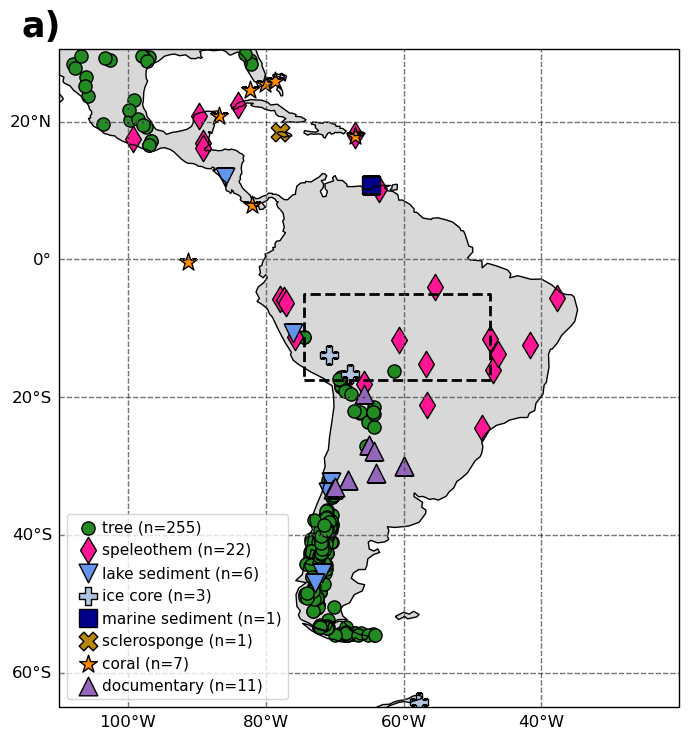

In [31]:
fig=plot_1a(proxy_folder='/home/mchoblet/paleoda/data/proxy_dbs/paper/')
fig.savefig(savepath+'availability_spatial.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [32]:
def plot_1b( proxy_folder='/home/mchoblet/paleoda/data/proxy_dbs/paper/'):
    """
    Temporal availability (on a decadal scale)
    """
    proxies={
        'tree':proxy_folder+'trees_best_ann.nc',
        'speleothem':proxy_folder+'speleos.nc',
        'lake sediment':proxy_folder+'lakes.nc',
        'ice core':proxy_folder+'glacier_ice.nc',
        'marine sediment':proxy_folder+'marine.nc',
        'sclerosponge':proxy_folder+'sclero.nc',
        'coral':proxy_folder+'corals_ann.nc',
        'documentary': proxy_folder+'historical_ann.nc',
    }

    decadal_dic={}
    for k,p in proxies.items():
        db=xr.open_dataset(p,use_cftime=True).to_array().squeeze(dim='variable')
        
        
        db=db.sel(time=slice('0001','2000'))
        bubul=db.resample(time='10YS').mean()
        #push site to last dimension
        bubul=bubul.transpose(...,'site')    
        decadal=np.count_nonzero(~np.isnan(bubul),axis=1)
        
        decadal_dic[k]=decadal


    keys={'tree':'forestgreen','speleothem':'deeppink','coral':'darkorange','marine sediment':'darkblue','lake sediment':'cornflowerblue','ice core':'lightsteelblue',
             'sclerosponge':'darkgoldenrod','documentary':'tab:purple'
         } #here define order as they appear in the plot + colors

    #Plot: Go through proxies_c in a specific order to add them up wisely
    #Tree rings #Speleothems #Corals + Sclerosponges #Marine sediments #Lake sediments #Ice cores # wood delta eight0:
    #ylim 0,150?
    #Do a separate plot for the first millennium inside with a smaller ylim (20?)

    figsize=(12,7)
    fig,ax=plt.subplots(figsize=figsize)
    time_axis=np.arange(0,1999,10)
    y1=np.zeros(len(time_axis))
    #for key in keys:
    for key in decadal_dic:
        vals=decadal_dic[key]
        y2=y1+vals #only add values where there are some!
        ax.fill_between(time_axis[vals!=0],y2[vals!=0],y1[vals!=0],color=keys[key],label=key)
        y1=y2

    ax.tick_params(axis='both', which='major', labelsize=20)

    ax.yaxis.set_label_position("right")
    ax.yaxis.tick_right()
    ax.set_xlabel('Year [CE]',fontsize=24)
    ax.set_ylabel('Proxy record number ',fontsize=24)
    ax.set_ylim(0,310)
    #ax.spines['left'].set_visible(False)
    #ax.spines['right'].set_visible(True)
    ax.spines[:].set_visible(True)

    ax.set_title('Temporal availability',fontsize=30)
    #ax.legend(fontsize=20,bbox_to_anchor=(1.5, 1))
    ax.legend(fontsize=20,bbox_to_anchor=(1.07, -0.2),ncols=3)
    #plt.gca().yaxis.grid(True)
    plt.gca().grid(False)

    #Inside plot for the first millennium
    ax2 = ax.inset_axes([0.024,0.39,0.497,0.5])
    #inset_axes(ax, width="50%", height="40%", loc=2)
    time_axis=np.arange(0,1009,10)
    y1=np.zeros(len(time_axis))
    #for key in keys:
    for key in decadal_dic:    
        vals=decadal_dic[key][:101]   
        #if np.count_nonzero(vals)>0:
        y2=y1+vals
        ax2.fill_between(time_axis[vals!=0],y2[vals!=0],y1[vals!=0],color=keys[key])
        y1=y2  

    #ax2.spines['left'].set_visible(False)
    #ax2.spines['bottom'].set_visible(False)
    #ax2.spines['right'].set_visible(False)
    #[ax2.spines[s].s.set_visible(True) for s in ax2.spines]
    ax2.spines[:].set_visible(True)
    ax2.xaxis.set_visible(False)
    #ax2.grid(True)
    ax2.tick_params(axis='both',labelsize=20)
    ax2.locator_params(nbins=4,axis='y')
    plt.gca().grid(False)

    ax2.set_title('First Millennium',fontsize=20)
    ax2.yaxis.set_label_position("right")
    ax2.yaxis.tick_right()


    ax.text(-0.02, 1.04, 'b)', transform=ax.transAxes, size=30,weight='bold')

    return fig

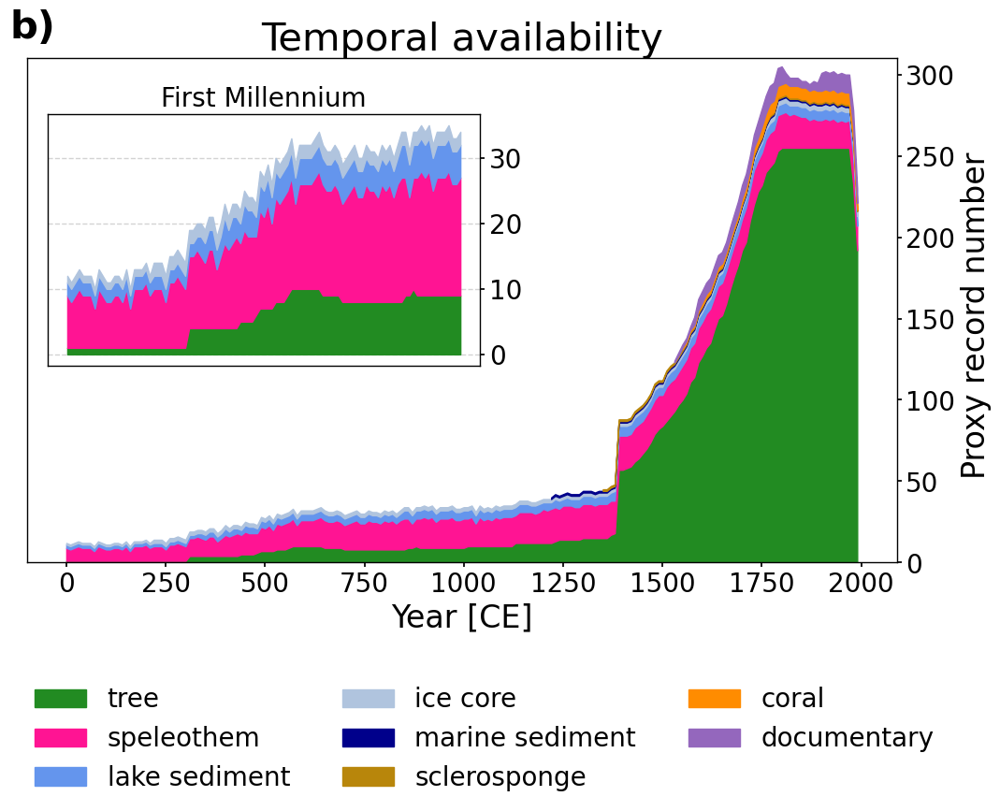

In [33]:
fig=plot_1b(proxy_folder='/home/mchoblet/paleoda/data/proxy_dbs/paper/')
fig.savefig(savepath+'availability_temp.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [34]:
def plot_1_app(proxy_folder='/home/mchoblet/paleoda/data/proxy_dbs/paper/'):
    """
    Availabity of proxy records by century (figure in the appendix)
    """
    proxies={
        'tree':proxy_folder+'trees_best_ann.nc',
        'speleothem':proxy_folder+'speleos.nc',
        'lake sediment':proxy_folder+'lakes.nc',
        'ice core':proxy_folder+'glacier_ice.nc',
        'marine sediment':proxy_folder+'marine.nc',
        'sclerosponge':proxy_folder+'sclero.nc',
        'coral':proxy_folder+'corals_ann.nc',
        'documentary': proxy_folder+'historical_ann.nc',
    }    

    markers_dict={'tree':'.','speleothem':'d','coral':'*','marine sediment':'s','lake sediment':'v',
                  'ice core':'P',
             'sclerosponge':'X','documentary':'^',
         }
    keys={'tree':'forestgreen','speleothem':'deeppink','coral':'darkorange','marine sediment':'darkblue','lake sediment':'cornflowerblue','ice core':'lightsteelblue',
             'sclerosponge':'darkgoldenrod','documentary':'tab:purple',
         } 

    title_size=30
    title_weight=None
    title=False
    figsize=[9, 12]
    projection=ccrs.PlateCarree()
    markersize=160
    legend_fontsize=15
    map_extent=[250,340,-65,32]
    labelsize=12
    draw_labels=True
    alpha=1


    #one pannel for each century, plot availability
    fig, axes = plt.subplots(5, 4, figsize=(15, 18), subplot_kw={'projection': ccrs.PlateCarree()})       
    draw_labels=False

    s_plots=[]
    type_names=[]

    rivers = cfeature.NaturalEarthFeature(
    category='physical',
    name='rivers_lake_centerlines',
    scale='110m',
    #scale='50m',
    facecolor='none',
    #edgecolor=cfeature.COLORS['water'])
    edgecolor='blue')

    for iii,ax in enumerate(axes.flatten()):

        #if iii==19:
        title=str((iii)*100+1)+'-'+str((iii+1)*100)+' CE'
        ax.set_title(title,fontsize=15)

        ax.set_global()
        ax.add_feature(cfeature.LAND, facecolor='gray', alpha=0.3)
        
        ax.add_feature(cfeature.COASTLINE)
        ax.set_extent([240,340,-70,31,], crs=ccrs.PlateCarree())
        #gl=ax.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=draw_labels, dms=True, x_inline=False, y_inline=False)
        ax.axes.xaxis.set_visible(True)
        ax.axes.yaxis.set_visible(True)
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
        #gl.xlabel_style = {'size': labelsize}
        #gl.ylabel_style = {'size': labelsize}
        #gl.top_labels = False
        #gl.right_labels = False

        ax.add_feature(rivers)
        #ax.stock_img()

        ax.plot([285.5,312.5,312.5,285.5,285.5],[-17.5,-17.5,-5,-5,-17.5], transform=ccrs.PlateCarree(),color='black',lw=2,ls='-')

        for i,(a,p) in enumerate(proxies.items()):
            db=xr.open_dataset(p,use_cftime=True).to_array().squeeze(dim='variable')
            db2=db.isel(time=slice(iii*100,(iii+1)*100)).transpose('time',...)
            db2=db2[:,np.any(~np.isnan(db2.values),axis=0)]
            if len(db.site)>0:
                if a=='tree':
                    bu=ax.scatter(
                        db2['geo_meanLon'],db2['geo_meanLat'],
                        marker=markers_dict[a],
                        c=keys[a],
                        edgecolor='k',s=markersize*2, transform=ccrs.Geodetic(),zorder=1,alpha=alpha
                    )
                else:
                    bu=ax.scatter(
                        db2['geo_meanLon'],db2['geo_meanLat'],
                        marker=markers_dict[a],
                        c=keys[a],
                        edgecolor='k',s=markersize, transform=ccrs.Geodetic(),zorder=1,alpha=alpha
                    )
            if iii==19: #add for legend
                s_plots.append(bu)
                type_names.append(a)

    plt.legend(s_plots, type_names,scatterpoints=1,loc='lower right',fontsize=legend_fontsize, bbox_to_anchor=(2.15,2.3), frameon=True,framealpha=0.8)   
    plt.subplots_adjust(wspace=-0.25,hspace=0.15)
    return fig

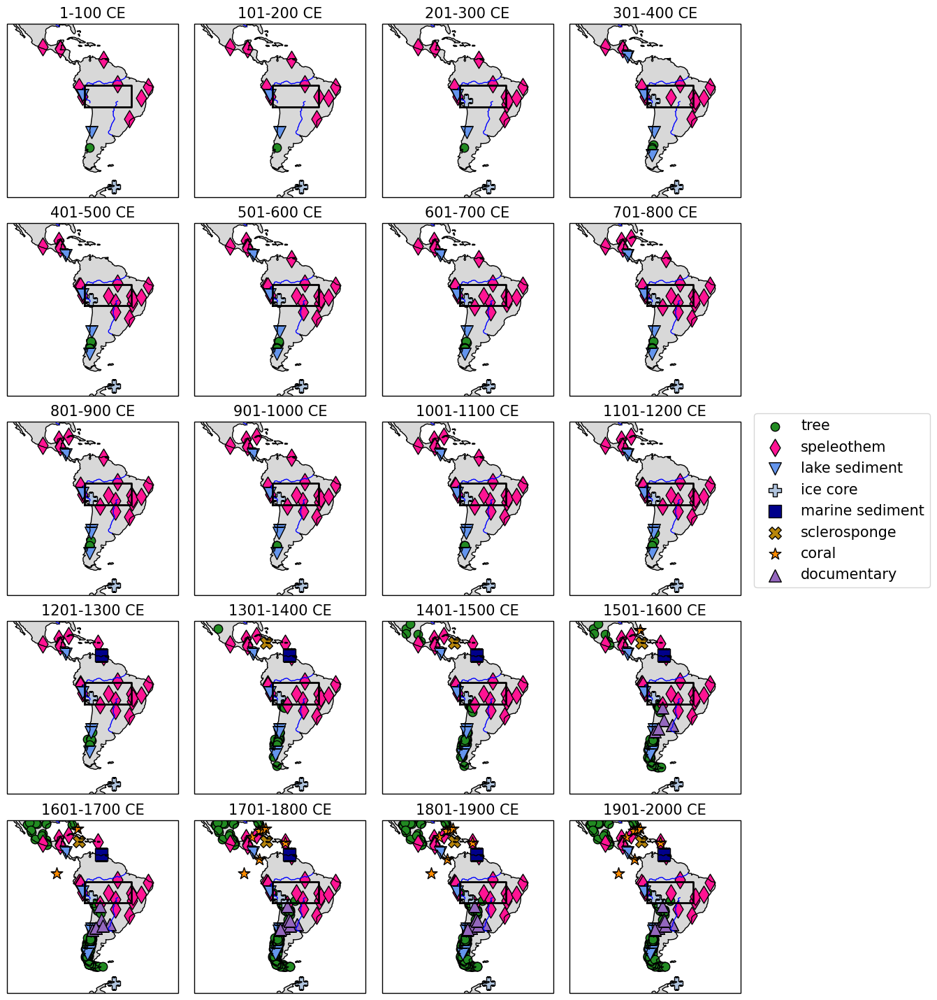

In [35]:
fig=plot_1_app(proxy_folder='/home/mchoblet/paleoda/data/proxy_dbs/paper/')
fig.savefig(savepath+'availability_spatial_cent.pdf', dpi='figure', format='pdf',bbox_inches='tight')

# 2) Validation: Withheld proxy records

-> Make sure the validation metrics are only computed for the period 850 - 1850 to have a fair comparison to the model priors!

In [36]:
import sys
#adjust this to the file path where utils_new and kalman_filters is stored!
sys.path.append('/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/')
from types import SimpleNamespace
import utils_new

In [37]:
##PREWORK FOR INTERNAL VALIDATION PLOT

## Internal validation requires loading model priors and exctract proxy estimates, this way I can compute the improvement by the reconstruction

basepath3='/home/mchoblet/paleoda/data/model_data/upsampled/'

model_names={'CESM':
    {'tsurf':'CESM_tsurf_850_1850.nc',
     'prec':'CESM_prec_850_1850.nc',
     'd18O': 'CESM_d18O_850_1850.nc',
     'spei':'CESM_spei_pearson_12.nc',
    },
'isoGSM':
    {'tsurf':'CCSM_tsurf_851_1850.nc',
     'prec':'CCSM_prec_851_1850.nc',
     'd18O': 'CCSM_d18O_851_1850.nc',
     'spei':'CCSM_spei_pearson_12.nc',
    },
'iHadCM3':
    {'tsurf':'iHADCM3_tsurf_801_1952.nc',
     'prec':'iHADCM3_prec_801_1952.nc',
     'd18O': 'iHADCM3_d18O_801_1952.nc',
     'spei':'iHADCM3_spei_pearson_12.nc',
    },
'ECHAM5':
    {'tsurf':'ECHAM5_tsurf_850_1849.nc',
     'prec':'ECHAM5_prec_850_1849.nc',
    'd18O': 'ECHAM5_d18O_850_1849.nc',
     'spei':'ECHAM5_spei_pearson_12.nc',
    },
'GISS':
    {'tsurf':'GISS_tsurf_850_1849.nc',
     'prec':'GISS_prec_850_1849.nc',
   'd18O': 'GISS_d18O_850_1849.nc',
     'spei':'GISS_spei_pearson_12.nc',
    }
    }

cfg={
    'basepath':'/home/mchoblet/paleoda/data/model_data/upsampled/', #for the modeldata
        'vp':{
    'd18O':'ECHAM5_d18O_850_1849.nc',
    'prec':'ECHAM5_prec_850_1849.nc',
    'tsurf': 'ECHAM5_tsurf_850_1849.nc',
    #'slp': 'ECHAM5_slp_850_1849.nc',
    'spei': 'ECHAM5_spei_851_1849.nc', #shorter by one year :-> limit all reconstructions to that time
    #'pdsi': 'ECHAM5_pdsi_850_1849.nc',
    },
    'savepath':'/home/mchoblet/paleoda/results/experiments/paper/annual/normal/test.nc',
    'multi_model_prior':None,
    'prior_cut_time':['0852'], #due to the calculation of the spei, we loose one year and have to cut all priors according
    'avg':[12,1,2], #this is the interesting part
    'avg_proxies':4, #How to treat the annual proxies (from which month to start) 
    'seed': 42, 
    'obsdata':[
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_djf.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_djf.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes_ann.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/historical_ann.nc',
        ],
    'proxy_time':['0001','2000'], #only cut the proxies after resampling them (else we might loose resampling info for the last point (smaller zero?)
    'resample_mode': 'nearest',
    'mask': 3, 
    'psm':['individual','individual','prec_weighted','individual','individual','individual', 'prec_weighted','individual'], #individual will loop over each proxy. season check t
    'timescales':['1','5','10'], #all timescales
    'db_timescales':['1','1','1','5','1','5','10','1'], #for each db define a timescale on that it is supposed to be used
    #'db_timescales':['1','1','5','1','5','10'], #for each db define a timescale on that it is supposed to be used
    'reuse':False, #testwise to true
    #'noise_assum':['None','None',0.5,0.5,0.5,0.5,0.5],
    'noise_assum':['None','None',0.5,0.5,0.5,0.5,'equal','None'],
    'equal_fac':1, #option in case I use noise_assum='equal'. This way I can multiply the error with a factor
    #'noise_assum':['None',0.5,0.5,0.5,0.5,0.5],
    ###KALMAN-FILTER
    'time': ['0001','2000'], #Add zero for 3digit years (e.g. 0850)
    'anomaly_time':['1750','1850'],
    'regional_bounds':[[-65,35],[250,340]], #sorted from negative to positive!!
    'reps':50, #number of monte carlo repetition
    'seed':42, #seed for random number generator
    'nens':100, #ensemble members | M.C 
    'proxy_frac':0.8,
    'proxy_fac':1,
    #'proxy_frac':None,
    'smallest_timescale':1,
}

exp_config={
    'all_proxies':
        {
       'obsdata':[
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_best_ann.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_ann.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/puyehue_ann.nc',
        #'/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes_ann.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc',
           '/home/mchoblet/paleoda/data/proxy_dbs/paper/historical_ann.nc',
        ],
        'psm':['individual','individual','individual','individual','individual','individual','prec_weighted', 'prec_weighted','individual'],
        'db_timescales':['1','1','1','5','5','1','1','10','1'],   
        'timescales':['1','5','10'],
        'noise_assum':['None','None',0.5,0.5,0.5,'None',0.5,0.5,'None'],
        'proxy_frac_check':True,
        }}
    
cfg['avg_proxies']=4
folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/'


prior_metrics={}


for name,conf in exp_config['all_proxies'].items():
    cfg[name]=conf
#loop over models
for mods, modpaths in model_names.items():
    cfg['vp']=modpaths

    c=SimpleNamespace(**cfg)
    #load proxiy databases
    proxy_db_all=utils_new.load_proxies(c)
    #get the list of variables and seasons required for PSMs
    variab_list,variab_season_dict=utils_new.variable_prep(proxy_db_all)
    #load priors, apply psms. multi-model loop is an artefact from times where i used the multi-model ensemble directly. now i perform reconstructions separately and compute the mean afterwards
    split_vector,names_vector,values_vector,names_short_vector,values_vector_list,MC_idx_list,HXfull_all_fin,coordinates=utils_new.load_priors_psm(c,variab_list,variab_season_dict,proxy_db_all)
    final_list,final_list_r=utils_new.resample_wrap(c,proxy_db_all,HXfull_all_fin)

    prior_var=[]
    prior_r=[]
    prior_ce=[]
    prior_eff=[]

    start=0
    end=0
    for i,f in enumerate(proxy_db_all):
        num=start+f.shape[1]
        d=HXfull_all_fin[:,start:num] #model prior
        d=d.sel(time=slice('0850','1850')) #some models go into the instrumental era. for fair comparison need to exclude that part
        #resample the model data to the target resolution. to not have issue about the right time stamp, use a running mean. times will be selected later according to time stamps in the proxy data
        res=c.db_timescales[i]
        d=d.resample(time=res+'YS').mean()
        start=num
        num_p=f.shape[1]
        for i in range(num_p):
            model=d[:,i]
            prox=f[:,i]
            try:
                model=d[:,i]
            except:
                model=d
            try:
                prox=f[:,i]
            except:
                prox=f
            dropna=prox.dropna('time').time.dt.year.values
            model=model[model.time.dt.year.isin(dropna)]
            years=model.time.dt.year.values
            prox=prox[prox.time.dt.year.isin(years)]
            corr=np.corrcoef(model,prox)[0,1]
            model['time']=prox['time'].values
            eff_p=xss.pearson_r_eff_p_value(model,prox).values
            denom=np.sum((prox.values-prox.mean('time').values)**2)
            nom=np.sum((model.values-prox.values)**2)

            prior_r.append(corr)
            prior_ce.append(1-nom/denom)
            prior_var.append(np.var(model.values))
            prior_eff.append(eff_p)
            
    prior_metrics[mods]={'prior_var':prior_var,'prior_r':prior_r,'prior_ce':prior_ce,'prior_eff':prior_eff}

#compute mean over models
corrs=np.mean([prior_metrics[k]['prior_r'] for k in prior_metrics.keys()],axis=0)
eff_p=np.mean([prior_metrics[k]['prior_eff'] for k in prior_metrics.keys()],axis=0)
ces=np.mean([prior_metrics[k]['prior_ce'] for k in prior_metrics.keys()],axis=0)
varis=np.mean([prior_metrics[k]['prior_var'] for k in prior_metrics.keys()],axis=0)

/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/pap

Load prior data
Compute seasonal means
Apply Proxy System Models
Resample proxy records


100%|██████████| 22/22 [00:01<00:00, 18.31it/s]
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/m

Load prior data
Compute seasonal means
Apply Proxy System Models
Resample proxy records


100%|██████████| 22/22 [00:01<00:00, 18.13it/s]
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/m

Load prior data
Compute seasonal means
Apply Proxy System Models
Resample proxy records


100%|██████████| 22/22 [00:01<00:00, 18.31it/s]
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/m

Load prior data
Compute seasonal means
Apply Proxy System Models
Resample proxy records


100%|██████████| 22/22 [00:01<00:00, 18.18it/s]
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/mchoblet/paleoda/notebooks_misc/south_america/paper_github/algorithm/utils_new.py:775: UserWarning: rename 'geo_siteName' to 'site' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  proxy_db=proxy_db.rename({'geo_siteName':'site'})
/home/m

Load prior data
Compute seasonal means
Apply Proxy System Models
Resample proxy records


100%|██████████| 22/22 [00:01<00:00, 18.29it/s]


In [38]:
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/'
files=listdir(comparison_folder)
file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True) for f in files]
combined_dataset = xr.concat(file_l, dim='dataset')
recon=combined_dataset.mean('dataset') #using the mean across the five model priors. the proxies that are used in each monte carlo repetition are the same across models, so it's not necessary to compute the correlations for each reconstruction
#separately, but I can just take the mean across the five reconstructions



corr_l=[]
ce_l=[]
vari_l=[]
eff_l=[]
reps_l=[]

start=0
for i,n in enumerate(['proxies_res_1','proxies_res_5','proxies_res_10']):
    resampled=recon[n]
    end=start+resampled.shape[1]
    #get model estimate
    #print(start,end)
    mod_est=recon['proxy_est'][:,:,start:end]
    #resample to r
    mod_est=mod_est.resample(time=(['1','5','10'][i]+'YS')).mean()
    #loop over proxy records
    number=mod_est.shape[-1]
    for ii in range(number):
        mod_est_ii=mod_est[:,:,ii].dropna('reps')
        

        truth=resampled[:,ii]
        #adaptation for fair comparison!
        truth=truth.sel({truth.dims[0]:slice("0850","1850")}) 
        mod_est_ii=mod_est_ii.sel(time=slice("0850","1850"))
        
        mask=~np.isnan(truth).values
        truth=truth[mask]
        #debias with respect to same period
        truth=truth.rename({truth.dims[0]:'time'})
        #truth-=truth.sel(time=slice('1750','1850')).mean('time')
        #mod_est_ii-=mod_est_ii.sel(time=slice('1750','1850')).mean('time')
        
        #loop over repetitions
        corr=[]
        ce=[]
        effp=[]
        vari=[]
        reps=mod_est_ii.shape[0]
        reps_l.append(reps)
        for rep in range(reps):
            mod_est_ii_rep=mod_est_ii[rep]
            mod_est_ii_rep=mod_est_ii_rep[mask]
            
            #compute correlation
            corr.append(np.corrcoef(mod_est_ii_rep.values,truth.values)[0,1])
            mod_est_ii_rep['time']=truth[truth.dims[0]].values
            effp.append(xss.pearson_r_eff_p_value(mod_est_ii_rep,truth).values)
            #compute coefficient of efficiency
            ce.append(1-np.sum((mod_est_ii_rep.values-truth.values)**2)/np.sum((truth-truth.mean().values)**2))
            #compute variance
            vari.append(np.var(mod_est_ii_rep.values))
        corr_l.append(np.mean(corr))
        eff_l.append(np.mean(effp))
        ce_l.append(np.mean(ce))
        vari_l.append(np.mean(vari))
    start=end  #reset index for looping thruh all reconstructed proxy records
    
#convert to numpy arrays
corr_l=np.array(corr_l)
ce_l=np.array(ce_l)
eff_l=np.array(eff_l)
vari_l=np.array(vari_l)

model_stats=[corrs,ces,eff_p]
recon_stats=[corr_l,ce_l,eff_l]

In [39]:
def internal_validation(title='Internal validation for withheld proxy records'):
    """
    Subplots with histograms of correlation, CE for reconstruction and model priors, values plotted as scatter plot on a map + difference between reconstruction and prior.
    Obviously a pretty tuned plot. Too many possibilities to change it, so no options here.
    
    """
    ######FIGURE LAYOUT
    from matplotlib import cm as cm
    title_size=30
    title_weight=None
    projection=ccrs.PlateCarree()
    markersize=60
    legend_fontsize=11
    map_extent=[250,340,-65,31]
    labelsize=15
    fontsize=23
    draw_labels=True
    alpha=1
    y=0.99
    boxsize=14

    fig = plt.figure(figsize=(18,12))
    fig.suptitle(title, fontsize=title_size, fontweight=title_weight)
    gs = fig.add_gridspec(ncols=3,nrows=2)
    axes = [fig.add_subplot(gs[j,1+i],projection=projection) for i in range(2) for j in range(2)]+[fig.add_subplot(gs[0,0]),fig.add_subplot(gs[1,0])]

    for i in range(4):
        ax=axes[i]
        ax.set_extent(map_extent, crs=ccrs.PlateCarree())
        fig.suptitle(title, fontsize=title_size, fontweight=title_weight,y=1.01)

        #ax.set_global()
        ax.add_feature(cfeature.LAND, facecolor='gray', alpha=0.3)
        #ax.gridlines(edgecolor='gray', linestyle=':')
        ax.add_feature(cfeature.COASTLINE)

        """
        gl=ax.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=False, dms=True, x_inline=False, y_inline=False)
        ax.axes.xaxis.set_visible(True)
        ax.axes.yaxis.set_visible(True)
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
        #gl.xlabel_style = {'size': labelsize}
        #gl.ylabel_style = {'size': labelsize}
        gl.top_labels = False
        gl.right_labels = False
        #ax.stock_img()
        """
        rivers = cfeature.NaturalEarthFeature(
            category='physical',
            name='rivers_lake_centerlines',
            scale='110m',
            #scale='50m',
            facecolor='none',
            #edgecolor=cfeature.COLORS['water'])
            edgecolor='blue')

        ax.add_feature(rivers)
        s_plots=[]
        type_names=[]
        #ax.stock_img()

    ######## GET PROXY LOCATIONS (order is crucial!, needs to be same as in the PaleoDA algorithm)

        #extract proxy record locations for location on map
        proxies=[    
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_best_ann.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_ann.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/puyehue_ann.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc',
             '/home/mchoblet/paleoda/data/proxy_dbs/paper/historical_ann.nc',
        ]
        names=[]
        lats=[]
        lons=[]
        for p in proxies:
            data=xr.open_dataset(p,use_cftime=True)
            #drop_vars=[v for v in list(data.coords) if v not in ['geo_siteName','geo_meanLat','geo_meanLon'] ]
            #data=data.drop(drop_vars)
            names.append(data['geo_siteName'].values)
            lats.append(data['geo_meanLat'].values)
            lons.append(data['geo_meanLon'].values)
        names=np.concatenate(names)
        lats=np.concatenate(lats)
        lons=np.concatenate(lons)    


    ######FILL MAPS WITH DATA

    titles=['Corr','COE','Corr-Corr$_{\mathrm{prior}}$','COE-COE$_{\mathrm{prior}}$']

    cmap = cm.get_cmap('RdBu_r', 10)

    for i,d in enumerate([recon_stats[0],recon_stats[1],recon_stats[0]-model_stats[0],recon_stats[1]-model_stats[1]]):
        #"""
        p=axes[i].scatter(
                    lons,lats,
                    marker='o',
                    c=d,
                    edgecolor='k',
                    s=markersize*2, transform=ccrs.PlateCarree(),zorder=1,alpha=alpha,cmap=cmap,vmin=-1,vmax=1
                )
        #"""
        #pass
        axes[i].set_title(titles[i],fontsize=fontsize)

        p0=axes[i].get_position().get_points().flatten()
        ax_cbar1 = fig.add_axes([p0[2]+0.02, p0[1], 0.01, p0[3]-p0[1]])
        cb=fig.colorbar(p, cax=ax_cbar1, orientation='vertical',cmap=cmap)
        cb.ax.tick_params(labelsize=labelsize)
        #cb.set_label('Correlation',fontsize=labelsize)
        #cb.ax.locator_params(nbins=3)
        cb.set_ticks([-1, 0, 1])

        if i>=2:
            #add textbox
            textstr = '\n'.join((
        r'median$=%.2f$' % (np.median(d),),
        r'%%+$=%.2f$' % (np.count_nonzero(d>0)/len(d)*100)))
            props = dict(boxstyle='round', facecolor='white',alpha=1)
            # place a text box in upper right in axes coords
            axes[i].text(0.65, 0.95, textstr, transform=axes[i].transAxes, fontsize=boxsize,verticalalignment='top', bbox=props)

    ### CORR

    #len(eff_a[(eff_a<0.05) & (corr_l_a>0)])/len(eff_a)

    #HISTOGRAMS
    for i,d in enumerate([[recon_stats[0],model_stats[0]],[recon_stats[1],model_stats[1]]]):
        ax2=axes[[4,5][i]]
        for ii in range(2):
            data=d[ii]
            ax2.hist(data,color=['tab:blue','tab:orange'][ii],alpha=0.5,bins=np.arange(-1,1,0.1),label=['reconstruction','simulations'][ii]) #note that more negative values are exlucded via with binning
            median=np.median(data)
            ax2.axvline(median,c=['tab:blue','tab:orange'][ii],lw=3)
            #hacky way to add information into the legend (boxplot not so nice because its difficult to get the color of the line in there)
            ax2.plot([],[],lw=0,label=('median: '+str(np.round(np.median(data),2))))
            ax2.plot([],[],lw=0,label=('%+: '+str(np.round(np.count_nonzero(data>0)/len(data)*100,2))))
            if i==0:
                ax2.plot([],[],lw=0,label=('%+sig: '+str(np.round(np.count_nonzero([recon_stats[2],model_stats[2]][ii]<0.05)/len(data)*100,2))))
            ax2.set_xlim(-1,1.1)
        ax2.legend(markerfirst=False,fontsize=boxsize,frameon=True,loc='upper right',framealpha=1,bbox_to_anchor=(1.18, 1))
        ax2.tick_params(axis='both',labelsize=labelsize)
        ax2.set_xlabel(['Correlation','Coefficient of Efficiency'][i],fontsize=18)
        ax2.set_ylabel('Proxy record number',fontsize=18)

    #ADD TEXTS
    for i,t in enumerate(['b)','e)','c)','f)','a)','d)']):
        axes[i].text(-0.1, 1.05, t, transform=axes[i].transAxes, size=20,weight='bold')
    
    #prop={'size': 15}
    plt.subplots_adjust(wspace=0.3)
    return fig

/tmp/ipykernel_56072/153419457.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdBu_r', 10)


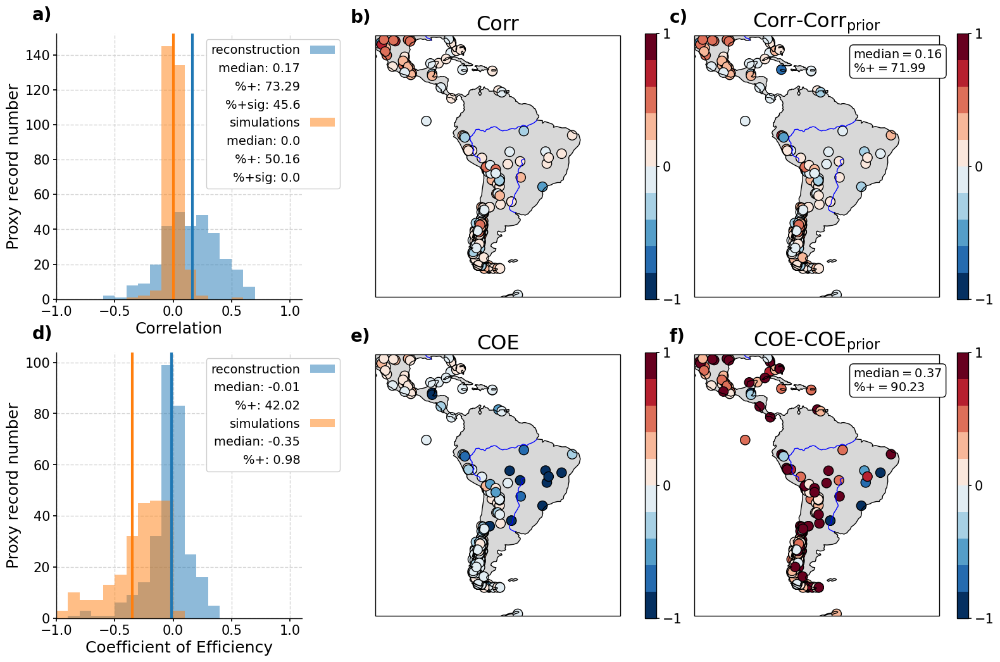

In [40]:
#new internal validation (with historical record)
fig=internal_validation(title='')
fig.savefig(savepath+'validation.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [41]:
print('Important to mention:')
print('CE datapoints left out (<-1): ',np.count_nonzero(model_stats[1]<-1)/len(model_stats[1])*100,' %')
#don't forget to metnion this

Important to mention:
CE datapoints left out (<-1):  25.407166123778502  %


In [42]:
def plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
              title='Correlation of withheld proxy records',
           selection=True
          ):
    """
    (Finally not used in the paper)
    
    Internal validation by computing correlation of true proxy record to reconstructed proxy record, when proxy record is not used in reconstruction.
    The correlation has alread been computed during the reconstruction (although I can compute it also in retrospect)
    
    selection: If true, only proxy records with values prior to 1000 are used
    """
    files=listdir(comparison_folder)
    file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True) for f in files]
    combined_dataset = xr.concat(file_l, dim='dataset')
    recon=combined_dataset.mean('dataset')

    data=recon
    if selection:
        selection=[]
        for var in ['proxies_res_1','proxies_res_5','proxies_res_10']:
            ts=data[var]
            dim=ts.dims
            ts=ts[dim[1]]
            for i,t in enumerate(ts):
                sel=data[var][:,i]
                fy=sel.dropna(sel.dims[0])[sel.dims[0]].dt.year[0].values.item()
                if fy<1000:
                    selection.append(t.values.item())

        mask=np.isin(recon.site,selection)
        long_enough=recon['corr_withheld_proxies'][mask]
    else:
        long_enough=recon['corr_withheld_proxies']
    
    proxies=[    
                '/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_best_ann.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_ann.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/puyehue_ann.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc',
            '/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc',
    ]
    names=[]
    lats=[]
    lons=[]
    for p in proxies:
        data=xr.open_dataset(p,use_cftime=True)
        #drop_vars=[v for v in list(data.coords) if v not in ['geo_siteName','geo_meanLat','geo_meanLon'] ]
        #data=data.drop(drop_vars)
        names.append(data['geo_siteName'].values)
        lats.append(data['geo_meanLat'].values)
        lons.append(data['geo_meanLon'].values)
    names=np.concatenate(names)
    lats=np.concatenate(lats)
    lons=np.concatenate(lons)
    
    if selection:
        indices = np.where(np.isin(names,long_enough['site'].values))[0]
        long_enough_lon=lons[indices]
        long_enough_lat=lats[indices]
    else:
        long_enough_lon=lons
        long_enough_lat=lats

    from matplotlib import cm as cm

    title_size=30
    title_weight=None

    figsize=[8, 12]
    projection=ccrs.PlateCarree()
    markersize=130
    legend_fontsize=11
    map_extent=[250,340,-65,35]
    labelsize=12
    draw_labels=True
    alpha=1

    fig = plt.figure(figsize=(12,5))
    gs = fig.add_gridspec(ncols=2,nrows=1)
    ax = fig.add_subplot(gs[0,1],projection=projection)
    ax.set_extent(map_extent, crs=ccrs.PlateCarree())
    fig.suptitle(title, fontsize=title_size, fontweight=title_weight,y=1.01)

    #ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor='gray', alpha=0.3)
    ax.gridlines(edgecolor='gray', linestyle=':')
    ax.add_feature(cfeature.COASTLINE)

    aa=8
    bb=1.5
    
    gl=ax.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=draw_labels, dms=True, x_inline=False, y_inline=False)
    ax.axes.xaxis.set_visible(True)
    ax.axes.yaxis.set_visible(True)
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])
    gl.xlabel_style = {'size': labelsize+bb}
    gl.ylabel_style = {'size': labelsize+bb}
    gl.top_labels = False
    gl.right_labels = False
    #ax.stock_img()

    rivers = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='110m',
        #scale='50m',
        facecolor='none',
        #edgecolor=cfeature.COLORS['water'])
        edgecolor='blue')

    ax.add_feature(rivers)
    s_plots=[]
    type_names=[]

    cmap = cm.get_cmap('RdBu_r', 10)

    p1=ax.scatter(
                long_enough_lon,long_enough_lat,
                marker='o',
                c=long_enough,
                edgecolor='k',s=markersize*2, transform=ccrs.PlateCarree(),zorder=1,alpha=alpha,cmap=cmap,vmin=-1,vmax=1
            )
    ax.stock_img()

    # plot legend
    #plt.legend(s_plots, type_names,scatterpoints=1,loc='lower left',fontsize=legend_fontsize,frameon=True,framealpha=0.8)
    ax2 = fig.add_subplot(gs[0,0])

    ax2.hist(long_enough)
    median=np.median(long_enough)
    ax2.axvline(median,c='blue',lw=3)
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    ax2.text(0.65,0.95,('Median '+str(np.round(median,2))), transform=ax2.transAxes, fontsize=labelsize+5, verticalalignment='top', bbox=props)   
    ax2.tick_params(axis='both',labelsize=labelsize+bb)
    ax2.set_xlabel('Correlation',fontsize=labelsize+aa)
    ax2.set_ylabel('Number of records',fontsize=labelsize+aa)

    p0=ax.get_position().get_points().flatten()
    ax_cbar1 = fig.add_axes([p0[2]+0.02, p0[1], 0.01, p0[3]-p0[1]])
    cb=fig.colorbar(p1, cax=ax_cbar1, orientation='vertical',cmap=cmap)
    cb.ax.tick_params(labelsize=labelsize+bb)
    cb.set_label('Correlation',fontsize=labelsize+aa)
    #cb.ax.locator_params(nbins=3)
    cb.set_ticks([-1, 0, 1])
    
    ax.text(-0.1, 1, 'b)', transform=ax.transAxes, size=20,weight='bold')
    ax2.text(-0.1, 1, 'a)', transform=ax2.transAxes, size=20,weight='bold')
    
    return fig

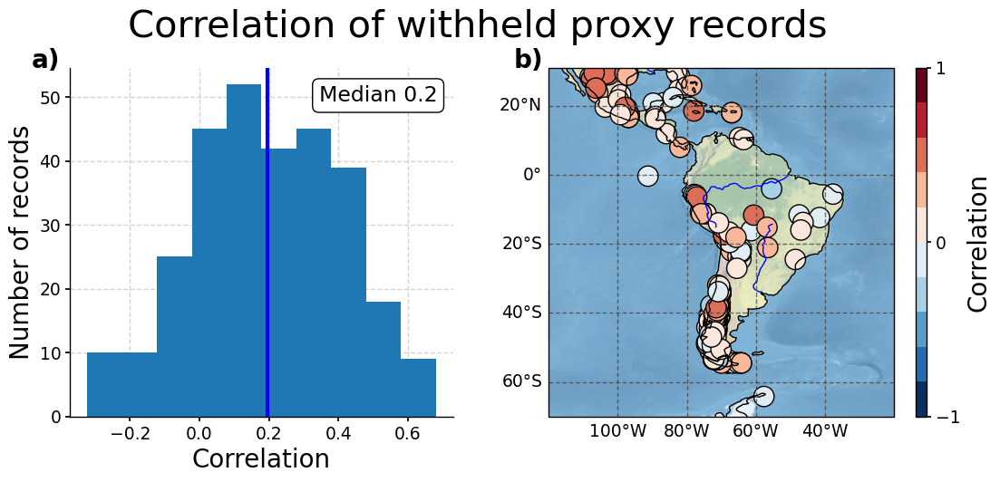

In [118]:
"""
fig_withheld_old=plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/all_proxies/',selection=True)
fig_withheld=plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/all_proxies/',selection=False)
plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final/same_err/annual/proxy_frac/all_proxies/', title='Correlation of withheld proxy records (same error)')
plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/half_err/annual/proxy_frac/all_proxies/', title='Correlation of withheld proxy records (half error)')
plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/all_proxies/',
              title='Correlation of withheld proxy records (all)',
           selection=False
          )
plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/same_err/annual/proxy_frac/all_proxies/',
              title='Correlation of withheld proxy records (all) (same error)',
           selection=False
          )
plot_2(comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/half_err/annual/proxy_frac/all_proxies/', title='Correlation of withheld proxy records (half error)',selection=False)
"""

# 2. Additional validation of reconstruction (Transfered to appendix)

* Text description can be found in Appendix B of the publication

**Requires comparison datasets regridded to reconstruction resolution** (see text at beginning of the notebook)

In [43]:
#LOAD comparison datasets
sada=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/scPDSI_SADA_annual-djf_1400_2000.nc')['scpdsi'].resample(time='YS').mean('time')

bathpath='/home/mchoblet/validation_data/sa_project/upsampled/'
avg=4
valid_ds={
    'tsurf':annual_mean(xr.open_dataset(bathpath+'be.nc')['temperature'],avg),
    'prec':annual_mean(xr.open_dataset(bathpath+'cru_prec.nc').to_array().squeeze('variable'),avg),
    'spei':annual_mean(xr.open_dataset(bathpath+'cru_spei_pearson_12.nc').to_array().squeeze('variable').transpose('time',...),avg),
}

avg=[12,1,2]
valid_ds_djf={
    'tsurf':annual_mean(xr.open_dataset(bathpath+'be.nc')['temperature'],avg),
    'prec':annual_mean(xr.open_dataset(bathpath+'cru_prec.nc').to_array().squeeze('variable'),avg),
    'spei':annual_mean(xr.open_dataset(bathpath+'cru_spei_pearson_12.nc').to_array().squeeze('variable').transpose('time',...),avg),
}

#mean reference stds for annual and djf means in form of a dictionary

ref_folder='/home/mchoblet/paleoda/data/model_data/upsampled/'
files=listdir(ref_folder)

dic0={}
for avg in [4,[12,1,2]]:
    dic1={}
    for v in ['tsurf','prec','spei_pearson_12']:
        if v=='spei_pearson_12': v2='spei'
        else: v2=v
        file_l=[annual_mean(xr.open_dataset(ref_folder+f,use_cftime=True)[v2].sel(lat=slice(34,-64),lon=slice(251,340)).sel(time=slice('0852','1849')).transpose('time',...),avg=avg) for f in files if v in f] #[['tsurf_mean','prec_mean','spei_mean']]
        combined_dataset = xr.concat(file_l, dim='dataset',coords='minimal')
        ref_std=combined_dataset.std('time').median('dataset')
        dic1[v2]=ref_std
    dic0[str(avg)]=dic1

In [44]:
def plot_val_1(
    folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/same_err/annual/proxy_frac/all_proxies/',
    ts=[['1920','2000'],['1950','2000'],['1950','2000']],
    smoothing=None,
    title='Comparison to calibration data over calibration period ',
):
    """
    Compute correlation and CRPSS for reconstruction over validaiton period (1920-2000 for tsurf, 1950-2000 for precipitation and SPEI).
    """
    nrows=2 #Temp, Prec, #Spei
    ncols=3 #five models
    figsize=(11,8); cmap='RdBu_r'
    fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=figsize,subplot_kw={'projection': ccrs.PlateCarree()}) #one row for precip, one for temp, one for spei, one for slp
    fontsize=20; fontsize2=17

    files=listdir(folder)
    file_l=[xr.open_dataset(folder+f,use_cftime=True) for f in files] #[['tsurf_mean','prec_mean','spei_mean']]
    combined_dataset = xr.concat(file_l, dim='dataset')
    recon=combined_dataset.mean('dataset')
    
    if 'djf' in folder:
        valids=valid_ds_djf
    else:
        valids=valid_ds
    
    for j in range(2):
        #loop over calibration datasets
        for i,(k,v) in enumerate(valids.items()): 
            valid=v.sel(time=slice(ts[i][0],ts[i][1]))
            valid=valid-valid.mean('time')

            if smoothing is not None:
                valid.data=quick_filt(valid,cutoff=1/smoothing, s_ax=valid.get_axis_num('time'))
            data=recon.sel(time=slice(ts[i][0],ts[i][1]))
            data=data.sel(time=valid.time,method='nearest')
            valid=valid.sel(lat=data.lat,lon=data.lon,method='nearest')

            if smoothing is not None:
                data2=quick_filt(data,cutoff=1/smoothing, s_ax=valid.get_axis_num('time'))
                data.data=data2

            if j==0:
                skill=xr.corr(valid,data[k+'_mean'],dim='time')
            else:
                mu=data[k+'_mean']; sig=data[k+'_std']
                mu=mu-mu.mean('time') #debiasing important for crpss, no influence on correlation. be careful to not apply this to the std

                obs=valid;
                mu_ref=obs.mean('time')
                
                if 'djf' in folder:
                    sig_ref=dic0['[12, 1, 2]'][k]
                    #sig_ref=dic0['4'][k]
                else:
                    sig_ref=dic0['4'][k]
                #sig_ref=obs.std('time')
                
                obs['time']=mu['time']

                rec=xss.crps_gaussian(obs,mu,sig,dim='time')
                ref=xss.crps_gaussian(obs,mu_ref,sig_ref,dim='time')
                skill=(1-rec/ref)

            ax=axs[j,i]
            if j==0:
                plot=skill.plot(ax=ax,cmap=cmap,vmax=1,vmin=-1,add_colorbar=False,levels=10)
                valid['time']=data[k+'_mean']['time']
                pval=xss.pearson_r_p_value(valid,data[k+'_mean'],dim='time')
                pval.plot.contourf(levels=[0,0.05],colors='none',hatches=[None,'..'],add_colorbar=False, extend='both',ax=ax)
                
            else:
                vmax_sp=1
                plot=skill.plot(ax=ax,cmap='Reds',vmax=vmax_sp,vmin=0,add_colorbar=False,levels=10)
            if j==0:
                if k=='tsurf': k='Temperature'
                if k=='prec': k='Precipitation'
                if k=='spei': k='SPEI'
                ax.set_title(k,fontsize=fontsize)
            else:
                ax.set_title(' ')
            #add mean at bottom left
            props = dict(boxstyle='round', facecolor='white', alpha=1)

            ax.text(0.72,0.13,np.round(np.nanmean(skill),2), transform=ax.transAxes, fontsize=fontsize2, verticalalignment='top', bbox=props)   
            ax.coastlines()

        p0=ax.get_position().get_points().flatten()
        ax_cbar1 = fig.add_axes([p0[2]+0.05, p0[1], 0.01, p0[3]-p0[1]])
        cb=fig.colorbar(plot, cax=ax_cbar1, orientation='vertical',cmap=cmap)
        cb.ax.tick_params(labelsize=11)
        if j==0:
            cb.set_label('Correlation',fontsize=fontsize2)  
            cb.set_ticks([-1,0,1])
            axs[j,0].text(-0.15, 1.02, 'a)', transform=axs[j,0].transAxes, size=25,weight='bold')
        else:
            cb.set_label('CRPSS',fontsize=fontsize2)  
            cb.set_ticks([0,vmax_sp])
            axs[j,0].text(-0.15, 1.02, 'b)', transform=axs[j,0].transAxes, size=25,weight='bold')
        fig.suptitle(title,fontsize=fontsize+10,y=0.98)
        
    plt.subplots_adjust(wspace=0,hspace=0.15)
        
    return fig

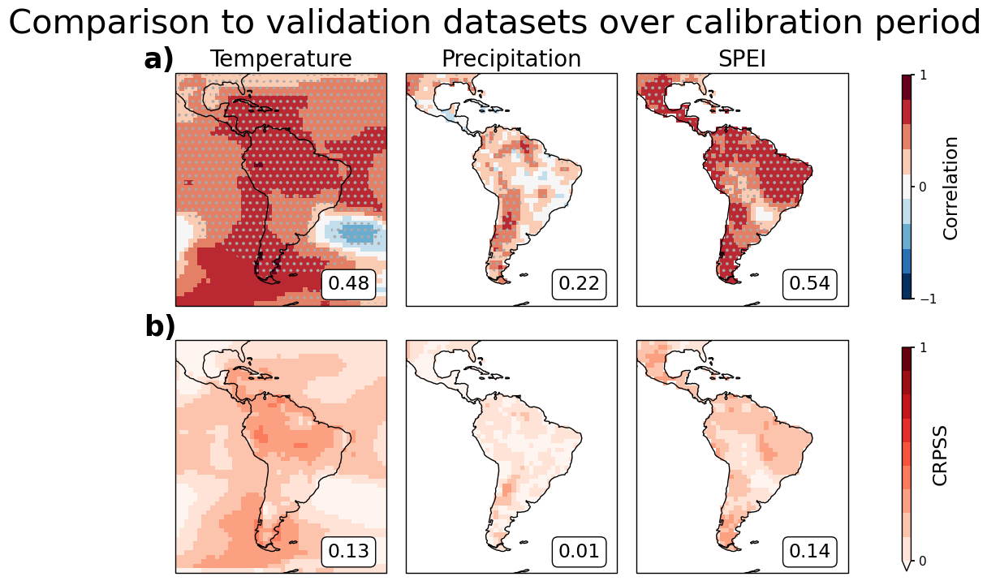

In [45]:
#new with historical data
fig0=plot_val_1(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
    ts=[['1920','2000'],['1950','2000'],['1950','2000']],
    title='Comparison to validation datasets over calibration period ',
)

fig0.savefig(savepath+'valid_app1.pdf', dpi='figure', format='pdf',bbox_inches='tight')

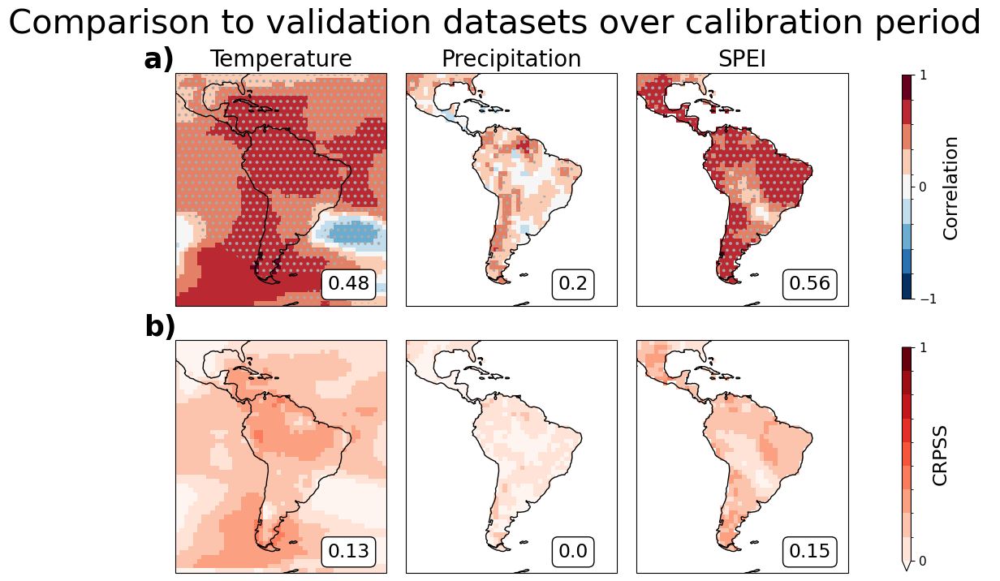

In [34]:
#new without historical data (should be same as below?)
fig0=plot_val_1(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/no_historical/',
    ts=[['1920','2000'],['1950','2000'],['1950','2000']],
    title='Comparison to validation datasets over calibration period ',
)

#fig0.savefig(savepath+'valid_app1.pdf', dpi='figure', format='pdf',bbox_inches='tight')

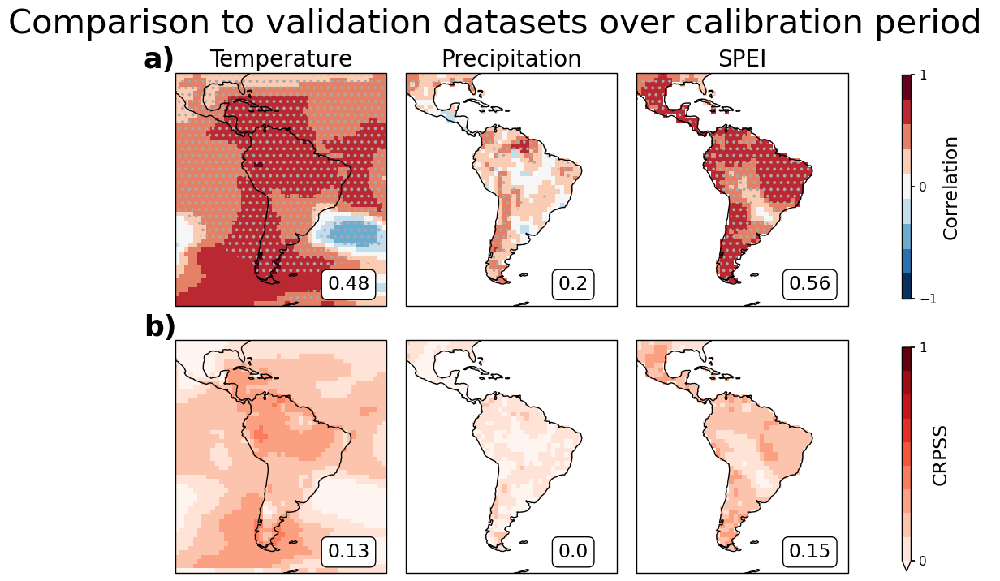

In [19]:
#old without historical records
fig0=plot_val_1(
    folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/all_proxies/',
    ts=[['1920','2000'],['1950','2000'],['1950','2000']],
    title='Comparison to validation datasets over calibration period ',
)

#fig0.savefig(savepath+'valid_app1.pdf', dpi='figure', format='pdf',bbox_inches='tight')

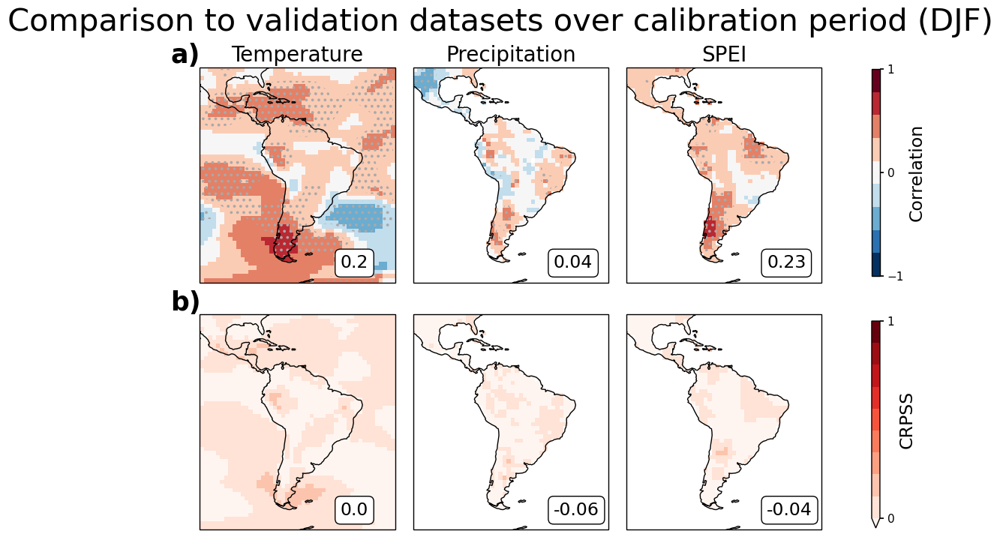

In [46]:
#Same for DJF
fig0_djf=plot_val_1(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/djf/proxy_frac/all_proxies/',
    ts=[['1920','2000'],['1950','2000'],['1950','2000']],
    title='Comparison to validation datasets over calibration period (DJF)',
)

fig0_djf.savefig(savepath+'valid_app1_djf.pdf', dpi='figure', format='pdf',bbox_inches='tight')


In [ ]:
"""
fig2=plot_val_1(
    folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/same_err/annual/proxy_frac/all_proxies/',
    ts=[['1920','2000'],['1950','2000'],['1950','2000']],
    title='Comparison to calibration data over calibration period ',
)
"""

## Additional validation part 2:  Monsoon Index validation tables.

- additionally requires GPCC precipitation dataset (regridded to reconstruction). Also tested the 20CR dataset (which is a reanalysis)


In [47]:
def monsoon_table(
#valid_ds={'CRU_prec':['1950','2000'],'GPCC_prec':['1950','2000'],'20CR_prec':['1950','2000']},
valid_ds={'CRU':['1950','2000'],'GPCC':['1950','2000']},
monsoon_region=[[-17.5,-5],[287.5,312.5]],
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/annual/proxy_frac/all_proxies/',
models='all',
valid_m=4,
filts=[None],
ts=[['1950','2000'],['1901','2000'],['1901','1950']], #time ranges
):
    prec={
'CRU':{'pre':'/home/mchoblet/validation_data/sa_project/upsampled/cru_prec.nc'}, #pre
'20CR':{'apcp':'/home/mchoblet/validation_data/sa_project/upsampled/20ce_prec.nc'}, #acpcp
'GPCC':{'precip':'/home/mchoblet/validation_data/sa_project/upsampled/gpcc_prec.nc'}, #precip
}
    """
    Computes validation metric for SASM precipitation index.
    Allows for low-pass filtering signals, which has interesting effects on the results (although in the end it is better to not use any smoothing)
    """
    array=np.zeros((len(filts)*2,len(ts)*len(valid_ds.keys())),dtype=object)

    #MY Reconstruction
    if models=='all': 
        files=listdir(comparison_folder)
        file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True)[['tsurf_mean','prec_mean','tsurf_std','prec_std']] for f in files]
        combined_dataset = xr.concat(file_l, dim='dataset')
        recon=combined_dataset.mean('dataset')
        #recon['time']=xr.cftime_range(start='0001',end='2000',freq='YS') #time gets messed up
    elif models=='lmr':
        recon=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc').rename({'prec':'prec_mean'}).mean('MCrun')*60*60*24*30
        #tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc').rename({'tsurf':'tsurf_mean'}).mean('MCrun')
        #recon=xr.merge([pr,tsurf])
        #recon=recon.sel(lat=slice(33.33300018,-63.80799866),lon=slice(251.25,339.375))
    else:
        recon=xr.open_dataset(comparison_folder+models,use_cftime=True)[['tsurf_mean','prec_mean']]
    recon=regionalmean(recon,monsoon_region[0],monsoon_region[1])
    recon_v=recon['prec_mean']


    for j,(n,t) in enumerate(valid_ds.items()):
        
        var=list(prec[n].keys())[0]
        ds=xr.open_dataset(prec[n][var])[var]
        if 'CRU' in n or 'GPCC' in n:
            ds['time']=xr.cftime_range(start='1901',freq='MS',periods=len(ds['time']))
        if '20CR' in n:
            ds=ds*12*30 # check that conversion formul

        ds=annual_mean(ds,valid_m)
        ds=regionalmean(ds,monsoon_region[0],monsoon_region[1])    

        for jj,t in enumerate(ts):
            recon_v2=recon_v.copy(deep=True)
            ds2=ds.copy(deep=True)
            ds2=ds2.sel(time=slice(t[0],t[1]))
            for i,filt in enumerate(filts):
                if filt is not None:
                    s_ax=recon_v2.get_axis_num('time')
                    recon_v2.data=quick_filt(recon_v2,cutoff=1/filt,s_ax=s_ax)
                    s_ax=ds2.get_axis_num('time')
                    ds2.data=quick_filt(ds2,cutoff=1/filt,s_ax=s_ax)
                recon_v2=recon_v2.sel(time=slice(t[0],t[1]))
                recon_v2=recon_v2-recon_v2.mean('time')
                ds2=ds2-ds2.mean('time')

                recon_v2['time']=ds2['time']
                data=xr.corr(ds2,recon_v2,dim='time')
                #pval_v_eff=xss.pearson_r_eff_p_value(ds,recon_v,dim='time') #effective p value results would get worse with smoothing due to autocorrelation
                pval_v=xss.pearson_r_p_value(ds2,recon_v2,dim='time')    
                array[i,j+len(valid_ds.keys())*jj]=str(np.round(data.values.item(),2))+' ('+str(np.round(pval_v.values.item(),3))+')'#+' ('+str(np.round(pval_v_eff.values.item(),3))+')'
                
                #add CRPSS skill score
                mu=recon_v2; sig=recon['prec_std'].sel(time=slice(t[0],t[1]))
                obs=ds2; mu_ref=obs.mean('time')
                
                if 'djf' in comparison_folder: sig_ref=regionalmean(dic0['[12, 1, 2]']['prec'],monsoon_region[0],monsoon_region[1])
                else: sig_ref=regionalmean(dic0['4']['prec'],monsoon_region[0],monsoon_region[1])
                
                rec=xss.crps_gaussian(obs,mu,sig,dim='time')
                ref=xss.crps_gaussian(obs,mu_ref,sig_ref,dim='time')
                skill=(1-rec/ref)
                array[i+1,j+len(valid_ds.keys())*jj]=str(np.round(skill.values.item(),2))
        
    columns=list(valid_ds.keys())
    multi_columns=pd.MultiIndex.from_tuples([((str(t[0])+'-'+str(t[1])),col) for t in ts for col in columns])
    index=['Corr','CRPSS']
    
    #df = pd.DataFrame(array, columns=columns, index=index)
    df = pd.DataFrame(array, columns=multi_columns, index=index)
    display(df)
    return df

In [48]:
#new after revision (with historical records)

print('Monsoon validation table for annual reconstructions')
df1=monsoon_table(
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
models='all',
valid_m=4,
filts=[None],
)


print('Monsoon validation table for annual reconstructions only relying on trees')
df1=monsoon_table(
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/trees_only/',
models='all',
valid_m=4,
filts=[None],
)


print('Monsoon validation table for annual reconstructions without trees')
df1=monsoon_table(
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/no_trees/',
models='all',
valid_m=4,
filts=[None],
)

#note that p value is expected to get up with filtering (as long as I don't take autocorrelation into account)

Monsoon validation table for annual reconstructions


1950-2000                 1901-2000                   1901-1950  \
                CRU         GPCC          CRU          GPCC           CRU   
Corr   0.18 (0.201)  0.07 (0.62)  0.1 (0.313)  0.03 (0.739)  0.04 (0.799)   
CRPSS         -0.01        -0.02        -0.03         -0.03         -0.04   

                     
               GPCC  
Corr   0.01 (0.966)  
CRPSS         -0.03

Monsoon validation table for annual reconstructions only relying on trees


1950-2000                  1901-2000                     1901-1950  \
                 CRU           GPCC         CRU           GPCC            CRU   
Corr   -0.06 (0.656)  -0.14 (0.327)  -0.1 (0.3)  -0.08 (0.424)  -0.13 (0.351)   
CRPSS          -0.07          -0.06       -0.09          -0.05           -0.1   

                      
                GPCC  
Corr   -0.02 (0.904)  
CRPSS          -0.03

Monsoon validation table for annual reconstructions without trees


1950-2000                  1901-2000                   1901-1950  \
               CRU          GPCC          CRU          GPCC           CRU   
Corr   0.2 (0.152)  0.11 (0.431)  0.18 (0.07)  0.08 (0.403)  0.14 (0.321)   
CRPSS        -0.04         -0.03        -0.05         -0.03         -0.08   

                     
               GPCC  
Corr   0.05 (0.734)  
CRPSS         -0.03

In [18]:
"""
print('Monsoon Table for my DJF reconstruction')
df1=monsoon_table(
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final/normal_err/djf/proxy_frac/all_proxies/',
models='all',
valid_m=4,
filts=[None],
)

#note that p value is expected to get up with filtering (as long as 
"""

Monsoon Table for my DJF reconstructions with proxy frac=0.8


1950-2000                   1901-2000                  1901-1950  \
                CRU           GPCC          CRU         GPCC           CRU   
Corr   0.11 (0.428)  -0.06 (0.694)  0.05 (0.59)  0.0 (0.996)  0.06 (0.694)   
CRPSS         -0.13          -0.14        -0.15        -0.13         -0.13   

                     
               GPCC  
Corr   0.08 (0.586)  
CRPSS         -0.09

### Plotting monsoon precipitation

In [51]:
def monsoon_precipitation():
    """
    Computing monsoon precipitation in core monsoon region.
    
    """
    ts=['1901','2000']
    monsoon_region=[[-17.5,-5],[287.5,312.5]]

    fig=plt.figure(figsize=(8,5))
    ax=plt.gca()


    #avg=[12,1,2]
    avg=4

    for k,p in {
    'CRU':'/home/mchoblet/validation_data/sa_project/upsampled/cru_prec.nc',
    'GPCC':'/home/mchoblet/validation_data/sa_project/upsampled/gpcc_prec.nc',
    }.items():
        data=xr.open_dataset(p).to_array().squeeze('variable')
        data=annual_mean(data,avg=avg)
        data=regionalmean(data,monsoon_region[0],monsoon_region[1]).sel(time=slice(ts[0],ts[1]))
        data=data-data.mean('time')
        data['time']=xr.cftime_range(start='1901',end='2000',freq='YS', calendar='gregorian')
        data.plot(label=k,ax=ax)
    #"""
    comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/'
    #comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final/normal_err/annual/proxy_frac/no_trees/'
    files=listdir(comparison_folder)
    file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True)[['tsurf_mean','prec_mean','tsurf_std','prec_std']] for f in files]
    combined_dataset = xr.concat(file_l, dim='dataset')
    recon=combined_dataset.mean('dataset')
    my_data=regionalmean(recon['prec_mean'].sel(time=slice(ts[0],ts[1])),monsoon_region[0],monsoon_region[1])
    my_data=my_data-my_data.mean('time')
    my_data['time']=xr.cftime_range(start='1901',end='2000',freq='YS', calendar='gregorian')
    my_data.plot(label='Recon. (all)',ax=ax,c='magenta')

    #### NO TREES
    comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/no_trees/'
    files=listdir(comparison_folder)
    file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True)[['tsurf_mean','prec_mean','tsurf_std','prec_std']] for f in files]
    combined_dataset = xr.concat(file_l, dim='dataset')
    recon=combined_dataset.mean('dataset')
    my_data=regionalmean(recon['prec_mean'].sel(time=slice(ts[0],ts[1])),monsoon_region[0],monsoon_region[1])
    my_data=my_data-my_data.mean('time')
    my_data['time']=xr.cftime_range(start='1901',end='2000',freq='YS', calendar='gregorian')
    my_data.plot(label='Recon. (no trees)',ax=ax,ls='--',c='brown')

    #### ONLY TREES
    comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/trees_only/'
    files=listdir(comparison_folder)
    file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True)[['tsurf_mean','prec_mean','tsurf_std','prec_std']] for f in files]
    combined_dataset = xr.concat(file_l, dim='dataset')
    recon=combined_dataset.mean('dataset')
    my_data=regionalmean(recon['prec_mean'].sel(time=slice(ts[0],ts[1])),monsoon_region[0],monsoon_region[1])
    my_data=my_data-my_data.mean('time')
    my_data['time']=xr.cftime_range(start='1901',end='2000',freq='YS', calendar='gregorian')
    my_data.plot(label='Recon. (only trees)',ax=ax,ls=':',c='forestgreen')


    """
    comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final/same_err/annual/proxy_all/all_proxies/'
    files=listdir(comparison_folder)
    file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True)[['tsurf_mean','prec_mean','tsurf_std','prec_std']] for f in files]
    combined_dataset = xr.concat(file_l, dim='dataset')
    recon=combined_dataset.mean('dataset')
    my_data=regionalmean(recon['prec_mean'].sel(time=slice(ts[0],ts[1])),monsoon_region[0],monsoon_region[1])
    my_data=my_data-my_data.mean('time')
    my_data['time']=xr.cftime_range(start='1901',end='2000',freq='YS', calendar='gregorian')
    my_data.plot(label='Reconstruction')
    """
    labelsize=13
    ax.set_title('Annual Precipitation anomaly in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)', fontsize=18)
    ax.set_ylabel(r'$\Delta$ Precipitation [mm/month]',fontsize=labelsize)
    ax.set_xlabel('Year CE',fontsize=labelsize)
    #ax.set_xticks(['1910-01-01','1940-01-01','1970-01-01','2000-01-01'])
    ax.tick_params(axis='both',labelsize=labelsize)
    ax.grid(True)
    ax.legend(fontsize=labelsize,loc='lower right',ncols=2,frameon=True)
    ax.xaxis.get_major_locator()._max_n_locator.set_params(nbins=5)

    return fig

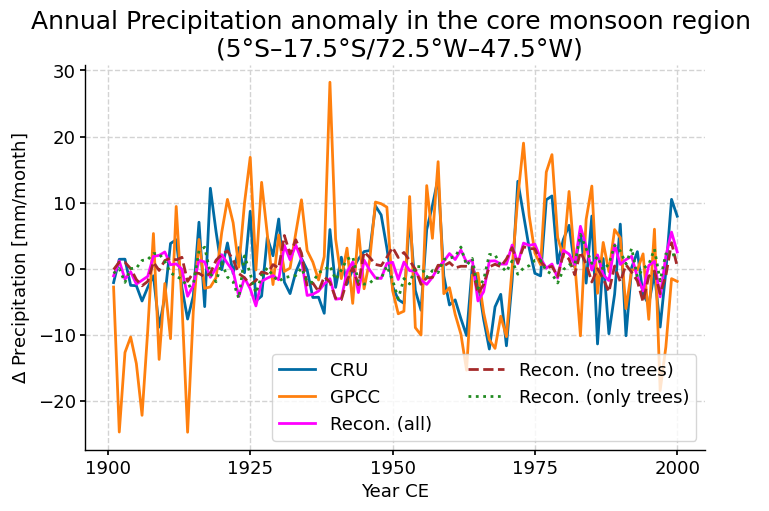

In [52]:
fig=monsoon_precipitation()
fig.savefig(savepath+'valid_monsoon.pdf', dpi='figure', format='pdf',bbox_inches='tight')

## Additional Validation part 3: SADA PHYDA Comparison in SPEI/PDSI for the Southern Cone

In [55]:
def plot_3(
var='spei_mean',
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final/normal_err/annual/proxy_frac/all_proxies/',
models='all',
title=None,
):
    """
    
    
    """
    valid_ds={'SADA':[]}
    filts=[None,5,10]
    title=' '
    titlesize=30
    labelsize=15
    figsize=None
    cmap='RdBu_r'
    ts=[['1400','1900'],['1901','2000']]
    nrows=len(ts)
    ncols=3
    if figsize==None:
        figsize=(ncols*2.2,nrows*3)

    fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=figsize,subplot_kw={'projection': ccrs.PlateCarree()}) #one row for precip, one for temp, one for spei, one for slp

    #var='spei_mean'

    #MY Reconstruction
    if models=='all': 
        files=listdir(comparison_folder)
        file_l=[xr.open_dataset(comparison_folder+f,use_cftime=True)[var] for f in files]
        combined_dataset = xr.concat(file_l, dim='dataset')
        recon=combined_dataset.mean('dataset')
        recon=recon.sel(lat=sada.lat,lon=sada.lon)
        #recon['time']=xr.cftime_range(start='0001',end='2000',freq='YS') #time gets messed up
    else:
        recon=xr.open_dataset(comparison_folder+models,use_cftime=True)[var] 
    phyda=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc',use_cftime=True)
    phyda=phyda.sel(lat=sada.lat,lon=sada.lon)
    comp_data={'SADA (scPdSI)':sada,'PHYDA (SPEI)':phyda['spei_mn'],'SADA-PHYDA':None}
    for i,(ii,data) in enumerate(comp_data.items()):
        for j,t in enumerate(ts):
            try:
                data1=data.sel(time=slice(t[0],t[1]))
                data2=recon.sel(time=slice(t[0],t[1]))
            except:
                data1=sada.sel(time=slice(t[0],t[1]))
                data2=phyda['pdsi_mn'].sel(time=slice(t[0],t[1]))
            data2['time']=data1['time']
            
            corrs=[]
            glob=[]
            pval=[]
            
            #no time shift!
            for t in [0]:
                corr=xr.corr(data1.shift(time=t),data2,dim='time')
                corrs.append(corr); glob.append(utils_new.globalmean(corr))
                pval.append(xss.pearson_r_eff_p_value(data1.shift(time=t),data2,dim='time'))

            max_i=np.argmax(glob)
            #print(ii,ts[j],'shift:',[-1,0,1][max_i])
            corr=corrs[max_i]
            pval=pval[max_i]
            ax=axs[j,i]
            #plot=corr.plot.contourf(ax=ax,cmap=cmap,vmax=1,vmin=-1,add_colorbar=False,levels=10)
            plot=corr.plot(ax=ax,cmap=cmap,vmax=1,vmin=-1,add_colorbar=False,levels=10)

            #mean over all griddboxes
            mean=utils_new.globalmean(corr)
            #ax.set_extent(map_extent, crs=ccrs.PlateCarree())
            ax.coastlines()

            #plot=data.plot.contourf(ax=ax,norm=norm,cmap=cmap,add_colorbar=False,levels=30)
            pval.plot.contourf(levels=[0,0.05],colors='none',hatches=[None,'..'],add_colorbar=False, extend='both',ax=ax)
            props = dict(boxstyle='round', facecolor='white', alpha=1)
            ax.text(0.7,0.1,np.round(mean.values.item(),2), transform=ax.transAxes, fontsize=11, verticalalignment='top', bbox=props)   
            ax.set_title('')

    #add colorbar at the end
    p0=ax.get_position().get_points().flatten()
    ax_cbar1 = fig.add_axes([p0[2]+0.05, p0[1]*2.8, 0.01, (p0[3]-p0[1])])
    cb=fig.colorbar(plot, cax=ax_cbar1, orientation='vertical',cmap=cmap)
    cb.ax.tick_params(labelsize=labelsize)
    cb.set_label('Correlation',fontsize=labelsize)
    #cb.ax.locator_params(nbins=3)
    cb.set_ticks([-1, 0, 1])

    #add titles 
    for i,ii in enumerate(comp_data.keys()):
        try:
            axs[0,i].set_title(ii,fontsize=labelsize,y=1.06)
        except:
            axs[i].set_title(ii,fontsize=labelsize,y=1.06)

    #add ylabels
    for i,t in enumerate(ts):
        axs[i,0].text(-0.07, 0.53,(t[0]+' - '+t[1])+' CE',fontsize=labelsize, va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=axs[i,0].transAxes)
    axs[0,0].text(-0.3, 1, 'a)', transform=axs[0,0].transAxes, size=16,weight='bold')
    axs[1,0].text(-0.3, 1, 'b)', transform=axs[1,0].transAxes, size=16,weight='bold')
    
    plt.subplots_adjust(wspace=-0.1,hspace=0.08)
    if title is not None:
        print(title)
        fig.suptitle(title,fontsize=35,y=1.02)
    #fig.suptitle('All proxy reconstruction',fontsize=32,y=1.04)
    
    return fig

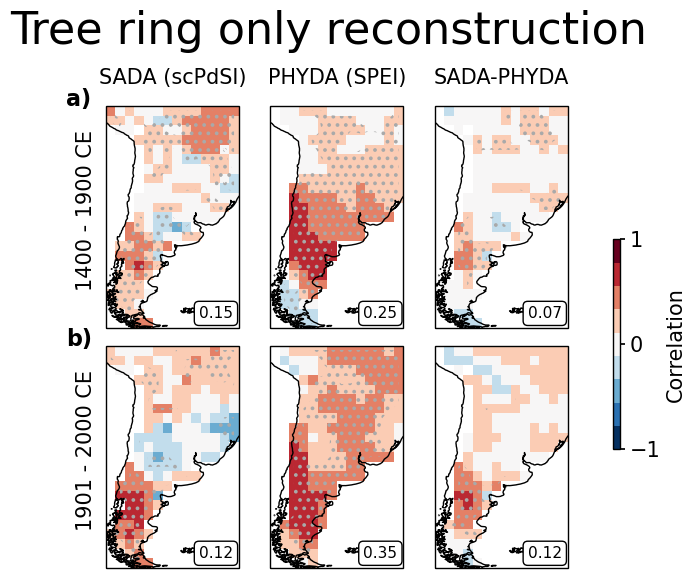

In [59]:
fig_sada=plot_3(
var='spei_mean',
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/trees_only/',
models='all',title='Tree rings only reconstruction',
)

#fig_sada.savefig(savepath+'valid_sada.pdf', dpi='figure', format='pdf',bbox_inches='tight')

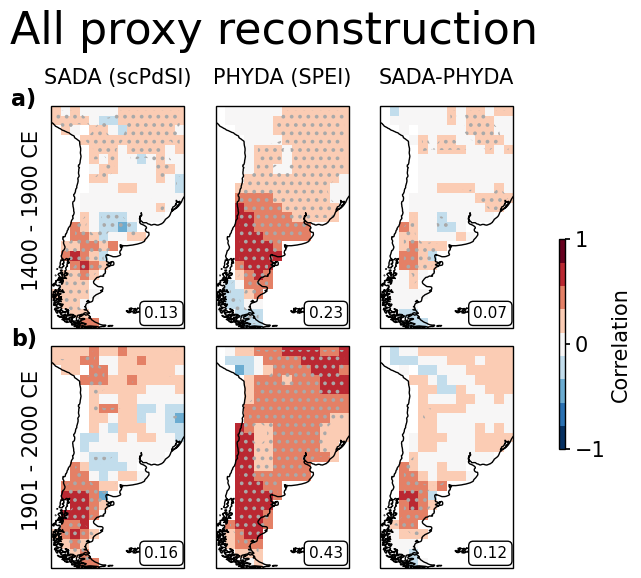

In [22]:
#new with historical
fig_sada=plot_3(
var='spei_mean',
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
models='all',
)


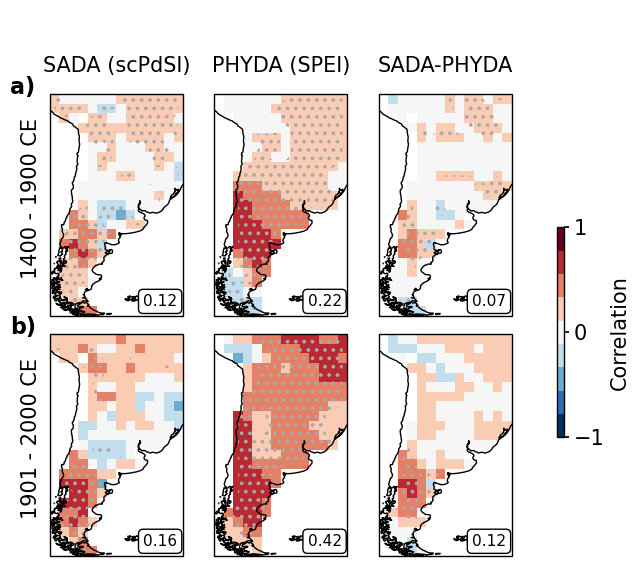

In [56]:
#new with historical
fig_sada=plot_3(
var='spei_mean',
comparison_folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
models='all',
)

fig_sada.savefig(savepath+'valid_sada.pdf', dpi='figure', format='pdf',bbox_inches='tight')

# Figure 3: Anomaly fields for distinctive climate periods


- Can be applied to both our reconstruction(s) and PHYDA and LMR (although not for all variables we reconstructed)
- Non significant changes compared to last millennium mean are indicated with hatching (Computed with ttest, alpha >0.001)


In [57]:
import string

In [58]:
def plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/all_proxies/',
           maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5,'pdsi_mean':5}, #colorbar maximum values (important for comparability between plots)
            mode='recon',#alternative pyhda, lmr 
            title=None,
            pvals=True,
            alpha=0.001, 
           titles={'Pre MCA \n 700-925CE':['0700','0925'], 'Early MCA \n 925-1150CE':['0925','1150'], 'Late MCA \n 1150-1350CE':['1150','1350'] ,'Trans \n 1350-1500CE':['1350','1500'] ,'LIA \n 1500-1850CE':['1500','1850'], 'CWP \n 1900-2000CE':['1900','2000']}
           ):
    """
    Mean anomaly fields for specific periods.
    - dictionary in 'titles' contains period definitions
    - mode can be set to 'phyda' and 'lmr' when doing the same figure for these reconstructions (note that) the varibles will be different
    """
    from os import listdir
    if mode.lower()=='phyda':
        path='/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc'
        recon=xr.open_dataset(path)
        recon['time']=xr.cftime_range(start='0001',end='2000',freq='YS')
        recon=regioncut(recon,[-65,35],[250,340])
        recon=recon-recon.sel(time=slice('0850','1850')).mean('time') #demean!
        recon['spei_mn']=(recon['spei_mn']-recon['spei_mn'].sel(time=slice('0850','1850')).mean('time'))/recon['spei_mn'].sel(time=slice('0850','1850')).std('time')
        try:
            recon=recon.rename({'spei_mn':'spei_mean','tsurf':'tsurf_mean','pdsi_mn':'pdsi_mean'})
        except:
            pass
        variables=['spei_mean','tsurf_mean']
        title='PHYDA reconstruction'
        
    elif mode.lower()=='lmr':
        ##lmr
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30 #unit conversion for lmr precipitation /s to per month
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std])
        
        variables=['prec_mean','tsurf_mean']
        recon=lmr
        recon=regioncut(recon,[-65,35],[250,340])
        title='LMRv2.1 reconstruction'
        
    else:
        variables=['tsurf_mean','prec_mean','spei_mean','d18O_mean']
        files=listdir(folder)
        file_l=[xr.open_dataset(folder+f,use_cftime=True)[variables] for f in files]
        combined_dataset = xr.concat(file_l, dim='dataset')
        recon=combined_dataset.mean('dataset')
        recon=recon-recon.sel(time=slice('0850','1850')).mean('time') #demean!
        recon['spei_mean']=(recon['spei_mean']-recon['spei_mean'].sel(time=slice('0850','1850')).mean('time'))/recon['spei_mean'].sel(time=slice('0850','1850')).std('time')
        
    figsize=(14.5,len(variables)*3)
    map_extent=[255,330,-60,28]

    #fig,axs=plt.subplots(nrows=4,ncols=4,figsize=figsize,subplot_kw={'projection': ccrs.PlateCarree()}) #one row for precip, one for temp, one for spei, one for slp
    fig,axs=plt.subplots(nrows=len(variables),ncols=6,figsize=figsize,subplot_kw={'projection': ccrs.PlateCarree()}) #one row for precip, one for temp, one for spei, one for slp
    
    var={'prec_mean':'Precipitation','spei_mean':'SPEI','tsurf_mean':'Temperature', 'd18O_mean':'$\delta^{18}$O','slp_mean':'Sea Level Pressure','pdsi_mean':'PDSI'}
    #variables=['tsurf_mean','prec_mean','spei_mean','d18O_mean'] #eventually replace d18O by slp + spei
    cmaps={'tsurf_mean':'RdBu_r','prec_mean':'BrBG','spei_mean':'PuOr','d18O_mean':'PiYG_r','pdsi_mean':'PuOr'}
    units={'tsurf_mean':'$\Delta$ [K]','prec_mean':'$\Delta$ [mm/month]','spei_mean':'$\Delta$ [1]','d18O_mean':'$\Delta$ [‰]','pdsi_mean':'$\Delta$ [1]'}
    #units= ['$\Delta$ [K]',' $\Delta$ [mm/month]','$\Delta$ [1]', '$\Delta$ [‰]', 'hPa']

    lm=['0850','1850']

    titlesize=18
    labelsize=18
    if title!=None:
        fig.suptitle(title,fontsize=titlesize+2,y=1.05)
    

    for i,n in enumerate(variables):
        data=recon[n]
        clim=data.sel(time=slice(lm[0],lm[1])).mean('time')
        vmax=maxs[n]
        vmin=-vmax
        
        #print(vmax)
        if 'spei' in n:
            data['lon']=(data.lon+180)%360-180
            data=data.sortby('lon')

            lat=data['lat']
            lon=data['lon']
            lat_grid,lon_grid=np.meshgrid(lat,lon)
            on_land=globe.is_land(lat_grid, lon_grid).T

            clim['lon']=(clim.lon+180)%360-180
            clim=clim.sortby('lon')

        for ii,t in enumerate(titles):
            start,end=titles[t]
            data_sel=data.sel(time=slice(start,end)).mean('time')-clim     
            if 'spei' in n:
            #    print(data_sel.shape)
                coords=xr.where(on_land,data_sel,np.nan) 
                data_sel=coords

            a=axs[i,ii]     
            a.set_extent(map_extent, crs=ccrs.PlateCarree())
            a.coastlines()
            #apply land sea mask  

            plot=data_sel.plot.contourf(ax=a,vmax=vmax,vmin=vmin,cmap=cmaps[n],add_colorbar=False,levels=11,alpha=1)
            
            if pvals:
                #https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html
                #Calculate the T-test for the means of two independent samples of scores.
                #We thus compare the distributions of values. It is important that the demeaning of the values is done wrt the same time period (last millennium)!
                data_sel.data=stats.ttest_ind(data.sel(time=slice(start,end))-clim,data.sel(time=slice(lm[0],lm[1]))-clim,axis=0,equal_var=False).pvalue
                if 'spei' in n:
                    coords=xr.where(on_land,data_sel,np.nan) 
                    data_sel=coords
                #data_sel.plot.contourf(levels=[0,alpha],colors='none',hatches=[None,'...'],add_colorbar=False, extend='both',ax=a)
                data_sel.plot.contourf(levels=[0,alpha],colors='none',hatches=['...',None,],add_colorbar=False, extend='both',ax=a)
            
            a.set_title('')
        #add the colorbar to the right    
        p0=a.get_position().get_points().flatten()
        ax_cbar1 = fig.add_axes([p0[2]+0.03, p0[1], 0.01, p0[3]-p0[1]])

        cb=fig.colorbar(plot, cax=ax_cbar1, orientation='vertical',cmap=cmaps[n])
        cb.ax.tick_params(labelsize=labelsize-3)

        if 'temp' in n.lower() or 'tsurf' in n.lower() or 'd18' in n.lower():
            labelpad=-10
        else: labelpad=2
        
        cb.set_label(units[n],fontsize=labelsize,labelpad=labelpad)
        #cb.ax.locator_params(nbins=3)
        cb.set_ticks([vmin*4/5,0,vmax*4/5])
        axs[i,0].text(-0.07, 0.53,var[n],fontsize=labelsize, va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=axs[i,0].transAxes)

    for i,(ii,t) in enumerate(titles.items()):
        axs[0,i].set_title(ii,fontsize=titlesize,y=1.07)
        #axs[i,0].set_ylabel(list(var.values())[i],fontsize=labelsize)    
    
    letters=list(string.ascii_lowercase)[:24]
    for i,t in enumerate(letters):
        try:
            #old with only a,b,c,d
            #axs[i,t//6].text(-0.15, 1.04, t, transform=axs[i,0].transAxes, size=18,weight='bold')
            #new with all letters
            t=t+')'
            axs[i//6,i%6].text(0.05, 0.04, t, transform=axs[i//6,i%6].transAxes, size=18)#,weight='bold')
        except:
            pass
    plt.subplots_adjust(wspace=0,hspace=0.2)
    
    #fig.savefig('/home/mchoblet/paper_plots/fig1_mca_lia_draft.pdf', dpi='figure', format='pdf', metadata=None,bbox_inches='tight', pad_inches=0.1,facecolor='auto', edgecolor='auto',backend=None)
    return fig

"\n#proxy error = half prior variance\nfig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/half_err/annual/proxy_frac/all_proxies/',\n                       maxs={'tsurf_mean':0.4,'prec_mean':5,'spei_mean':2,'d18O_mean':0.5},alpha=0.01\n                       )\n"

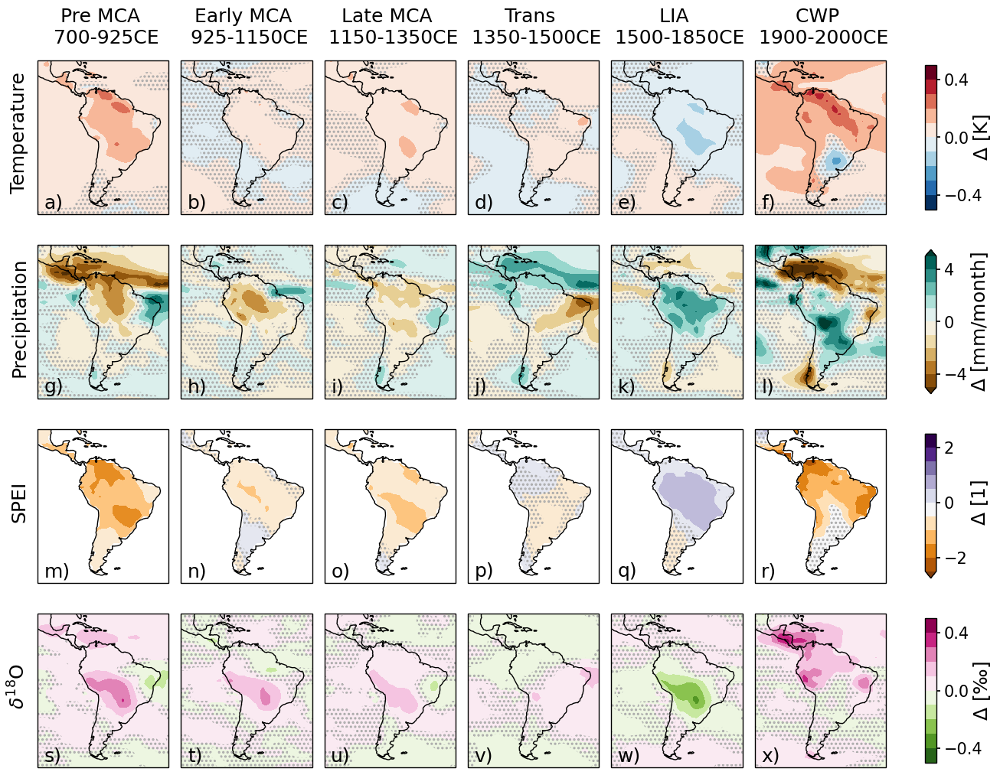

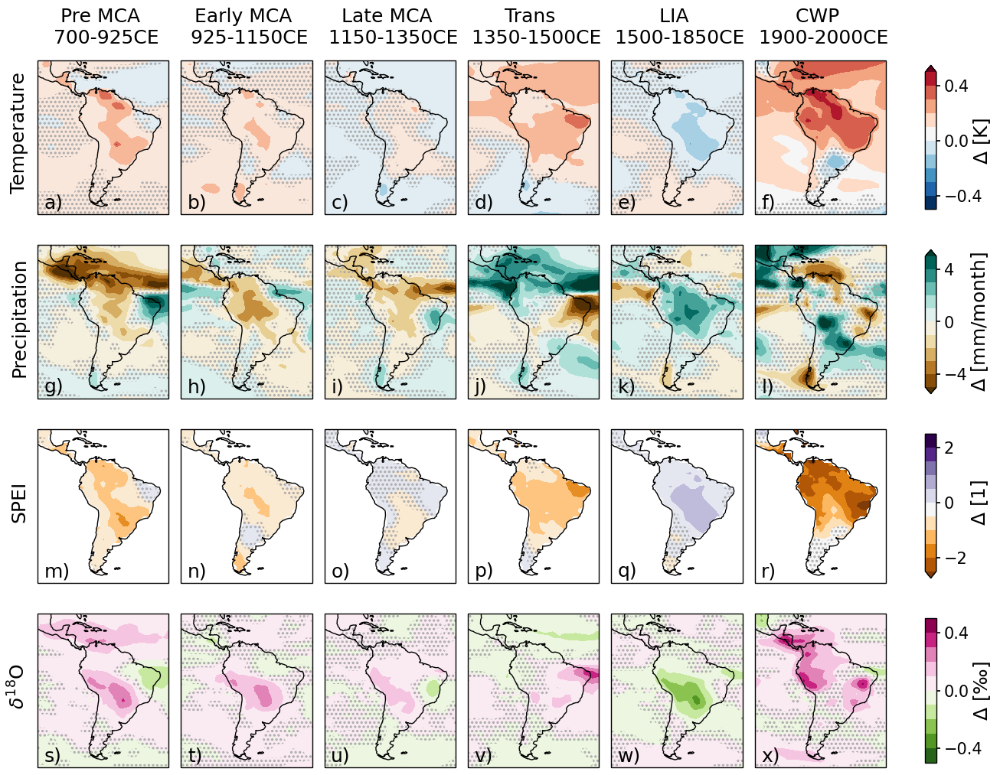

In [59]:
#NEW after revision

#normal error definition (DISPLAYED IN MAIN TEXT OF PAPER)
fig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )

fig.savefig(savepath+'fig3_ann.pdf', dpi='figure', format='pdf',bbox_inches='tight')


#proxy error equal to prior variance
fig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/revision/same_err/annual/all_proxies/',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )
fig.savefig(savepath+'fig3_ann_app.pdf', dpi='figure', format='pdf',bbox_inches='tight')
"""
#proxy error = half prior variance
fig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/half_err/annual/proxy_frac/all_proxies/',
                       maxs={'tsurf_mean':0.4,'prec_mean':5,'spei_mean':2,'d18O_mean':0.5},alpha=0.01
                       )
"""

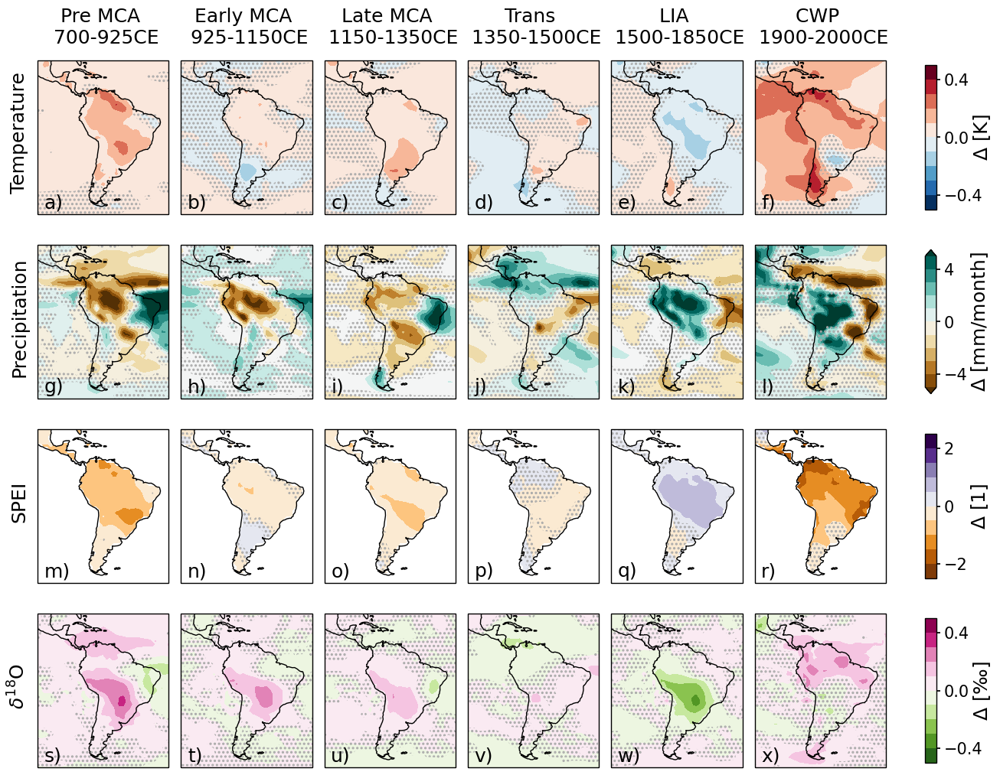

In [60]:
#Plot for austral summer (DJF) reconstruction -> just change path
fig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/djf/proxy_frac/all_proxies/',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )
fig.savefig(savepath+'fig3_djf_app.pdf', dpi='figure', format='pdf',bbox_inches='tight')

Figure only using speleothems


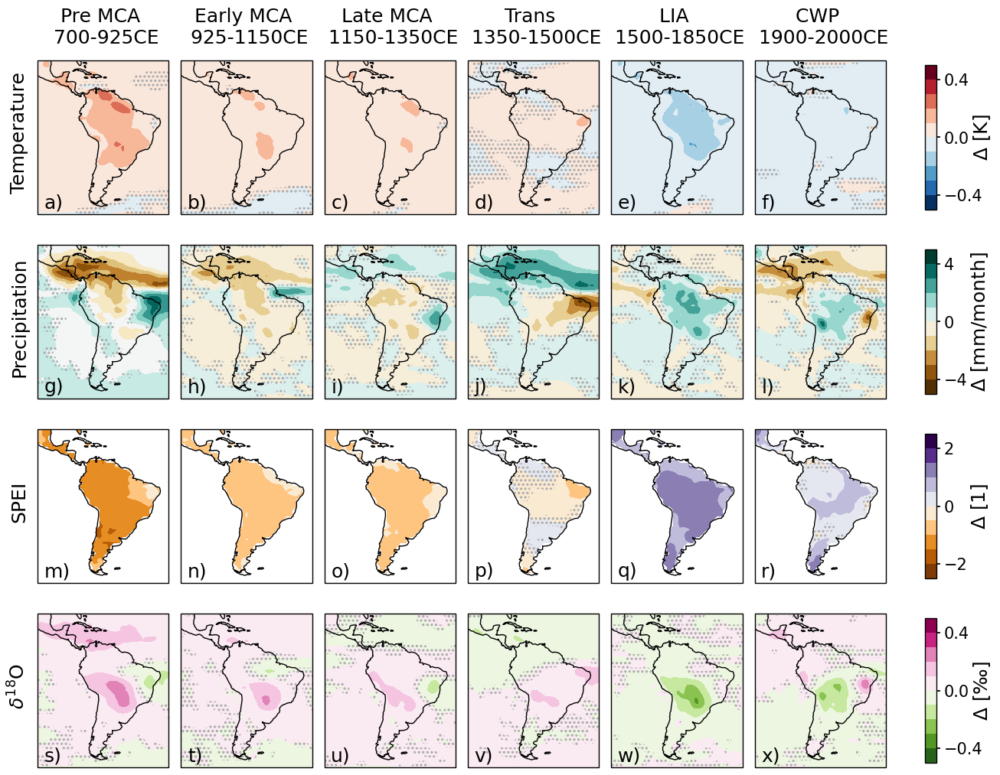

Figure when excluding speleos


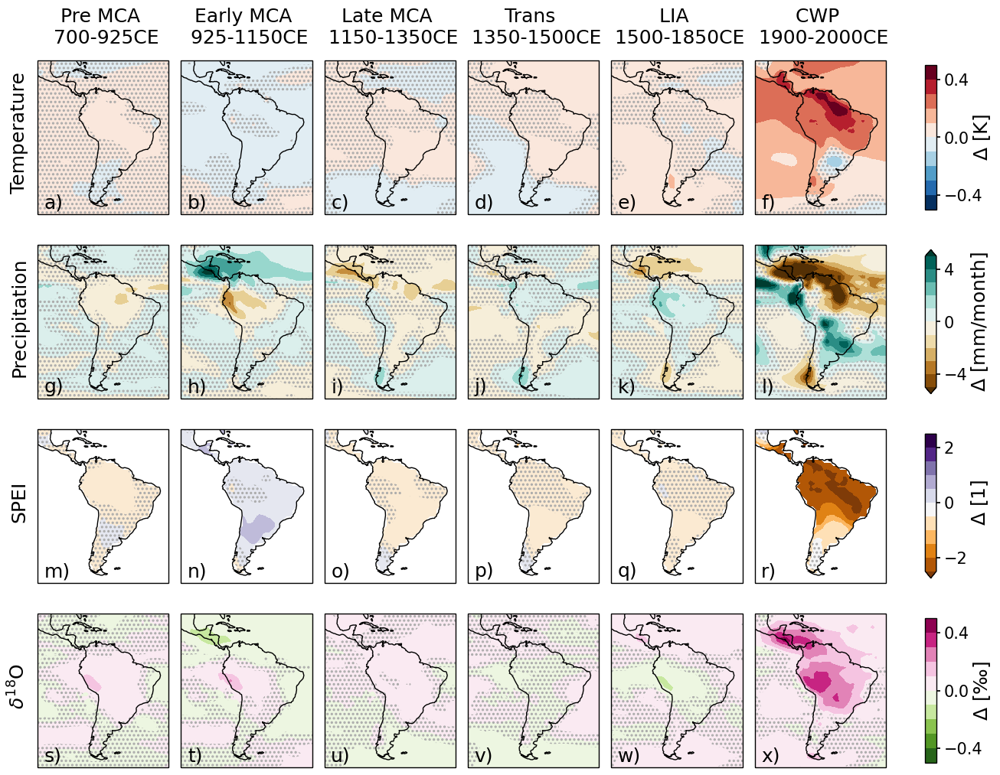

In [61]:
#normal error definition (only speleos)
print('Figure only using speleothems')
fig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/speleos_only/',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )
fig.savefig(savepath+'fig3_speleos.pdf', dpi='figure', format='pdf',bbox_inches='tight')
plt.show()
#no speleos
print('Figure when excluding speleos')
fig=plot_3(folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/no_speleos/',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )
fig.savefig(savepath+'fig3_no_speleos.pdf', dpi='figure', format='pdf',bbox_inches='tight')

Plot for LMR


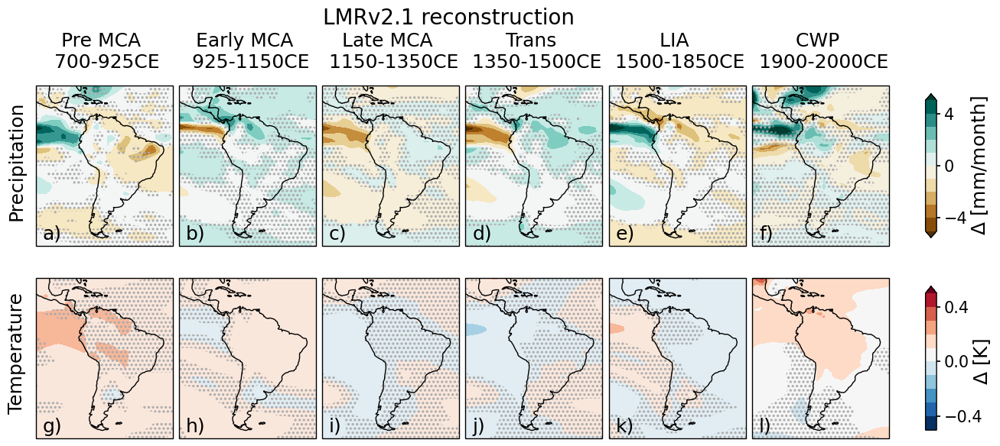

Plot for PHYDA


/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/xarray/coding/times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/xarray/core/indexing.py:556: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()


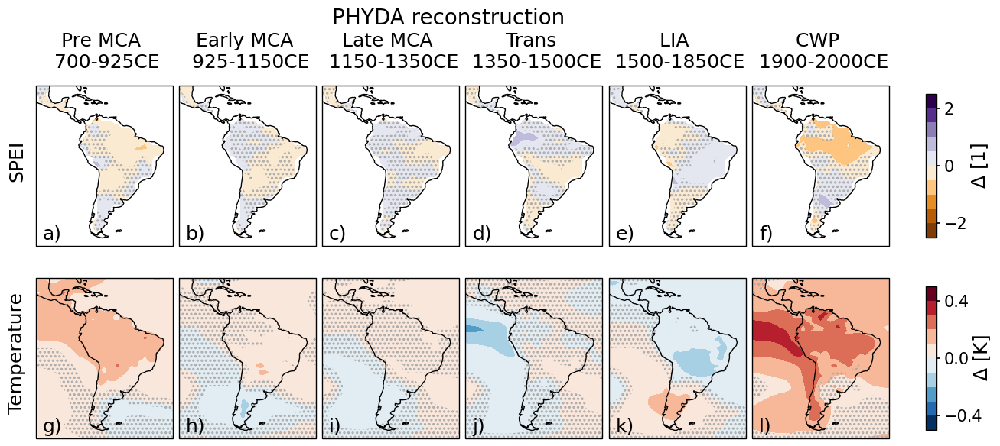

In [62]:
# Same Plot for LMR reconstruction
print('Plot for LMR')
fig=plot_3(mode='lmr',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )

fig.savefig(savepath+'fig3_lmr.pdf', dpi='figure', format='pdf',bbox_inches='tight')

plt.show()
# Same Plot for PHYDA reconstruction
print('Plot for PHYDA')
fig=plot_3(mode='phyda',
                       maxs={'tsurf_mean':0.5,'prec_mean':5,'spei_mean':2.5,'d18O_mean':0.5},alpha=0.01
                       )
fig.savefig(savepath+'fig3_phyda.pdf', dpi='figure', format='pdf',bbox_inches='tight')

# Plot 3 Appendix: Century wise plot for all variables (4 Panels, each variable)

- Can also be used for alternative reconstructions

In [63]:
def plot3_cent(
    #folder='/home/mchoblet/paleoda/results/experiments/paper/final_new/normal_err/annual/proxy_frac/all_proxies/',
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
    var='prec_mean',
    figsize=(12,12),
    nrows=4,
    ncols=5,
    pvals=True,
    alpha=0.01,
    mode='all',
    plotbox=False,
):
    map_extent=[255,330,-60,28]
    #['tsurf_mean','prec_mean','spei_mean','d18O_mean']


    colorbarsize=25
    titlesize=30
    ax_titlesize=16

    if 'prec' in var:
        label='$\Delta$ prec [mm/month]'
        title='Centennial precipitation anomalies \n wrt 850-1850 CE'
        vmax=5
        steps=[-4,-2,0,2,4]
        levels=21
        cmap='BrBG'
    elif 'tsurf' in var:
        label='$\Delta$ temperature [K]'
        title='Centennial temperature anomalies \n wrt 850-1850 CE'
        vmax=0.5
        steps=[-0.4,-0.2,0,0.2,0.4]
        levels=21
        cmap='RdBu_r'
    elif 'spei' in var:
        label='$\Delta$ SPEI [1]'
        title='Centennial SPEI anomalies \n wrt 850-1850 CE'
        vmax=2.5
        steps=[-2,-1,0,1,2]
        levels=21
        cmap='PuOr'
    elif 'd18' in var:
        label='$\Delta$ $\delta^{18}$O [‰]'
        title='Centennial $\delta^{18}$O anomalies \n wrt 850-1850 CE'
        vmax=0.5
        steps=[-0.4,-0.2,0,0.2,0.4]
        levels=21
        cmap='PiYG_r'
        
    if 'lmr' in mode.lower():
        title=title+' (LMRv2.1)'
    
    elif 'phyda' in mode.lower():
        title=title+' (PHYDA)'
        
        
    vmin=-vmax

    fig, axes = plt.subplots(ncols=ncols,nrows=nrows,figsize=figsize,subplot_kw={'projection':ccrs.PlateCarree()})
    fig.suptitle(title,fontsize=titlesize)

    #create dataset, subtract climatology
    if mode.lower()=='phyda':
        path='/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc'
        recon=xr.open_dataset(path)
        recon['time']=xr.cftime_range(start='0001',end='2000',freq='YS')
        recon=regioncut(recon,[-65,30],[250,340])
        recon=recon-recon.sel(time=slice('0850','1850')).mean('time') #demean!
        recon['spei_mn']=(recon['spei_mn']-recon['spei_mn'].sel(time=slice('0850','1850')).mean('time'))/recon['spei_mn'].sel(time=slice('0850','1850')).std('time')
        try: 
            recon=recon.rename({'spei_mn':'spei_mean','tsurf':'tsurf_mean','pdsi_mn':'pdsi_mean'})
        except:
            pass
        
        variables=['spei_mean','pdsi_mean','tsurf_mean']
        recon=recon[var]
        #title='PHYDA reconstruction'

    elif mode.lower()=='lmr':
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30 #unit conversion for lmr precipitation /s to per month
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std]) 
        
        variables=['prec_mean','tsurf_mean']
        recon=lmr[var]
        recon=regioncut(recon,[-65,30],[250,340])
        #title='LMRv2.1 reconstruction'

    else:
        files=listdir(folder)
        file_l=[xr.open_dataset(folder+f,use_cftime=True)[var] for f in files]
        combined_dataset = xr.concat(file_l, dim='dataset')
        recon=combined_dataset.mean('dataset')
    
    lm=['0850','1850']
    clim=recon.sel(time=slice(lm[0],lm[1]))
    clim_m=clim.mean('time')
    clim=clim-clim_m #common baseline important
    recon=recon-clim_m #demean!
        
    #standardize spei std
    if var=='spei_mean':
        recon=(recon-recon.sel(time=slice('0850','1850')).mean('time'))/recon.sel(time=slice('0850','1850')).std('time')
        recon['lon']=(recon.lon+180)%360-180
        recon=recon.sortby('lon')
        lat=recon['lat']; lon=recon['lon']
        lat_grid,lon_grid=np.meshgrid(lat,lon)
        on_land=globe.is_land(lat_grid, lon_grid).T
        recon['lon']=(recon.lon+180)%360-180
        recon=recon.sortby('lon')
        recon=xr.where(on_land,recon,np.nan) 

    for i in range(20):
        ax=axes.flatten()[i]
        ax.set_extent(map_extent, crs=ccrs.PlateCarree())
        ax.coastlines()
        #compute centennial mean
        if i==0:
            cent=recon.isel(time=slice(i*100,((i+1)*100)))
            string=str(i*100+1)+'-'+str((i+1)*100)+' CE'
        else:
            cent=recon.isel(time=slice(i*100-1,((i+1)*100)))
            string=str(i*100)+'-'+str((i+1)*100)+' CE'
        cent_mean=cent.mean('time')
        #plot with vmin, vmax, save colorbar
        plot=cent_mean.plot.contourf(ax=ax,vmax=vmax,vmin=vmin,cmap=cmap,add_colorbar=False,levels=levels,alpha=1)    
        if pvals:
            #https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html
            #Calculate the T-test for the means of two independent samples of scores.
            #We thus compare the distributions of values. It is important that the demeaning of the values is done wrt the same time period (last millennium)!
            #Demeaning is performed above!
            cent_mean.data=stats.ttest_ind(cent,clim,axis=0,equal_var=False).pvalue
            if 'spei' in var:
                coords=xr.where(on_land,cent_mean,np.nan) 
                cent_mean=coords
            #cent_mean.plot.contourf(levels=[0,alpha],colors='none',hatches=[None,'...'],add_colorbar=False, extend='both',ax=ax)
            cent_mean.plot.contourf(levels=[0,alpha],colors='none',hatches=['...',None],add_colorbar=False, extend='both',ax=ax)
        #add title

        if plotbox==True:
            ax.plot([285.5,312.5,312.5,285.5,285.5],[-17.5,-17.5,-5,-5,-17.5], transform=ccrs.PlateCarree(),color='black')

        ax.set_ylabel('',fontsize=30,rotation=0);ax.set_xlabel('',fontsize=30,rotation=0)
        
        
        ax.set_title(string,fontsize=ax_titlesize)

    #add colorbar below
    p0=axes.flatten()[-ncols].get_position().get_points().flatten()
    p2=axes.flatten()[-1].get_position().get_points().flatten()
    from matplotlib import ticker

    #colormap variable
    ax_cbar1 = fig.add_axes([p0[0], p0[1]-0.05, (p2[2]-p0[0]), 0.02])
    cb=fig.colorbar(plot, cax=ax_cbar1, orientation='horizontal',cmap=cmap,ticks=steps)
    cb.ax.tick_params(labelsize=20)
    #tick_locator = ticker.MaxNLocator(steps=steps)
    #cb.locator = tick_locator
    #cb.update_ticks()
    cb.set_label(label,fontsize=colorbarsize)
    
    plt.subplots_adjust(wspace=-0.1)
    
    return fig


"\n#using same error definition\nplot1_tsurf_s=plot3_cent(\n    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/same_err/annual/proxy_frac/all_proxies/',\n    var='tsurf_mean',\n)\n\n## PLOTS FOR PHYDA AND LMR\nplot1_lmr_tsurf=plot3_cent(\n    mode='lmr',\n    var='tsurf_mean',\n)\n\n\nplot1_lmr_prec=plot3_cent(\n    mode='lmr',\n    var='prec_mean',\n)\n\nplot1_phyda_tsurf=plot3_cent(\n    mode='phyda',\n    var='tsurf_mean',\n)\n\n\nplot1_phyda_spei=plot3_cent(\n    mode='phyda',\n    var='spei_mean',\n)\n"

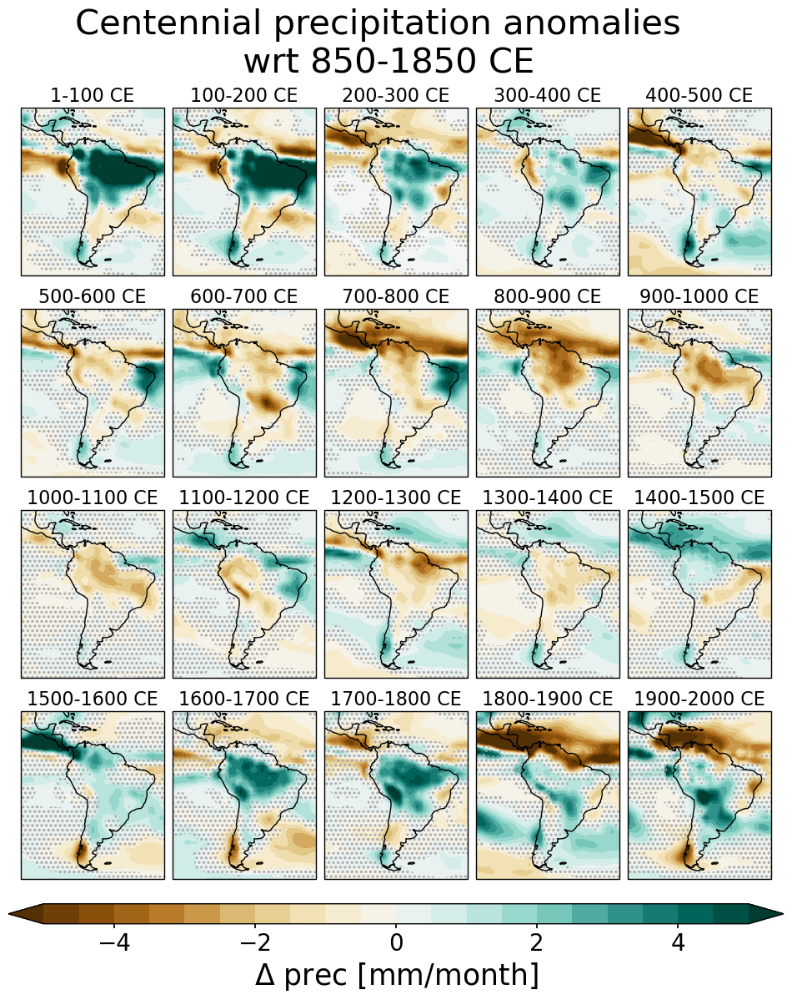

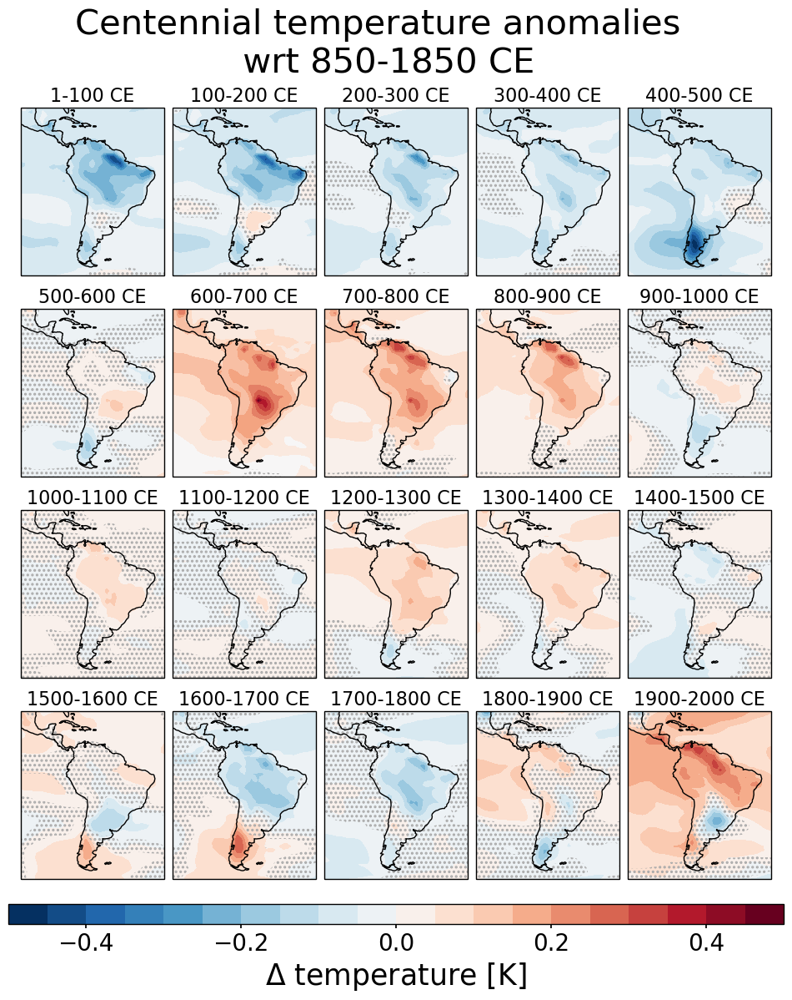

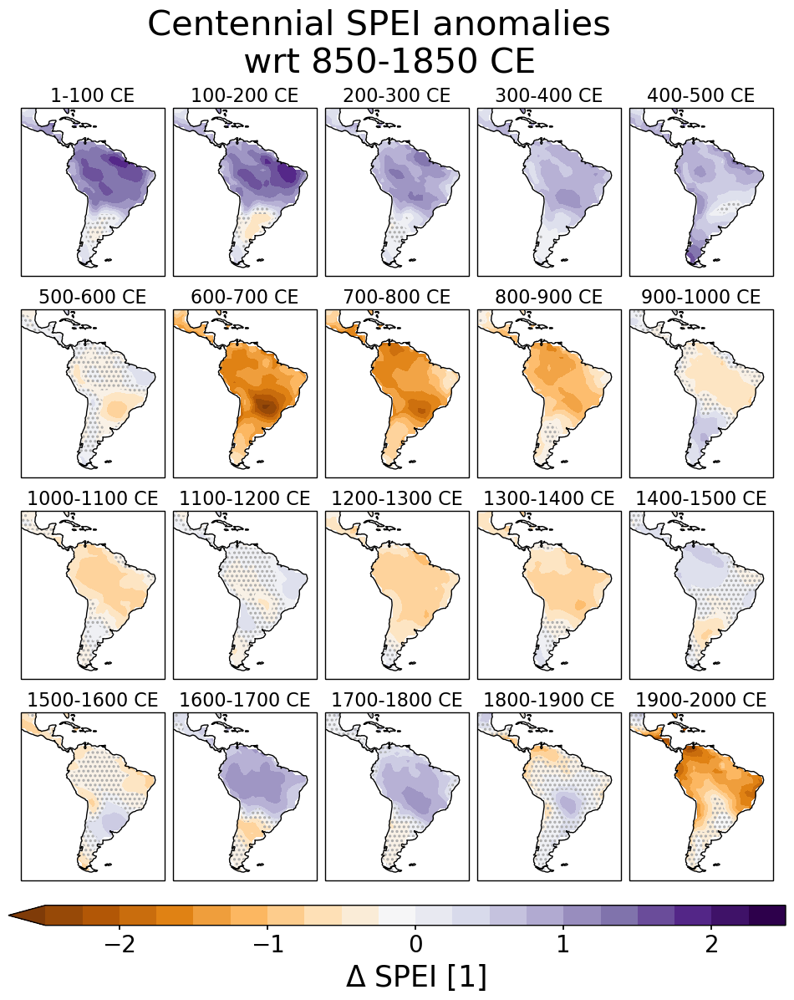

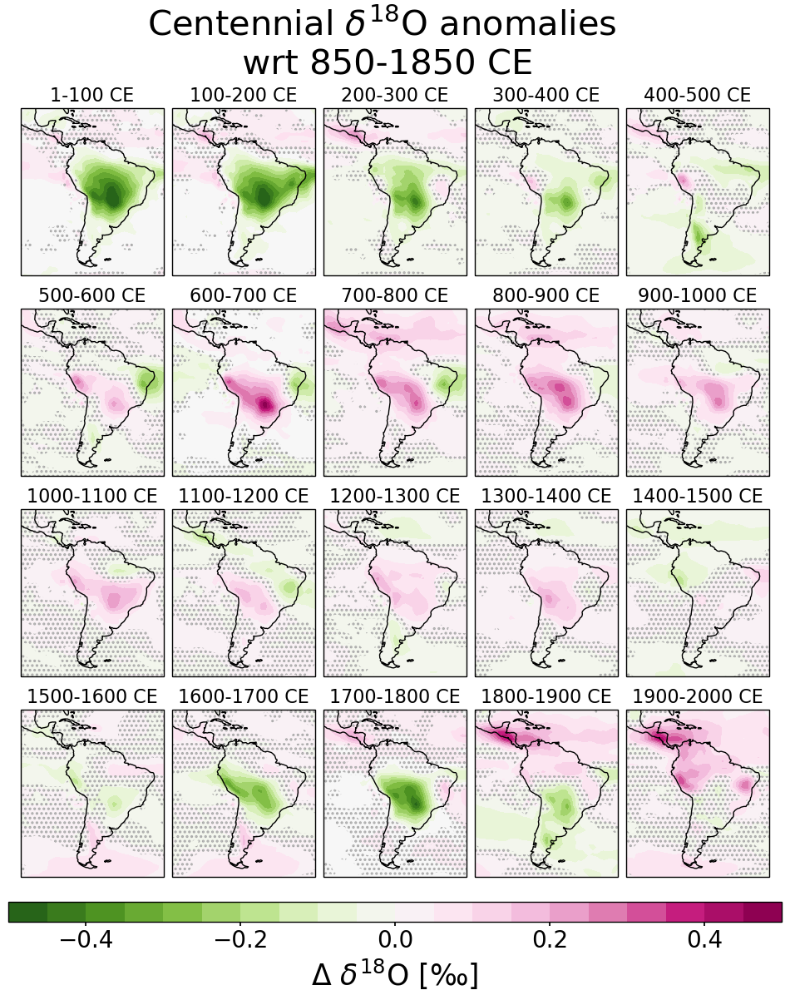

In [64]:
plot3_prec=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
    var='prec_mean',
)

plot3_prec.savefig(savepath+'fig3_prec.pdf', dpi='figure', format='pdf',bbox_inches='tight')

"""
plot1_prec_djf=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/djf/proxy_frac/all_proxies/',
    var='prec_mean',
)
"""

plot3_tsurf=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
    var='tsurf_mean',
)

plot3_tsurf.savefig(savepath+'fig3_tsurf.pdf', dpi='figure', format='pdf',bbox_inches='tight')

"""
plot1_tsurf_djf=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/djf/proxy_frac/all_proxies/',
    var='tsurf_mean',
)
"""

plot3_spei=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
    var='spei_mean',
)
plot3_spei.savefig(savepath+'fig3_spei.pdf', dpi='figure', format='pdf',bbox_inches='tight')

plot3_d18O=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/normal_err/annual/proxy_frac/all_proxies/',
    var='d18O_mean',
)
plot3_d18O.savefig(savepath+'fig3_d18O.pdf', dpi='figure', format='pdf',bbox_inches='tight')

"""
#using same error definition
plot1_tsurf_s=plot3_cent(
    folder='/home/mchoblet/paleoda/results/experiments/paper/revision/same_err/annual/proxy_frac/all_proxies/',
    var='tsurf_mean',
)

## PLOTS FOR PHYDA AND LMR
plot1_lmr_tsurf=plot3_cent(
    mode='lmr',
    var='tsurf_mean',
)


plot1_lmr_prec=plot3_cent(
    mode='lmr',
    var='prec_mean',
)

plot1_phyda_tsurf=plot3_cent(
    mode='phyda',
    var='tsurf_mean',
)


plot1_phyda_spei=plot3_cent(
    mode='phyda',
    var='spei_mean',
)
"""

# Figure 4 Monsoon Index Plots

In [65]:
def plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=False
    
):
    """
    Monsoon Index (Figure 4) using different climate archives.
    Previous version had a line for reconstruction excluding a specific record with particular time series (this part is commented out)
    This Figure involves LMRv2.1 and PHYDA data, put exclude=True if you don't want to use.
    
    mode: path to annual/djf reconstructions
    res=Frequency for low pass filter
    
    SPEI is restandardized for a fair comparison between reconstructions
    """
    #all proxies
    paths=mode+'all_proxies/'
    files=listdir(basepath+paths)
    datasets0 = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets0, dim='dataset')
    all_proxies=combined_dataset.mean('dataset')

    #speleos
    paths=mode+'speleos_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    speleos=combined_dataset.mean('dataset')

    #nospeleos
    paths=mode+'no_speleos/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    no_speleos=combined_dataset.mean('dataset')

    #only trees
    paths=mode+'trees_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    trees=combined_dataset.mean('dataset')
    
    #only trees
    paths=mode+'trees_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    trees=combined_dataset.mean('dataset')
    
    """
    #no trees (not very interesting)
    paths=mode+'no_trees/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    no_trees=combined_dataset.mean('dataset')
    """
    
    
    #exclude paraiso record (old)
    """
    try:
        paths=mode+'no_paraiso_all/'
        files=listdir(basepath+paths)
        datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
        combined_dataset = xr.concat(datasets, dim='dataset')
        no_paraiso_all=combined_dataset.mean('dataset')

        #no paraiso speleo
        paths=mode+'no_paraiso_speleo/'
        files=listdir(basepath+paths)
        datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
        combined_dataset = xr.concat(datasets, dim='dataset')
        no_paraiso_speleo=combined_dataset.mean('dataset')
        
        no_paraiso_all['time']=lmr['time'].values
        no_paraiso_speleo['time']=lmr['time'].values
        
    except:
        pass
    """
        
    #include LMR and PHYDA if desired. This also requires adjusting time axes.
    if exclude==False:
        #load lmr
        ##lmr
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std])

        trees['time']=lmr['time'].values
        no_speleos['time']=lmr['time'].values
        all_proxies['time']=lmr['time'].values
        speleos['time']=lmr['time'].values
    
        dictionary_data={
        'All proxy records':{'data':all_proxies,'ls':'-','c':'black'},
        'Only speleothems':{'data':speleos,'ls':'-','c':'deeppink'},
        'No speleothems':{'data':no_speleos,'ls':'-','c':'darkorange'},
        'Only tree rings':{'data':trees,'ls':'-','c':'forestgreen'},
            #'No trees':{'data':no_trees,'ls':'-','c':'darkorchid'},
            'LMRv2.1':{'data':lmr,'ls':'-','c':'turquoise'},
    }
    else:
        dictionary_data={
        'All proxy records':{'data':all_proxies,'ls':'-','c':'black'},
        'Only speleothems':{'data':speleos,'ls':'-','c':'deeppink'},
        'No speleothems':{'data':no_speleos,'ls':'-','c':'darkorange'},
        'Only tree rings':{'data':trees,'ls':'-','c':'forestgreen'},
        #'No trees':{'data':no_trees,'ls':'-','c':'darkorchid'},
    }
        
    if exclude==False:
        #phyda
        if 'djf' in mode:
            #phyda_djf
            phyda_djf=xr.open_dataset('/home/mchoblet/validation_data/phyda_djf.nc',use_cftime=True)
            phyda_djf=phyda_djf.rename({'tas_mn':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda_djf['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda_djf,'ls':'-','c':'tab:brown'}
 
        else:
            phyda=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc',use_cftime=True)
            phyda=phyda.rename({'tsurf':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda,'ls':'-','c':'tab:brown'}

    #options:
    period=['0001','2000']
    anomaly_period=['0850','1850']
    monsoon_region=[[-17.5,-5],[287.5,312.5]] #Vuille 2012, also used in wortham 2017 and 
    region_=monsoon_region
    cutoff_filt=res #low pass filter 
    labelsize=20
    ticksize=15
    titlesize=25

    import matplotlib.gridspec as gridspec
    fig=plt.figure(figsize = (15,17))
    gs1 = gridspec.GridSpec(4, 1,wspace=0.05, hspace=0.04)
    #gs1.update(wspace=0.05, hspace=0.05)

    plt.suptitle(title,fontsize=titlesize,y=0.95)
    handles_list=[]
    labels_list=[]
    units= ['[mm/month]', '[‰]', '[1]','[K]']
    for i,v in enumerate(['prec_mean','d18O_mean','spei_mean','tsurf_mean']):
        ax1 = plt.subplot(gs1[i])
        plt.grid('on')
        #loop over data
        for j,(source,data) in enumerate(dictionary_data.items()):
            #break
            if v in data['data'].data_vars:
                d=data['data'][v]
                
                if v=='spei_mean':
                    d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 
                
                #compute monsosnbox mean + anomaly
                region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                if res!=None:
                    filtered=quick_filt(region,cutoff=cutoff_filt)
                    region2=region.copy()
                    region2.data=filtered
                else:
                    region2=region.copy()
                region2.plot(c=data['c'],ls=data['ls'],label=source,lw=lw)
            
            t=['a)','b)','c)','d)'][i]
            ax1.text(-0.08, 1, t, transform=ax1.transAxes, size=20,weight='bold')
            
                
        #add time axis only for last one, however always add it to get right number of lines
        #ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=5)

        ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=10)

        if i==3:
            ax1.set_xlabel('Year CE',fontsize=labelsize)
            labels = [item.get_text() for item in ax1.get_xticklabels()]
            
            #print(labels)
            #labels[2]
            labels[1]=1
            labels[2]=250
            labels[3]=500
            labels[4]=750
            
            ax1.set_xticklabels(labels) #to remove leading zeroes
        else:
            #ax1.spines['bottom'].set_visible(False)
            ax1.get_xaxis().set_ticklabels([])
            for tick in ax1.xaxis.get_major_ticks():
                tick.tick1line.set_visible(False)
            ax1.set_xlabel('')
            pass


        ax1.set_title('')
        if lims!=None:
            ax1.set_ylim(lims[i][0],lims[i][1])
        ax1.locator_params(axis='y', nbins=6)
        
        if 'd18' in v:
            ax1.invert_yaxis()
        
        handles,labels=ax1.get_legend_handles_labels()

        for ii,l in enumerate(labels):
            if l not in labels_list:
                handles_list.append(handles[ii])
                labels_list.append(l)

            #ax1.tick_params(axes=labelsize=ticksize)
            #ax1.get_xaxis().set_visible(False)
        if v=='prec_mean': v='Prec'
        if v=='tsurf_mean': v='Temperature'
        if v=='spei_mean': v='SPEI'
        elif v=='d18O_mean': v='$\delta^{18}$O'
        ax1.set_ylabel((v+' '+units[i]),fontsize=labelsize)
        ax1.tick_params(labelsize=ticksize,size=5)

    #legend to the side
    #plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(1.32, 3))#loc='lower left')
    #legend below
    plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(0.9, -0.2),ncols=3,frameon=True,framealpha=1,edgecolor='black')#loc='lower left')
    return fig


def plot4_m_index_uncertainty(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=True
    
):
    """
    Reconstruction uncertainty plots (2*std of reconstructed ensemble) as a fraction all proxy reconstrucction No comparison to LMR and PHYDA
    
    Monsoon Index (Figure 4) using different climate archives.
    Previous version had a line for reconstruction excluding a specific record with particular time series (this part is commented out)
    
    mode: path to annual/djf reconstructions
    res=Frequency for low pass filter
    
    SPEI is restandardized for a fair comparison between reconstructions
    """
    #all proxies
    paths=mode+'all_proxies/'
    files=listdir(basepath+paths)
    datasets0 = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets0, dim='dataset')
    all_proxies=combined_dataset.mean('dataset')

    #speleos
    paths=mode+'speleos_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    speleos=combined_dataset.mean('dataset')

    #nospeleos
    paths=mode+'no_speleos/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    no_speleos=combined_dataset.mean('dataset')

    #only trees
    paths=mode+'trees_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    trees=combined_dataset.mean('dataset')
    
    #only trees
    paths=mode+'trees_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    trees=combined_dataset.mean('dataset')
    
        
    #include LMR and PHYDA if desired. This also requires adjusting time axes.
    """
    if exclude==False:
        #load lmr
        ##lmr
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std])

        trees['time']=lmr['time'].values
        no_speleos['time']=lmr['time'].values
        all_proxies['time']=lmr['time'].values
        speleos['time']=lmr['time'].values
    
        dictionary_data={
        'All proxy records':{'data':all_proxies,'ls':'-','c':'black'},
        'Only speleothems':{'data':speleos,'ls':'-','c':'deeppink'},
        'No speleothems':{'data':no_speleos,'ls':'-','c':'darkorange'},
        'Only tree rings':{'data':trees,'ls':'-','c':'forestgreen'},
            #'No trees':{'data':no_trees,'ls':'-','c':'darkorchid'},
            'LMRv2.1':{'data':lmr,'ls':'-','c':'turquoise'},
    }
    """
    #else:
    dictionary_data={
    'All proxy records':{'data':all_proxies,'ls':'-','c':'black'},
    'Only speleothems':{'data':speleos,'ls':'-','c':'deeppink'},
    'No speleothems':{'data':no_speleos,'ls':'-','c':'darkorange'},
    'Only tree rings':{'data':trees,'ls':'-','c':'forestgreen'},
    #'No trees':{'data':no_trees,'ls':'-','c':'darkorchid'},
    }

    #options:
    period=['0001','2000']
    anomaly_period=['0850','1850']
    monsoon_region=[[-17.5,-5],[287.5,312.5]] #Vuille 2012, also used in wortham 2017 and 
    region_=monsoon_region
    cutoff_filt=res #low pass filter 
    labelsize=20
    ticksize=15
    titlesize=25

    import matplotlib.gridspec as gridspec
    fig=plt.figure(figsize = (15,17))
    gs1 = gridspec.GridSpec(4, 1,wspace=0.05, hspace=0.04)
    #gs1.update(wspace=0.05, hspace=0.05)

    plt.suptitle(title,fontsize=titlesize,y=0.95)
    handles_list=[]
    labels_list=[]
    units= ['[mm/month]', '[‰]', '[1]','[K]']
    #units= ['', '', '','']
    for i,v in enumerate(['prec_std','d18O_std','spei_std','tsurf_std']):
        ax1 = plt.subplot(gs1[i])
        plt.grid('on')
        #loop over data
        for j,(source,data) in enumerate(dictionary_data.items()):
            #break
            if v in data['data'].data_vars:
                d=data['data'][v]
                """
                if source=='All proxy records':
                    all_prox=d
                    continue
                else:
                    d=d/all_prox*100
                """
                #if v=='spei_std':
                #    d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 
                
                #compute monsosnbox mean + anomaly
                region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                #region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                if res!=None:
                    filtered=quick_filt(region,cutoff=cutoff_filt)
                    region2=region.copy()
                    region2.data=filtered
                else:
                    region2=region.copy()
                region2.plot(c=data['c'],ls=data['ls'],label=source,lw=lw)
            
            t=['a)','b)','c)','d)'][i]
            ax1.text(-0.08, 1, t, transform=ax1.transAxes, size=20,weight='bold')
            
                
        #add time axis only for last one, however always add it to get right number of lines
        #ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=5)

        ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=10)

        if i==3:
            ax1.set_xlabel('Year CE',fontsize=labelsize)
            labels = [item.get_text() for item in ax1.get_xticklabels()]
            
            #print(labels)
            #labels[2]
            labels[1]=1
            labels[2]=250
            labels[3]=500
            labels[4]=750
            
            ax1.set_xticklabels(labels) #to remove leading zeroes
        else:
            #ax1.spines['bottom'].set_visible(False)
            ax1.get_xaxis().set_ticklabels([])
            for tick in ax1.xaxis.get_major_ticks():
                tick.tick1line.set_visible(False)
            ax1.set_xlabel('')
            pass


        ax1.set_title('')
        if lims!=None:
            ax1.set_ylim(lims[i][0],lims[i][1])
        ax1.locator_params(axis='y', nbins=6)
        
        #if 'd18' in v:
        #    ax1.invert_yaxis()
        
        handles,labels=ax1.get_legend_handles_labels()

        for ii,l in enumerate(labels):
            if l not in labels_list:
                handles_list.append(handles[ii])
                labels_list.append(l)

            #ax1.tick_params(axes=labelsize=ticksize)
            #ax1.get_xaxis().set_visible(False)
        if v=='prec_std': v='Prec'
        if v=='tsurf_std': v='Temperature'
        if v=='spei_std': v='SPEI'
        elif v=='d18O_std': v='$\delta^{18}$O'
        ax1.set_ylabel((v+' '+units[i]),fontsize=labelsize)
        ax1.tick_params(labelsize=ticksize,size=5)

    #legend to the side
    #plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(1.32, 3))#loc='lower left')
    #legend below
    plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(0.9, -0.2),ncols=3,frameon=True,framealpha=1,edgecolor='black')#loc='lower left')
    return fig

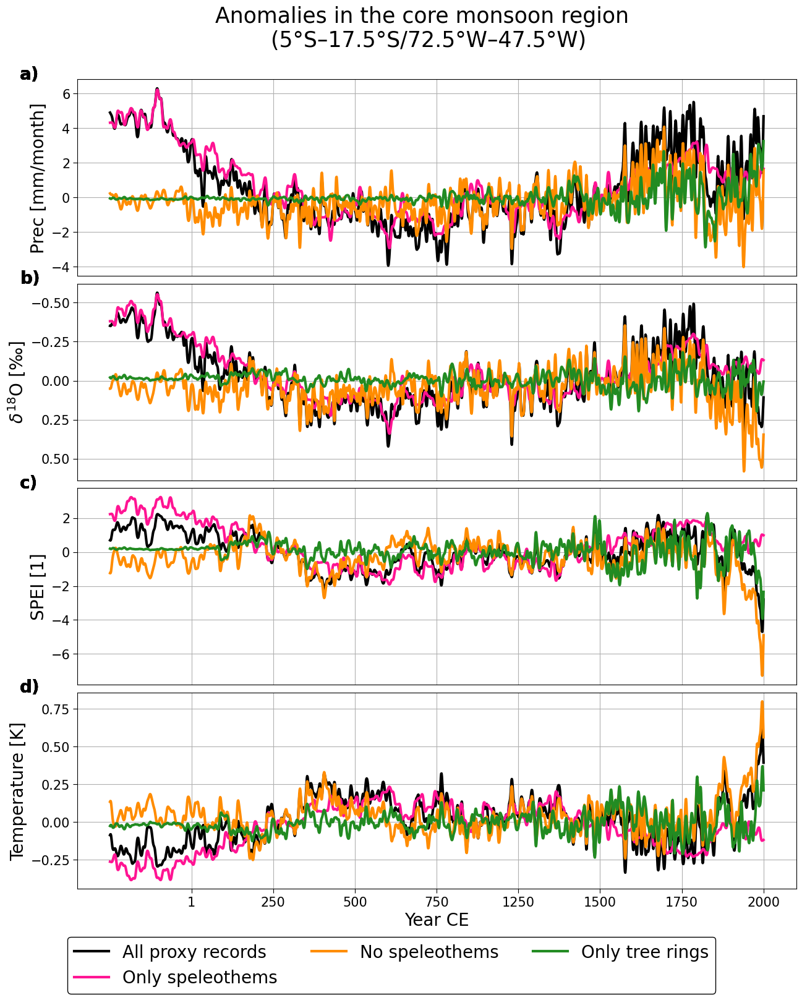

In [45]:
fig=plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/',
res=1/10,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=False
)

#fig.savefig(savepath+'fig4_ann.pdf', dpi='figure', format='pdf',bbox_inches='tight')

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:454: CFWarning: this date/calendar/year zero convention is not supported by CF
  return cftime.date2num(ticks, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_a

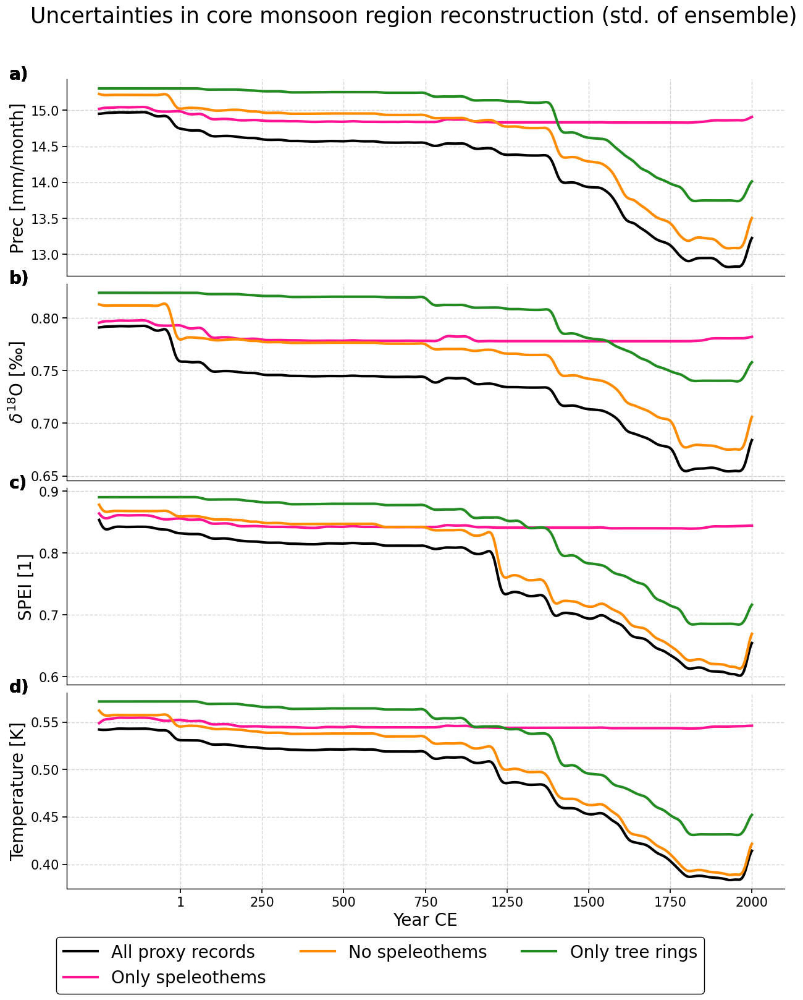

In [66]:
fig=plot4_m_index_uncertainty(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/',
res=1/50,
title=r'Uncertainties in core monsoon region reconstruction (std. of ensemble)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=True
)

fig.savefig(savepath+'fig4_ann_uncert.pdf', dpi='figure', format='pdf',bbox_inches='tight')

/tmp/ipykernel_56072/187668933.py:201: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(labels) #to remove leading zeroes


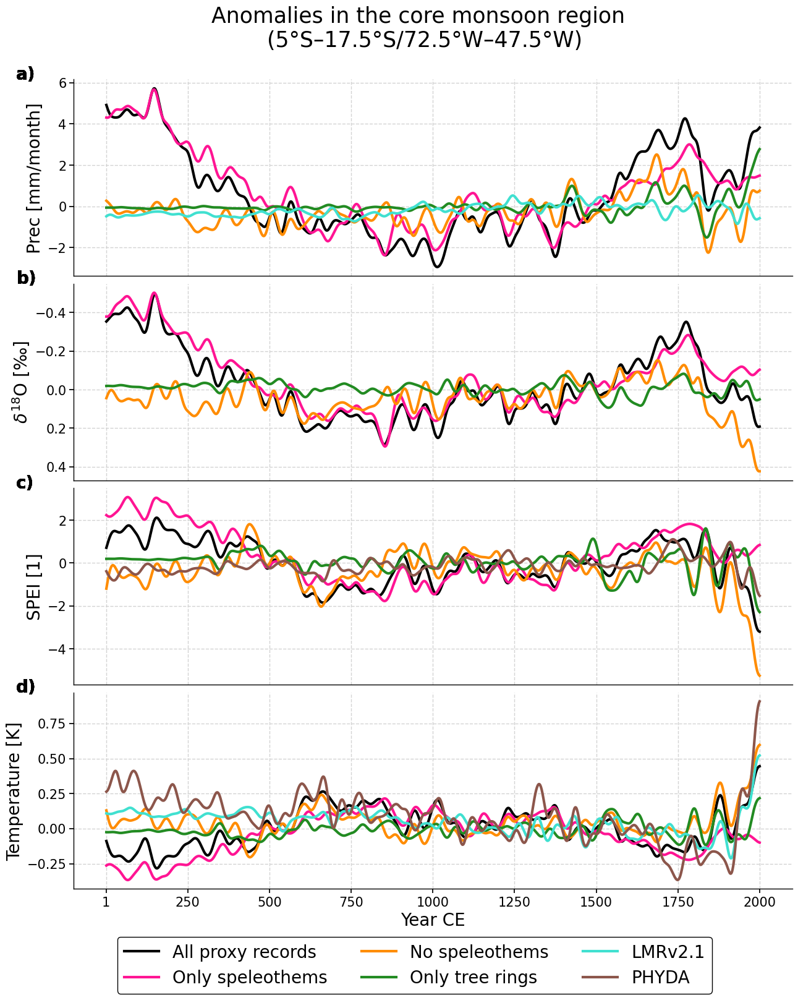

In [67]:
fig=plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=False
)

fig.savefig(savepath+'fig4_ann.pdf', dpi='figure', format='pdf',bbox_inches='tight')

/tmp/ipykernel_56072/187668933.py:201: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(labels) #to remove leading zeroes


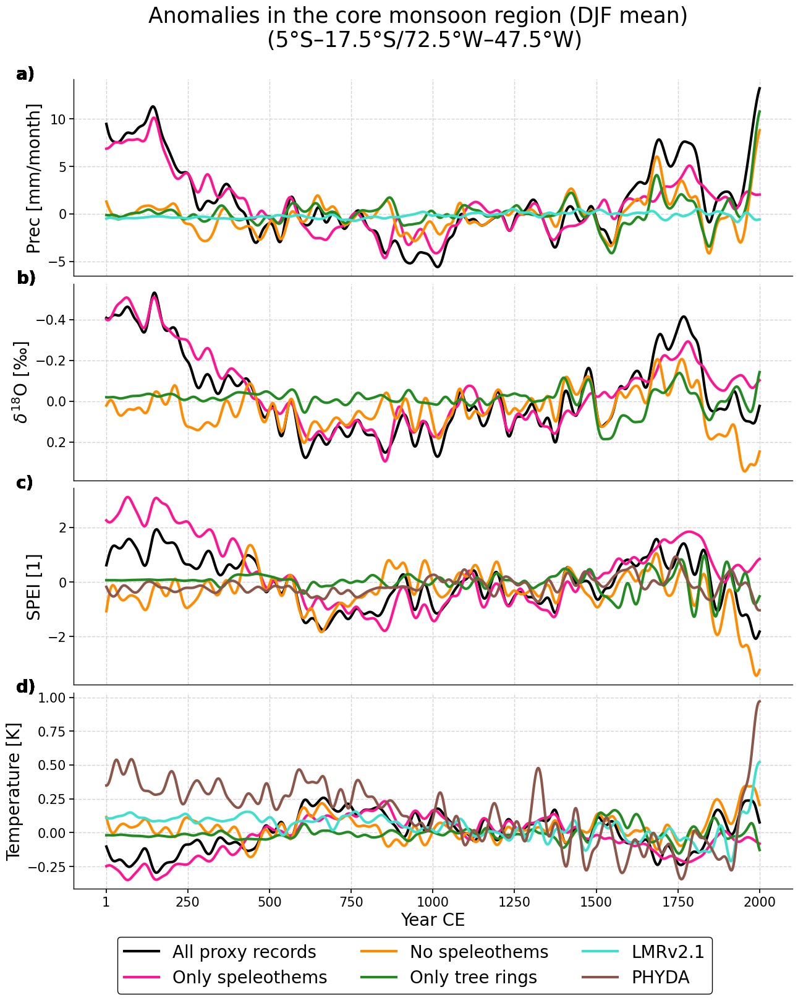

In [68]:
#same for djf

fig=plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/djf/proxy_frac/',
res=1/50,
title='Anomalies in the core monsoon region (DJF mean) \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=False
)

fig.savefig(savepath+'fig4_djf.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [58]:
""" function also works without lmr and phyda data (exclude=True)

fig=plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/djf/proxy_frac/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3, #linewidth 
    lims=None, #y-limits of plot
    exclude=True
)
"""


" function also works without lmr and phyda data (exclude=True)\n\nfig=plot4_m_index(\nbasepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',\nmode='/normal_err/djf/proxy_frac/',\nres=1/50,\ntitle='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',\n    lw=3, #linewidth \n    lims=None, #y-limits of plot\n    single_model=False,\n    exclude=True\n    \n)\n"

In [94]:
def plot4_m_index_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=False
):
    """
    Plot Monsoon index for individual reconstructions (single model priors). In mode set the reconstruction you want to have (all_proxies, no_speleos...)
    (Very similar to previous plot)
    
    """
    #Single model variant
    
    paths=mode
    files=listdir(basepath+paths)
    datasets0 = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets0, dim='dataset')
    all_proxies=combined_dataset.mean('dataset')
    dictionary_data={'Mean':{'data':all_proxies,'ls':'-','c':'black'}}
    
    if exclude==False:
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std])
        dictionary_data['LMRv2.1']={'data':lmr,'ls':'-','c':'turquoise'}
        dictionary_data['Mean']['data']['time']=lmr['time'].values
        
        if 'djf' in mode:
            phyda_djf=xr.open_dataset('/home/mchoblet/validation_data/phyda_djf.nc',use_cftime=True)
            phyda_djf=phyda_djf.rename({'tas_mn':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda_djf['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda_djf,'ls':'-','c':'tab:brown'}
        else:
            phyda=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc',use_cftime=True)
            phyda=phyda.rename({'tsurf':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda,'ls':'-','c':'tab:brown'}

    #options:
    period=['0001','2000']
    anomaly_period=['0850','1850']
    monsoon_region=[[-17.5,-5],[287.5,312.5]] #Vuille 2012, also used in wortham 2017 and 
    region_=monsoon_region
    cutoff_filt=res #low pass filter
    labelsize=20
    ticksize=15
    titlesize=25

    import matplotlib.gridspec as gridspec
    fig=plt.figure(figsize = (15,17))
    gs1 = gridspec.GridSpec(4, 1,wspace=0.05, hspace=0.04)
    #gs1.update(wspace=0.05, hspace=0.05)

    plt.suptitle(title,fontsize=titlesize,y=0.95)
    handles_list=[]
    labels_list=[]
    units= ['[mm/month]', '[‰]', '[1]','[K]']
    for i,v in enumerate(['prec_mean','d18O_mean','spei_mean','tsurf_mean']):
        ax1 = plt.subplot(gs1[i])
        plt.grid('on')
        #loop over data
        for j,(source,data) in enumerate(dictionary_data.items()):
            #break
            if v in data['data'].data_vars:
                d=data['data'][v]
                
                if v=='spei_mean':
                    d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 
                
                #compute monsosnbox mean + anomaly
                region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                if res!=None:
                    filtered=quick_filt(region,cutoff=cutoff_filt)
                    region2=region.copy()
                    region2.data=filtered
                else:
                    region2=region.copy()
                region2.plot(c=data['c'],ls=data['ls'],label=source,lw=lw)
                
                if j==0:
                    for ii,d in enumerate(datasets0):
                        d=d[v]
                        if v=='spei_mean':
                            d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 

                        #compute monsosnbox mean + anomaly
                        region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                        region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                        if res!=None:
                            filtered=quick_filt(region,cutoff=cutoff_filt)
                            region2=region.copy()
                            region2.data=filtered
                        else:
                            region2=region.copy()
                        region2.plot(ls='--',c=['tab:red','tab:green','tab:blue','tab:orange','tab:brown'][ii],label=files[ii][:-3],lw=2)
        
            t=['a)','b)','c)','d)'][i]
            ax1.text(-0.08, 1, t, transform=ax1.transAxes, size=20,weight='bold')
            
        
        #add time axis only for last one, however always add it to get right number of lines
        #ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=5)

        ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=10)

        if i==3:
            ax1.set_xlabel('Year CE',fontsize=labelsize)
            labels = [item.get_text() for item in ax1.get_xticklabels()]
            
            #print(labels)
            #labels[2]
            labels[1]=1
            labels[2]=250
            labels[3]=500
            labels[4]=750
            
            ax1.set_xticklabels(labels) #to remove leading zeroes
            
        else:
            #ax1.spines['bottom'].set_visible(False)
            ax1.get_xaxis().set_ticklabels([])
            for tick in ax1.xaxis.get_major_ticks():
                tick.tick1line.set_visible(False)
            ax1.set_xlabel('')
            pass


        ax1.set_title('')
        if lims!=None:
            ax1.set_ylim(lims[i][0],lims[i][1])
        ax1.locator_params(axis='y', nbins=6)
        
        if 'd18' in v:
            ax1.invert_yaxis()
        
        handles,labels=ax1.get_legend_handles_labels()

        for ii,l in enumerate(labels):
            if l not in labels_list:
                handles_list.append(handles[ii])
                labels_list.append(l)

            #ax1.tick_params(axes=labelsize=ticksize)
            #ax1.get_xaxis().set_visible(False)
        if v=='prec_mean': v='Prec'
        if v=='tsurf_mean': v='Temperature'
        if v=='spei_mean': v='SPEI'
        elif v=='d18O_mean': v='$\delta^{18}$O'
        ax1.set_ylabel((v+' '+units[i]),fontsize=labelsize)
        ax1.tick_params(labelsize=ticksize,size=5)

    #put first legend entry last (looks nicer to have the mean in the end)
    handles_list.append(handles_list.pop(0))
    labels_list.append(labels_list.pop(0))
    
    #legend to the side
    #plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(1.32, 3),title='Model used as prior',title_fontsize=22)#loc='lower left')
    
    #plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(1.32, 3))#loc='lower left')
    #legend below
    #plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(0.9, -0.2),ncols=3)#loc='lower left')
    plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(0.9, -0.2),ncols=4,title='Model used as prior',title_fontsize=22,frameon=True,framealpha=1,edgecolor='black')#loc='lower left')
    
    
    return fig

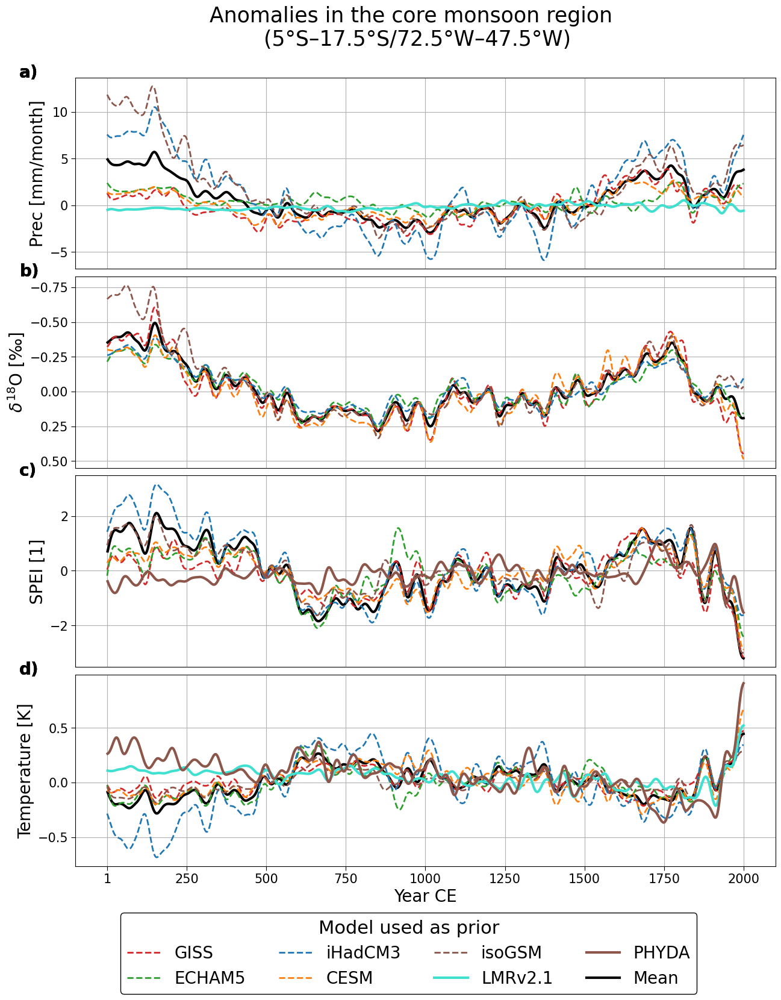

In [120]:
fig=plot4_m_index_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=False
)

fig.savefig(savepath+'fig4_single_priors.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [ ]:
"""
fig=plot4_m_index_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/djf/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region (DJF mean) \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=False
)
"""

""" exclude lmr and phyda data
fig=plot4_m_index_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=True
)
#"""

""" Altnernative reconstructions"

f2_mods_same=plot4_m_index_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/same_err/annual/proxy_frac/all_proxies/',
    res=1/50,
    title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W) (DJF)',
    lw=3,
    lims=[[-7,14],[-0.5,0.5],[-4,3],[-0.45,0.8]]
)

f2_mods_half=plot4_m_index_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/half_err/annual/proxy_frac/all_proxies/',
    res=1/50,
    title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W) (DJF)',
    lw=3,
    lims=[[-7,14],[-0.5,0.5],[-4,3],[-0.45,0.8]]
)

f2_same=plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/same_err/annual/proxy_frac/',
    res=1/50,
    title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=[[-3.5,6],[-0.5,0.5],[-4,3],[-0.45,0.8]]
)
#"""

"""#no temporal smoothing
f=plot4_m_index(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/annual/proxy_frac/',
    res=None,
    lw=1
)
#"""

In [123]:
import matplotlib.pyplot as plt
plt.style.use('tableau-colorblind10')

In [124]:
def plot4_m_prec_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=False
):
    """
    Plot Monsoon index for individual reconstructions (single model priors). In mode set the reconstruction you want to have (all_proxies, no_speleos...)
    
    Only for precipitation!
    
    
    """
    #Single model variant
    
    paths=mode
    files=listdir(basepath+paths)
    datasets0 = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets0, dim='dataset')
    all_proxies=combined_dataset.mean('dataset')
    dictionary_data={'Mean':{'data':all_proxies,'ls':'-','c':'black'}}
    
    if exclude==False:
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std])
        dictionary_data['LMRv2.1']={'data':lmr,'ls':'-','c':'turquoise'}
        dictionary_data['Mean']['data']['time']=lmr['time'].values
        
        if 'djf' in mode:
            phyda_djf=xr.open_dataset('/home/mchoblet/validation_data/phyda_djf.nc',use_cftime=True)
            phyda_djf=phyda_djf.rename({'tas_mn':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda_djf['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda_djf,'ls':'-','c':'tab:brown'}
        else:
            phyda=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc',use_cftime=True)
            phyda=phyda.rename({'tsurf':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda,'ls':'-','c':'tab:brown'}

    #options:
    period=['0001','2000']
    anomaly_period=['0850','1850']
    monsoon_region=[[-17.5,-5],[287.5,312.5]] #Vuille 2012, also used in wortham 2017 and 
    region_=monsoon_region
    cutoff_filt=res #low pass filter
    labelsize=20
    ticksize=15
    titlesize=25

    import matplotlib.gridspec as gridspec
    fig=plt.figure(figsize = (15,5))
    gs1 = gridspec.GridSpec(1, 1,wspace=0.05, hspace=0.04)
    #gs1.update(wspace=0.05, hspace=0.05)

    plt.suptitle(title,fontsize=titlesize,y=1.04)
    handles_list=[]
    labels_list=[]
    units= ['[mm/month]']
    for i,v in enumerate(['prec_mean']):
        ax1 = plt.subplot(gs1[i])
        plt.grid('on')
        #loop over data
        for j,(source,data) in enumerate(dictionary_data.items()):
            #break
            if v in data['data'].data_vars:
                d=data['data'][v]
                
                if v=='spei_mean':
                    d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 
                
                #compute monsosnbox mean + anomaly
                region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                if res!=None:
                    filtered=quick_filt(region,cutoff=cutoff_filt)
                    region2=region.copy()
                    region2.data=filtered
                else:
                    region2=region.copy()
                if source=='LMRv2.1':
                    region2.plot(c='white',alpha=0,ls=data['ls'],label='_',lw=lw)
                else:
                    region2.plot(c=data['c'],ls=data['ls'],label=source,lw=lw)
                    
                
                if j==0:
                    for ii,d in enumerate(datasets0):
                        d=d[v]
                        if v=='spei_mean':
                            d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 

                        #compute monsosnbox mean + anomaly
                        region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                        region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                        if res!=None:
                            filtered=quick_filt(region,cutoff=cutoff_filt)
                            region2=region.copy()
                            region2.data=filtered
                        else:
                            region2=region.copy()
                        #hack to get the time axis right without including lmr
                        if source=='LMRv2.1':
                            region2.plot(ls='-',c='white',alpha=0,label='_',lw=2)
                        else:
                            region2.plot(ls='-',c=['tab:red','tab:green','tab:blue','tab:orange','tab:brown'][ii],label=files[ii][:-3],lw=2)
        
            #t=['a)','b)','c)','d)'][i]
            #ax1.text(-0.08, 1, t, transform=ax1.transAxes, size=20,weight='bold')
            
        
        #add time axis only for last one, however always add it to get right number of lines
        #ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=5)

        ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=10)

        if i==0:
            ax1.set_xlabel('Year CE',fontsize=labelsize)
            labels = [item.get_text() for item in ax1.get_xticklabels()]
            
            #print(labels)
            #labels[2]
            labels[1]=1
            labels[2]=250
            labels[3]=500
            labels[4]=750
            
            ax1.set_xticklabels(labels) #to remove leading zeroes
        else:
            #ax1.spines['bottom'].set_visible(False)
            ax1.get_xaxis().set_ticklabels([])
            for tick in ax1.xaxis.get_major_ticks():
                tick.tick1line.set_visible(False)
            ax1.set_xlabel('')
            pass


        ax1.set_title('')
        if lims!=None:
            ax1.set_ylim(lims[i][0],lims[i][1])
        ax1.locator_params(axis='y', nbins=6)
        
        if 'd18' in v:
            ax1.invert_yaxis()
        
        handles,labels=ax1.get_legend_handles_labels()

        for ii,l in enumerate(labels):
            if l not in labels_list:
                handles_list.append(handles[ii])
                labels_list.append(l)

            #ax1.tick_params(axes=labelsize=ticksize)
            #ax1.get_xaxis().set_visible(False)
        if v=='prec_mean': v='Prec'
        if v=='tsurf_mean': v='Temperature'
        if v=='spei_mean': v='SPEI'
        elif v=='d18O_mean': v='$\delta^{18}$O'
        ax1.set_ylabel((v+' '+units[i]),fontsize=labelsize)
        ax1.tick_params(labelsize=ticksize,size=5)

    #put first legend entry last (looks nicer to have the mean in the end)
    handles_list.append(handles_list.pop(0))
    labels_list.append(labels_list.pop(0))
    
    #legend to the side
    plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(0.83, -0.14),ncols=3,title='Model used as prior',title_fontsize=22,frameon=True,framealpha=1,edgecolor='black')#loc='lower left')
    
    
    return fig

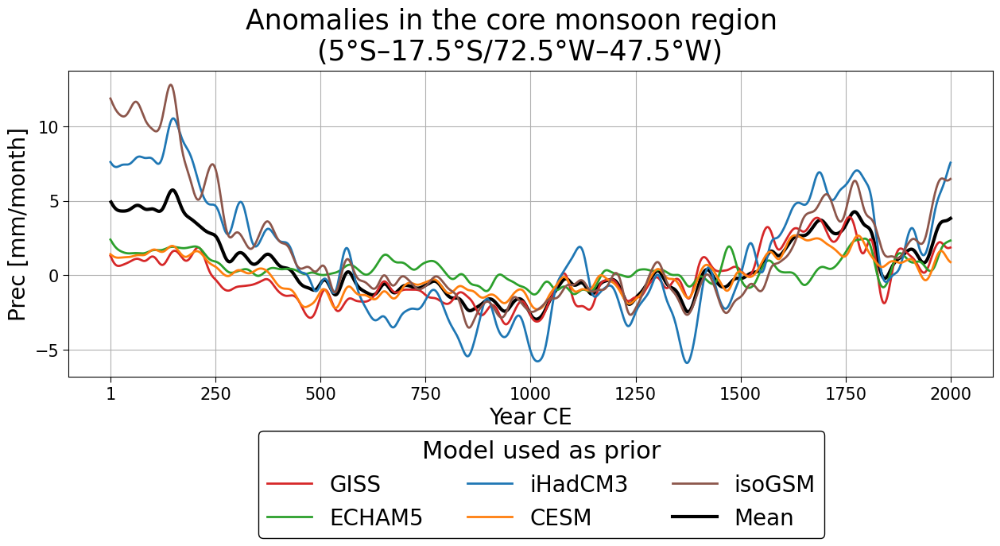

In [125]:
fig=plot4_m_prec_sm(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=False
)

fig.savefig(savepath+'fig4_single_priors_prec.pdf', dpi='figure', format='pdf',bbox_inches='tight')

# Figure 5: Spectra plots

* Spectra computed using the multitaper method (using the Pyleoclim package
* The MTM spectrum is computed without standardization, but by resampling all time series to 10 year averages (for means of comparability, as the speleothem only reconstruction only use decadal time scale)
* Wavelet spectrum computed using continous wavelet spectrum method (also using pyleoclim). This figure involves a detrending 

In [71]:
def spectra(var='prec_mean', #could also possibly be d18O
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='normal_err/annual/proxy_frac/',
            title='MTM-Spectra of monsoon \n precipitation index',
            lmr=False,
            time=['0001','2000'],
            alpha=0.95
           ):
    """
    PSD and wavelet spectrum.
    
    """
    #LOAD THE DATA

    # loop over data.
    paths=mode+'all_proxies/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    all_proxies=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
    #speleos
    paths=mode+'speleos_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    speleos=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
    #nospeleos
    paths=mode+'no_speleos/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    no_speleos=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
    #trees only
    paths=mode+'trees_only/'
    files=listdir(basepath+paths)
    datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets, dim='dataset')
    trees=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
        

    dictionary_data={
        'All proxies':{'data':all_proxies,'ls':'-','c':'black'},
        'Only speleothems':{'data':speleos,'ls':'-','c':'deeppink'},
        'No speleothems':{'data':no_speleos,'ls':'-','c':'darkorange'},
        'Only tree rings':{'data':trees,'ls':'-','c':'forestgreen'},
    #    'All proxies (DJF)':{'data':all_proxies_djf,'ls':'-','c':'grey'},
    }
    if lmr:
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice(time[0],time[1]))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30 #unit conversion for lmr precipitation /s to per month
        lmr_prec['time']=trees['time'].values
        dictionary_data['LMRv2.1']={'data':lmr_prec,'ls':'-','c':'turquoise'}

    figsize=(15,5)
    fig,ax=plt.subplots(nrows=1,ncols=2,figsize=figsize)
    titlesize=22
    labelsize=18
    ticksize=14

    ax[0].set_title(title,fontsize=titlesize)
    ax[1].set_title('Wavelet spectrum \n (all proxy records)',fontsize=titlesize)
    ax[0].set_xlabel('Period [years]',fontsize=labelsize,labelpad=2)
    #ax[0].set_ylabel('PSD [K$^2$ yr]',fontsize=labelsize,labelpad=-5)
    ax[0].set_ylabel('PSD',fontsize=labelsize,labelpad=-5)

    method='mtm'
    #method='wwz'
    sig=0.90

    xlabs=[100,50,20,10,5,2]
    xlabs_freq=[1/x for x in xlabs]
    xlabs=np.array(xlabs)*10
    labels_2=list(map(str,xlabs))

    amplis=[]
    psds=[]
    valuees=[]

    #loop over dictionary data
    for i,(source,data) in enumerate(dictionary_data.items()):
        d=data['data'][var]
        region=regionalmean(d)
        res=region.resample(time='10YS').mean()
        #res=region.resample(time='1YS').mean()
        py_ser=pyleo.Series(value=res,time=np.arange(len(res)),time_name='time',time_unit='year',label='other')
        #py_ser.value -= py_ser.filter(method='butterworth',cutoff_scale=100).value
        #py_ser.value=quick_filt(py_ser.value,cutoff=1/10)

        #valuees.append(py_ser)

        if i==0: #all_recon=py_ser #save for later, used in plot b)
            res=region.resample(time='1YS').mean()
            all_recon=pyleo.Series(value=res,time=np.arange(len(res)),time_name='time',time_unit='year',label='other')
        test=py_ser.spectral(method=method,settings={'standardize':False}) #standardize false important for comparing the amount of variability in different reconstructions
        ampli=test.amplitude
        ax[0].loglog(test.frequency,ampli,color=data['c'],lw=3,ls=data['ls'],label=source)

        #sig_lev=py_ser.spectral(method=method,settings={'standardize':False}).signif_test(qs=[sig])
        #ax[0].loglog(sig_lev.frequency,sig_lev.signif_qs.psd_list[0].amplitude,color=data['c'],lw=3,ls='--')

    ax[0].legend(fontsize=ticksize,frameon=True)
    #replace ticks with correct frequency (due to resampling)
    ax[0].set_xticks(xlabs_freq, labels=labels_2,fontsize=ticksize)
    ax[0].tick_params(axis='both', which='major', labelsize=ticksize)
    ax[0].set_xlim(1/100)

    #why would i detrend for the wavelet plot?? If I do, I shall detrend both
    #all_recon.value -= all_recon.filter(method='butterworth',cutoff_scale=500).value
    #settint colorbar limits/levels with pyleoclim plot a bit cumbersome unfortunately (e.g. I could set'vmax' in contourf_style, but that won't change the colorbar for some obscure reason...)

    scal = all_recon.standardize().wavelet(method='cwt')
    scal_sig = scal.signif_test(method='ar1sim',number = 200,seed=42,qs=[alpha])
    plot=scal_sig.plot(ax=ax[1],contourf_style = {'cmap':'viridis'},cbar_style={'label':'Amplitude'})
    fig.axes[-1].tick_params(labelsize=ticksize)

    ax[1].set_ylim(20)
    ax[1].set_title('Wavelet spectrum\n(all proxy records)',fontsize=titlesize)
    ax[1].tick_params(axis='both', which='major', labelsize=ticksize)
    ax[1].tick_params(axis='both', which='minor', labelsize=ticksize)
    ax[1].set_xlabel('Time [year CE]',fontsize=labelsize,labelpad=2)
    ax[1].set_ylabel('Periodicity [years]',fontsize=labelsize,labelpad=2)

    ax[0].text(-0.1, 1, 'a)', transform=ax[0].transAxes, size=20,weight='bold')
    ax[1].text(-0.1, 1, 'b)', transform=ax[1].transAxes, size=20,weight='bold')
    
    return fig
    
    #fig.savefig('/home/mchoblet/paleoda/results/plots/paper/fig3_prec.pdf', dpi='figure', format='pdf',bbox_inches='tight')

Performing wavelet analysis on individual series: 100%|██████████| 200/200 [00:03<00:00, 59.36it/s]


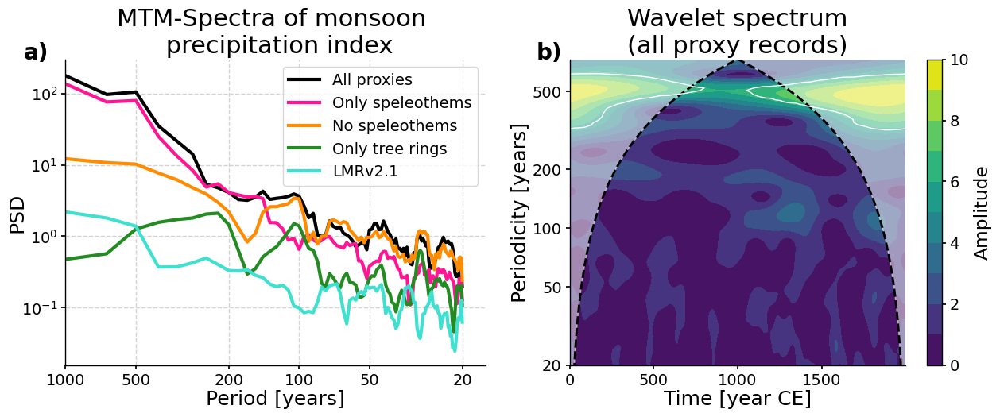

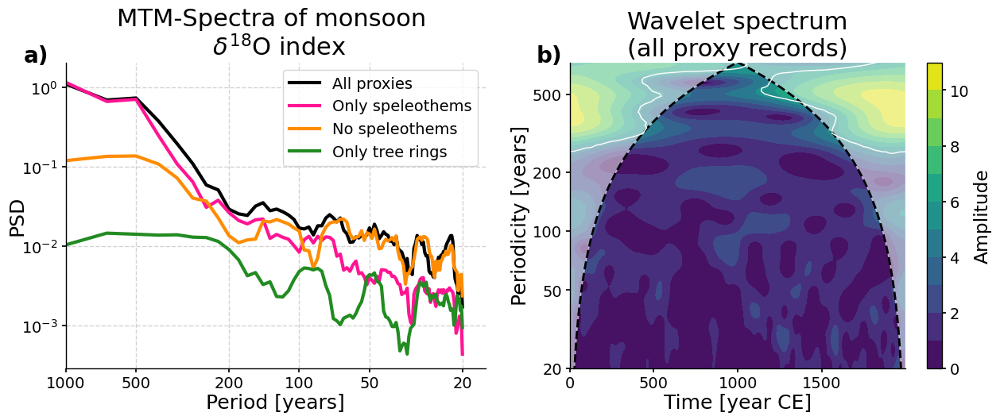

In [72]:
fig=spectra(var='prec_mean', #could also possibly be d18O
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='normal_err/annual/proxy_frac/',lmr=True)

fig.savefig(savepath+'fig5_prec.pdf', dpi='figure', format='pdf',bbox_inches='tight')

fig=spectra(var='d18O_mean', #could also possibly be d18O
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='normal_err/annual/proxy_frac/',
           title='MTM-Spectra of monsoon \n $\delta^{18}$O index')

fig.savefig(savepath+'fig5_d18O.pdf', dpi='figure', format='pdf',bbox_inches='tight')


In [ ]:
"""
fig=spectra(var='prec_mean', #could also possibly be d18O
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='normal_err/annual/proxy_frac/',lmr=False,
           time=['0850','1850'])

fig=spectra(var='prec_mean', #could also possibly be d18O
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='same_err/djf/proxy_frac/')
"""

## Appendix: Spectra and SASM index in model simulations:

* Important to standardize time series for the PSDS here (the model simulations contain more overall variance compared to the reconstruction).
* **Adapt paths to model data**
* Loading model data takes some minutes

In [73]:
#Load SASM index for prior simulations

model_path='/home/mchoblet/paleoda/data/model_data/upsampled/'
prec_paths=['CCSM_prec_851_1850.nc','CESM_prec_850_1850.nc','ECHAM5_prec_850_1849.nc','GISS_prec_850_1849.nc','iHADCM3_prec_801_1952.nc']
d18O_paths=['CCSM_d18O_851_1850.nc','CESM_d18O_850_1850.nc','ECHAM5_d18O_850_1849.nc','GISS_d18O_850_1849.nc','iHADCM3_d18O_801_1952.nc']
spei_paths=['CCSM_spei_pearson_12.nc','CESM_spei_pearson_12.nc','ECHAM5_spei_pearson_12.nc','GISS_spei_pearson_12.nc','iHADCM3_spei_pearson_12.nc']
tsurf_paths=['CCSM_tsurf_851_1850.nc','CESM_tsurf_850_1850.nc','ECHAM5_tsurf_850_1849.nc','GISS_tsurf_850_1849.nc','iHADCM3_tsurf_801_1952.nc']
models=['isoGSM','CESM','ECHAM','GISS','iHADCM3']

dicti={'ann':{'prec':[],'d18O':[],'spei':[],'tsurf':[]},'djf':{'prec':[],'d18O':[],'spei':[],'tsurf':[]}}
var=['prec','d18O','spei','tsurf']
for i,j in enumerate([prec_paths,d18O_paths,spei_paths,tsurf_paths]):
    for ii,jj in enumerate(j):
        ds=xr.open_dataset(model_path+jj)
        ds=regionalmean(ds)[var[i]]
        ann=annual_mean(ds,4)
        djf=annual_mean(ds,[12,1,2])
        dicti['ann'][var[i]].append(ann)
        dicti['djf'][var[i]].append(djf)
        ds.close()

In [74]:
def spectra_models(basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',standard=True):
    """
    Spectra of reconstructed monsoon index (precipitation/d18O and annual/DJF)
    compared to model priors (only include all proxies)

    Important parameter: standardization of spectra or not. If this is not done, it is visible that overall the models have more varriability (variance), however standardization reveals the stronger scaling in the reconstruction
    """
    figsize=(15,5)
    #fig,ax=plt.subplots(nrows=2,ncols=2,figsize=figsize)
    fig,ax=plt.subplots(nrows=1,ncols=2,figsize=figsize)
    title='MTM-Spectra of monsoon \n precipitation index'
    lmr=False
    time=['0850','1850']
    alpha=0.9

    titlesize=22;labelsize=18;ticksize=14

    #for row,season in enumerate(['annual','djf']):
    for row,season in enumerate(['annual']):
        mode='normal_err/'+season+'/proxy_frac/'

        # loop over data.
        paths=mode+'all_proxies/'
        files=listdir(basepath+paths)
        datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
        combined_dataset = xr.concat(datasets, dim='dataset')
        all_proxies=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
        """
        #speleos
        paths=mode+'speleos_only/'
        files=listdir(basepath+paths)
        datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
        combined_dataset = xr.concat(datasets, dim='dataset')
        speleos=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
        #nospeleos
        paths=mode+'no_speleos/'
        files=listdir(basepath+paths)
        datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
        combined_dataset = xr.concat(datasets, dim='dataset')
        no_speleos=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
        #trees only
        paths=mode+'trees_only/'
        files=listdir(basepath+paths)
        datasets = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
        combined_dataset = xr.concat(datasets, dim='dataset')
        trees=combined_dataset.mean('dataset').sel(time=slice(time[0],time[1]))
        """
        dictionary_data={
            'Reconstruction':{'data':all_proxies,'ls':'-','c':'tab:olive'},
            #'Only Speleothems':{'data':speleos,'ls':'-','c':'deeppink'},
            #'No speleothems':{'data':no_speleos,'ls':'-','c':'darkorange'},
            #'Only trees':{'data':trees,'ls':'-','c':'forestgreen'},
        #    'All proxies (DJF)':{'data':all_proxies_djf,'ls':'-','c':'grey'},
        }
        if lmr:
            lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice(time[0],time[1]))
            lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
            lmr_prec=lmr_prec*24*60*60*30 #unit conversion for lmr precipitation /s to per month
            lmr_prec['time']=trees['time'].values
            dictionary_data['LMRv2.1']={'data':lmr_prec,'ls':'-','c':'turquoise'}


        for ii,v in enumerate(['prec_mean','d18O_mean']):
            sig=0.90
            xlabs=[100,50,20,10,5,2]
            xlabs_freq=[1/x for x in xlabs]
            xlabs=np.array(xlabs)*10
            labels_2=list(map(str,xlabs))

            amplis=[]
            psds=[]
            valuees=[]

            #loop over dictionary data
            for i,(source,data) in enumerate(dictionary_data.items()):
                if source=='LMRv2.1' and v==['d18O_mean']: continue
                d=data['data'][v]
                region=regionalmean(d)
                res=region.resample(time='10YS').mean()
                py_ser=pyleo.Series(value=res,time=np.arange(len(res)),time_name='time',time_unit='year',label='other')
                test=py_ser.spectral(method='mtm',settings={'standardize':standard}) #standardize false important for comparing the amount of variability in different reconstructions
                ampli=test.amplitude
                #ax[row,ii].loglog(test.frequency,ampli,color=data['c'],lw=3,ls=data['ls'],label=source)
                ax[ii].loglog(test.frequency,ampli,color=data['c'],lw=3,ls=data['ls'],label=source)

            #dicti[v[:4]]

            for iii,p in enumerate(dicti[season[:3]][v[:4]]):
                data=p.sel(time=slice(time[0],time[1])).resample(time='10YS').mean()
                data=data-data.mean('time') #remove last millennium mean
                py_ser=pyleo.Series(value=data.values,time=np.arange(len(data)),time_name='time',time_unit='year',label='other')
                test=py_ser.spectral(method='mtm',settings={'standardize':standard})
                ampli=test.amplitude
                #ax[row,ii].loglog(test.frequency,ampli,c=['darkgray','limegreen','cornflowerblue','darkorchid','sienna'][iii],ls=':',lw=2,label=models[iii])
                ax[ii].loglog(test.frequency,ampli,c=['darkgray','limegreen','cornflowerblue','darkorchid','sienna'][iii],ls='-',lw=3,label=models[iii])

            #if row==0:
            ax[ii].set_title(['Precipitation','$\mathbf{\delta^{18}}$O'][ii],fontsize=titlesize,weight='bold')

            #ax[row,ii].set_xlabel('Period [years]',fontsize=labelsize,labelpad=2)
            ax[ii].set_xlabel('Period [years]',fontsize=labelsize,labelpad=2)
            #ax[row,ii].set_ylabel('PSD [K$^2$ yr]',fontsize=labelsize,labelpad=-5)
            ax[ii].set_ylabel('PSD',fontsize=labelsize,labelpad=-5)

    #ax[0,0].text(-0.4,0.5,'Annual', va='center',transform=ax[0,0].transAxes,weight='bold')
    #ax[1,0].text(-0.4,0.5,'DJF', va='center',transform=ax[1,0].transAxes,weight='bold')

    #handles,labels=ax[0,0].get_legend_handles_labels()
    handles,labels=ax[0].get_legend_handles_labels()
    #plt.legend(handles,labels,fontsize=20,bbox_to_anchor=(1.2, 1.6))
    plt.legend(handles,labels,fontsize=20,bbox_to_anchor=(1.05, 1.15))
    return fig

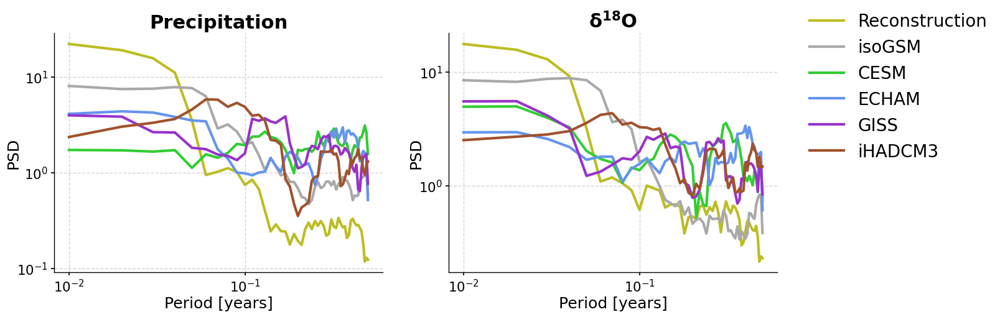

In [75]:
fig=spectra_models(basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',standard=True)

fig.savefig(savepath+'fig5_models_app.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [76]:
def plot4_simus(
basepath='/home/mchoblet/paleoda/results/experiments/paper/final_new/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=False,
    time=['0850','1850'],
):
    """
    Plot Monsoon index for all proxy reconstruction and the model simulations.
    
    
    for individual reconstructions (single model priors). In mode set the reconstruction you want to have (all_proxies, no_speleos...)
    (Very similar to previous plot)
    
    """
    
    paths=mode
    files=listdir(basepath+paths)
    datasets0 = [xr.open_dataset(basepath+paths+path,use_cftime=True) for path in files]
    combined_dataset = xr.concat(datasets0, dim='dataset')
    all_proxies=combined_dataset.mean('dataset')
    dictionary_data={'Reconstruction':{'data':all_proxies,'ls':'-','c':'black'}}
    
    if exclude==False:
        lmr_prec=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_prec=lmr_prec.rename({'prec':'prec_mean'})
        lmr_prec=lmr_prec*24*60*60*30
        lmr_tsurf=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf=lmr_tsurf.rename({'tsurf':'tsurf_mean'})
        lmr_prec_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_prec_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr_tsurf_std=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/lmr_tsurf_ens.nc',use_cftime=True).mean('MCrun').sel(time=slice('0001','2000'))
        lmr=xr.merge([lmr_prec,lmr_tsurf,lmr_prec_std,lmr_tsurf_std])
        dictionary_data['LMRv2.1']={'data':lmr,'ls':'-','c':'turquoise'}
        dictionary_data['Mean']['data']['time']=lmr['time'].values
        
        if 'djf' in mode:
            phyda_djf=xr.open_dataset('/home/mchoblet/validation_data/phyda_djf.nc',use_cftime=True)
            phyda_djf=phyda_djf.rename({'tas_mn':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda_djf['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda_djf,'ls':'-','c':'tab:brown'}
        else:
            phyda=xr.open_dataset('/home/mchoblet/validation_data/sa_project/upsampled/phyda.nc',use_cftime=True)
            phyda=phyda.rename({'tsurf':'tsurf_mean','spei_mn':'spei_mean','spei_sg':'spei_std','tas_sg':'tsurf_std'})
            phyda['time']=lmr['time'].values
            dictionary_data['PHYDA']={'data':phyda,'ls':'-','c':'tab:brown'}

    #options:
    anomaly_period=['0850','1850'] 
    monsoon_region=[[-17.5,-5],[287.5,312.5]] #Vuille 2012, also used in wortham 2017 and 
    region_=monsoon_region
    cutoff_filt=res #low pass filter
    labelsize=20
    ticksize=15
    titlesize=25

    import matplotlib.gridspec as gridspec
    fig=plt.figure(figsize = (15,17))
    gs1 = gridspec.GridSpec(4, 1,wspace=0.05, hspace=0.04)
    #gs1.update(wspace=0.05, hspace=0.05)

    plt.suptitle(title,fontsize=titlesize,y=0.95)
    handles_list=[]
    labels_list=[]
    units= ['[mm/month]', '[‰]', '[1]','[K]']
    for i,v in enumerate(['prec_mean','d18O_mean','spei_mean','tsurf_mean']):
        ax1 = plt.subplot(gs1[i])
        plt.grid('on')
        #loop over data
        for j,(source,data) in enumerate(dictionary_data.items()):
            #break
            if v in data['data'].data_vars:
                d=data['data'][v].sel(time=slice('0850','1850'))   
                if v=='spei_mean':
                    d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 
                #compute monsosnbox mean + anomaly
                region=regionalmean(d,lats=region_[0],lons=region_[1]) #(Hier behelfsweise)
                region=region-region.sel(time=slice(anomaly_period[0],anomaly_period[1])).mean('time')
                if res!=None:
                    filtered=quick_filt(region,cutoff=cutoff_filt)
                    region2=region.copy()
                    region2.data=filtered
                else:
                    region2=region.copy()
                region2.plot(c=data['c'],ls=data['ls'],label=source,lw=lw)
        
        model_mean=[]
        for ii,d in enumerate(datasets0):
            d=dicti['ann'][['prec','d18O','spei','tsurf'][i]][ii].sel(time=slice('0850','1850'))
            if v=='spei_mean':
                d=(d-d.sel(time=slice('0850','1850')).mean('time'))/d.sel(time=slice('0850','1850')).std('time') #we standardize spei to be of standard deviation 1, this is important for comparing 
            d-=d.mean('time')
            region=d
            if res!=None:
                filtered=quick_filt(region,cutoff=cutoff_filt)
                region2=region.copy()
                region2.data=filtered
            else:
                region2=region.copy()
                
            #region2.plot(ls='-',label=models[ii],lw=2,c=['tab:red','tab:green','tab:blue','tab:orange','tab:brown'][ii])
            region2.plot(ls='-',label=models[ii],lw=2)
            region2=region2.sel(time=slice('0852','1848'))
            model_mean.append(region2)
        
        model_mean=np.mean(model_mean,axis=0)
        region2.data=model_mean
        region2.plot(ls='--',color='black',label='Model mean',lw=2)
        
        t=['a)','b)','c)','d)'][i]
        ax1.text(-0.08, 1, t, transform=ax1.transAxes, size=20,weight='bold')
            
        
        #add time axis only for last one, however always add it to get right number of lines
        #ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=5)

        ax1.xaxis.get_major_locator()._max_n_locator.set_params(nbins=10)

        if i==3:
            ax1.set_xlabel('Year CE',fontsize=labelsize)
            labels = [item.get_text() for item in ax1.get_xticklabels()]
            
            #print(labels)
            #labels[2]
            labels[1]=900
            ax1.set_xticklabels(labels) 
            
        else:
            #ax1.spines['bottom'].set_visible(False)
            ax1.get_xaxis().set_ticklabels([])
            for tick in ax1.xaxis.get_major_ticks():
                tick.tick1line.set_visible(False)
            ax1.set_xlabel('')
            pass


        ax1.set_title('')
        if lims!=None:
            ax1.set_ylim(lims[i][0],lims[i][1])
        ax1.locator_params(axis='y', nbins=6)
        
        if 'd18' in v:
            ax1.invert_yaxis()
        
        handles,labels=ax1.get_legend_handles_labels()

        for ii,l in enumerate(labels):
            if l not in labels_list:
                handles_list.append(handles[ii])
                labels_list.append(l)

            #ax1.tick_params(axes=labelsize=ticksize)
            #ax1.get_xaxis().set_visible(False)
        if v=='prec_mean': v='Prec'
        if v=='tsurf_mean': v='Temperature'
        if v=='spei_mean': v='SPEI'
        elif v=='d18O_mean': v='$\delta^{18}$O'
        ax1.set_ylabel((v+' '+units[i]),fontsize=labelsize)
        ax1.tick_params(labelsize=ticksize,size=5)

    #put first legend entry last (looks nicer to have the mean in the end)
    handles_list.append(handles_list.pop(0))
    labels_list.append(labels_list.pop(0))
    
    #plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(1.3, 3),title='Model simulation',title_fontsize=22)#loc='lower left')
    plt.legend(handles_list,labels_list,fontsize=20,bbox_to_anchor=(0.97, -0.2),ncols=4,title='Model simulation',title_fontsize=22,frameon=True,framealpha=1,edgecolor='black')#loc='lower left')
    
    return fig

In [77]:
import matplotlib.pyplot as plt
plt.style.use('default')

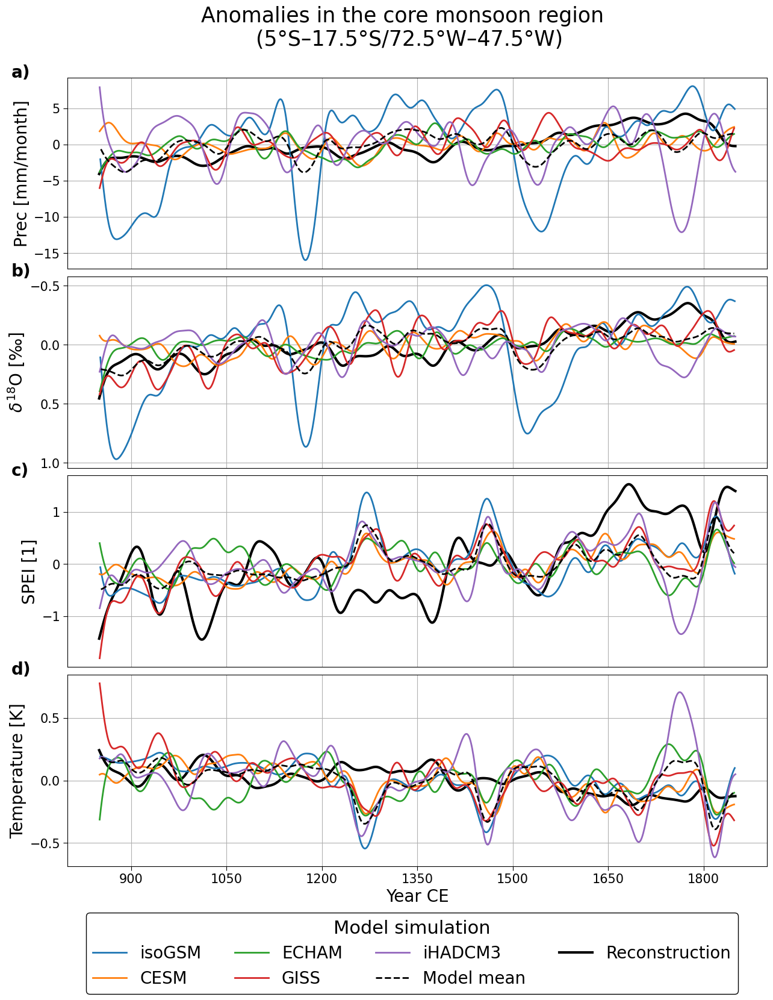

In [78]:
fig=plot4_simus(
basepath='/home/mchoblet/paleoda/results/experiments/paper/revision/',
mode='/normal_err/annual/proxy_frac/all_proxies/',
res=1/50,
title='Anomalies in the core monsoon region \n (5°S–17.5°S/72.5°W–47.5°W)',
    lw=3,
    lims=None,
    exclude=True,
    time=['0850','1850'])

fig.savefig(savepath+'fig4_model_simus.pdf', dpi='figure', format='pdf',bbox_inches='tight')

# Appendix: Correlation between locations/regions and variables in the different model simulations.

- Can be used for instance to study east-west dipole in d18O of precipitation
- Longer preparatory section because I load the model data once, and then compute correlations between variables/locations
- Loading can take longer (especially iHADCM3 because of NaN treatment9

In [42]:
paths_up={'Echam':{'d18O':'/home/mchoblet/paleoda/data/model_data/upsampled/ECHAM5_d18O_850_1849.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/upsampled/ECHAM5_prec_850_1849.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/upsampled/ECHAM5_tsurf_850_1849.nc',
'spei':'/home/mchoblet/paleoda/data/model_data/upsampled/ECHAM5_spei_pearson_12.nc',
               },    
'GISS':{'d18O':'/home/mchoblet/paleoda/data/model_data/upsampled/GISS_d18O_850_1849.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/upsampled/GISS_prec_850_1849.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/upsampled/GISS_tsurf_850_1849.nc',
'spei':'/home/mchoblet/paleoda/data/model_data/upsampled/GISS_spei_pearson_12.nc',
       },
      
'iCESM':{'d18O':'/home/mchoblet/paleoda/data/model_data/upsampled/CESM_d18O_850_1850.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/upsampled/CESM_prec_850_1850.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/upsampled/CESM_tsurf_850_1850.nc',
'spei':'/home/mchoblet/paleoda/data/model_data/upsampled/CESM_spei_pearson_12.nc',
        },

'isoGSM':{'d18O':'/home/mchoblet/paleoda/data/model_data/upsampled/CCSM_d18O_851_1850.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/upsampled/CCSM_prec_851_1850.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/upsampled/CCSM_tsurf_851_1850.nc',
'spei':'/home/mchoblet/paleoda/data/model_data/upsampled/CCSM_spei_pearson_12.nc',
         },

'iHADCM3':{'d18O':'/home/mchoblet/paleoda/data/model_data/upsampled/iHADCM3_d18O_801_1952.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/upsampled/iHADCM3_prec_801_1952.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/upsampled/iHADCM3_tsurf_801_1952.nc',
'spei':'/home/mchoblet/paleoda/data/model_data/upsampled/iHADCM3_spei_pearson_12.nc',
          },
      }


### For each model, compute annual/seasonal means. Load everything once, will make things easier.
#TAKES along time because of ihadcm3.

dic1={}

#single number means starting month (for annual mean), else specific seasonal mean
avgs=[12]
start='0852';end='1849' #time slice important for spei that starts one year later, else I can't compute correlation between different variables

#loop over models
for mod in paths_up.keys():
    print(mod) #for progress
    dic={}
    if mod=='iHADCM3':
        check_nan=True
    else:
        check_nan=False
    #loop over variables
    for v in paths_up[mod].keys():
        data=xr.open_dataset(paths_up[mod][v])[v]
        data=data.sel(time=slice(start,end))
        #loop over average types
        dic2={}
        for avg in avgs:
            if mod=='iHADCM3':
                data=data.resample(time='1M').mean('time')
            mean=annual_mean(data,avg=avg,check_nan=check_nan)
            dic2[str(avg)]=mean
        dic[v]=dic2

    dic1[mod]=dic

Echam
GISS
iCESM
isoGSM
iHADCM3


In [7]:
def correl_calc(dic0=dic1,model='Echam',var1='d18O', avg1='None', var2='tsurf',avg2='None',lat=-21.08,lon=(360-55.58),length=1):
    """
    compute correlation between variables in a model simulation. avg1 and avg2 define how the time averages where computed previously (either annually starting in month ... or for seasonal means).
    For simplicity here only annual averages are used
    """
    lat_bounds=(30,-65)
    lon_bounds=(250,340)
    if var1!='d18O_inf' and var1!='d18O_prec':
        data1=dic0[model][var1][avg1]
    else:
        data1=dic0[model][var1]
    data2=dic0[model][var2][avg2]
    data1=data1.sel(lat=slice(lat_bounds[0],lat_bounds[1]),lon=slice(lon_bounds[0],lon_bounds[1]))
    data2=data2.sel(lat=slice(lat_bounds[0],lat_bounds[1]),lon=slice(lon_bounds[0],lon_bounds[1]))
    
    if model=='iHADCM3':
        data1=data1.sel(time=slice('0850','1850'))
        data2=data2.sel(time=slice('0850','1850'))
        
    #eventually compute 
    if length>1:
        data1=data1.coarsen(time=length,boundary='trim').mean('time')
        data2=data2.coarsen(time=length,boundary='trim').mean('time')
    
    loc=data1.sel(lat=lat,lon=lon, method='nearest')
    time=loc['time'].values
    data2['time']=time
    correl=xr.corr(loc,data2,dim='time')
    
    return correl

def correlation_map(dic0=dic1,mode='var',cmap='RdBu_r',var1='d18O',avg1='None',avg2='None',length=1,levels=20,lat=-21.08,lon=(360-55.58),figsize=(20,24),
                    title='Local correlation',
                    variables=['d18O','prec','tsurf','spei'],variables_f=['$\delta^{18}$O','Prec','Temp','SPEI'],var2='tsurf'):
    """
    Plot correlation between var1 and location (lat,lon) and all other grid cells and variables for each model simulation
    """
    # Define the figure and each axis for the 3 rows and 3 columns
    fig, axes = plt.subplots(nrows=len(variables),ncols=5,
                            subplot_kw={'projection': ccrs.PlateCarree()},
                            figsize=figsize)
    map_extent=[250,340,-65,30]

    for j,mod in enumerate(paths_up.keys()):
        for i,var2 in enumerate(variables):  
            ax_map=axes[i,j]
            if j==0:       
                ax_map.text(-0.5,0.5,str(variables_f[i]),fontsize=25,horizontalalignment='center',
                            verticalalignment='center', transform=ax_map.transAxes)
            correl=correl_calc(dic0,model=mod, var1=var1, avg1=avg1, var2=var2,avg2=avg2,lat=lat,lon=lon,length=length)
            if var2=='spei':                
                correl['lon']=(correl.lon+180)%360-180
                correl=correl.sortby('lon')
                lat_g=correl['lat']; lon_g=correl['lon']
                lat_grid,lon_grid=np.meshgrid(lat_g,lon_g)
                on_land=globe.is_land(lat_grid, lon_grid).T
                correl=xr.where(on_land,correl,np.nan) 
                
            plot=correl.plot(ax=ax_map,add_colorbar=False,vmin=-1,vmax=1,cmap=cmap,levels=levels)
            scatter=ax_map.scatter(lon,lat,s=200, transform=ccrs.PlateCarree(),marker='*', facecolor="None",edgecolors='black',linewidth=2)
            if i==0: ax_map.set_title(mod,fontsize=25)
            else: ax_map.set_title('',fontsize=25)                

            ax_map.add_feature(cfeature.COASTLINE,zorder=1)        
            gl=ax_map.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=False, dms=True, x_inline=False, y_inline=False)
            ax_map.set_extent(map_extent, crs=ccrs.PlateCarree())
        
    #FIGURE TWEAKS
    fig.suptitle(title,fontsize=35,y=0.95)

    p0=axes.flatten()[-5].get_position().get_points().flatten()
    p2=axes.flatten()[-1].get_position().get_points().flatten()

    from matplotlib import ticker
    #colormap variableplot
    ax_cbar1 = fig.add_axes([p0[0], p0[1]-0.05, (p2[2]-p0[0]), 0.02])

    cb=fig.colorbar(plot, cax=ax_cbar1, orientation='horizontal',cmap=cmap)
    cb.ax.tick_params(labelsize=20)
    tick_locator = ticker.MaxNLocator(nbins=6)
    cb.locator = tick_locator
    cb.update_ticks()

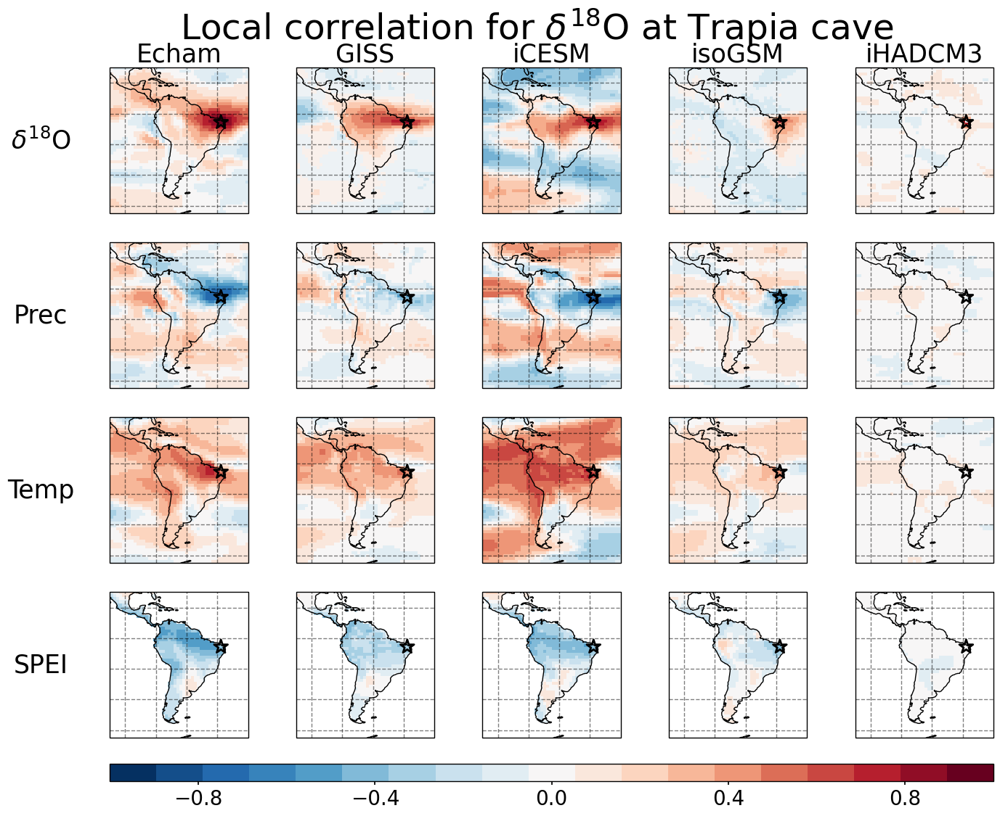

In [95]:
fig=correlation_map(cmap='RdBu_r',var1='d18O',avg1='12',avg2='12',length=1,levels=20,lat=-5.6,lon=(322.3),title='Local correlation for $\delta^{18}$O at Trapia cave',figsize=(16,12))

## Correlation between mean of a region and grid cells

In [43]:
def plotter(dic0=dic1,var1='prec',region=[[-17.5,-5],[287.5,312.5]],avg1='None',avg2='12',variables=['d18O','prec','tsurf','spei'],
            variables_f=['$\delta^{18}$O','Prec','Temp','SPEI'],figsize=(10,12),
           title='Correlation to monsoon box average of $\delta^{18}$O',y0=1):
    """
    Computes correlation between a region and grid cells

    """
    #global var
    #variables=['d18O_inf','tsurf','prec']
    cmap='RdBu_r'
    #bounds
    lat_bounds=(30,-65)
    lon_bounds=(250,340)
    resample=False #'10YS'#False #e.g. '20YS'
    levels=20
    fig, axes = plt.subplots(nrows=len(variables),ncols=5,subplot_kw={'projection': ccrs.PlateCarree()},figsize=figsize)
    map_extent=[250,340,-65,30]
    for j,mod in enumerate(paths_up.keys()):
        local=dic0[mod][var1][avg1]
        local=regionalmean(local,region[0],region[1])
        for i,var2 in enumerate(variables):
            glob=dic0[mod][var2][avg2]
            glob=glob.sel(lat=slice(lat_bounds[0],lat_bounds[1]),lon=slice(lon_bounds[0],lon_bounds[1]))
            if resample!=False:
                glob=glob.resample(time=resample).mean('time')
                local=local.resample(time=resample).mean('time')
            ax_map=axes[i,j]
            try:
                local['time']=glob.time.values            
                correl=xr.corr(local,glob,dim='time')
            except:
                pass

            plot=correl.plot(ax=ax_map,add_colorbar=False,vmin=-1,vmax=1,cmap=cmap,levels=levels)            
            ax_map.add_feature(cfeature.COASTLINE,zorder=1)        
            #gl=ax_map.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=False, dms=True, x_inline=False, y_inline=False)
            ax_map.set_extent(map_extent, crs=ccrs.PlateCarree())
            ax_map.plot([region[1][0],region[1][1],region[1][1],region[1][0],region[1][0]],[region[0][0],region[0][0],region[0][1],region[0][1],region[0][0]],color='black',transform=ccrs.PlateCarree(),lw=2)    
            if j==0:       
                ax_map.text(-0.5,0.5,str(variables_f[i]),fontsize=25,horizontalalignment='center',
                            verticalalignment='center', transform=ax_map.transAxes)
            if i==0:
                ax_map.set_title(mod,fontsize=25)
            else:
                ax_map.set_title('',fontsize=25)
    #FIGURE TWEAKS
    fig.suptitle(title,fontsize=30,y=y0)
    p0=axes.flatten()[-5].get_position().get_points().flatten()
    p2=axes.flatten()[-1].get_position().get_points().flatten()
    from matplotlib import ticker
    #colormap variableplot
    ax_cbar1 = fig.add_axes([p0[0], p0[1]-0.05, (p2[2]-p0[0]), 0.02])
    cb=fig.colorbar(plot, cax=ax_cbar1, orientation='horizontal',cmap=cmap)
    cb.ax.tick_params(labelsize=20)
    tick_locator = ticker.MaxNLocator(nbins=6)
    cb.locator = tick_locator
    cb.update_ticks()
    
    plt.subplots_adjust(wspace=0.05,hspace=0.05)
    return fig

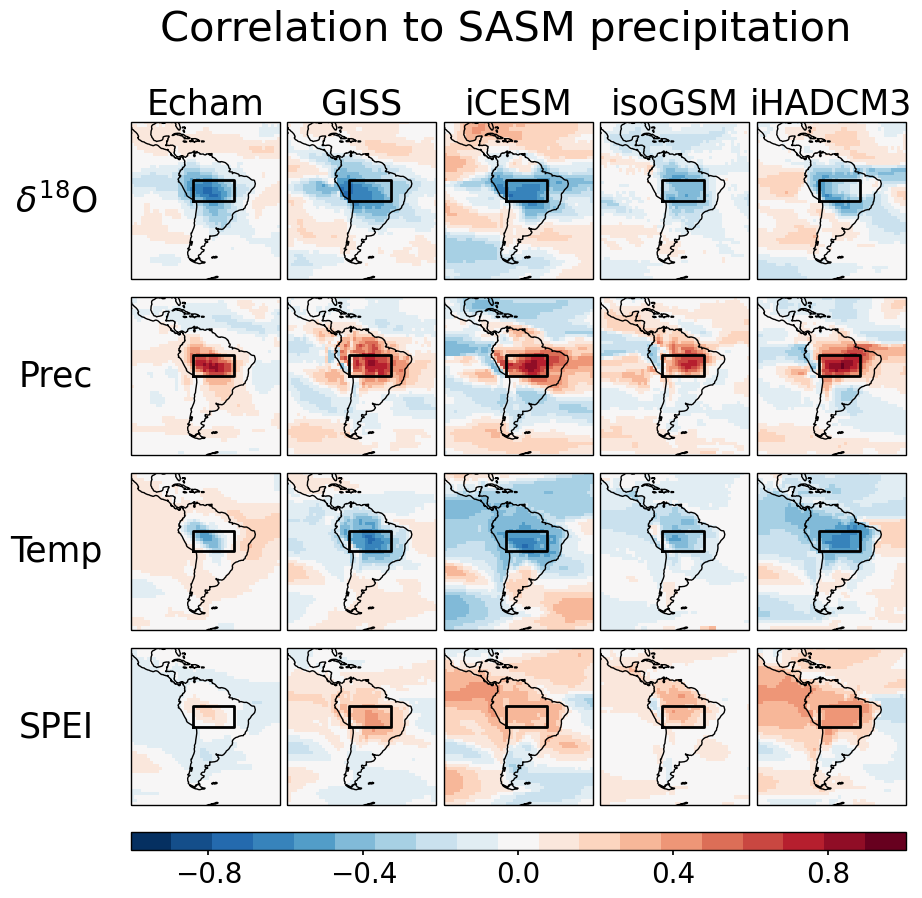

In [44]:
fig=plotter(var1='prec',region=[[-17.5,-5],[287.5,312.5]],avg1='12',avg2='12',figsize=(10,9),
           title='Correlation to SASM precipitation')

fig.savefig(savepath+'app_sasm_corr.pdf', dpi='figure', format='pdf',bbox_inches='tight')

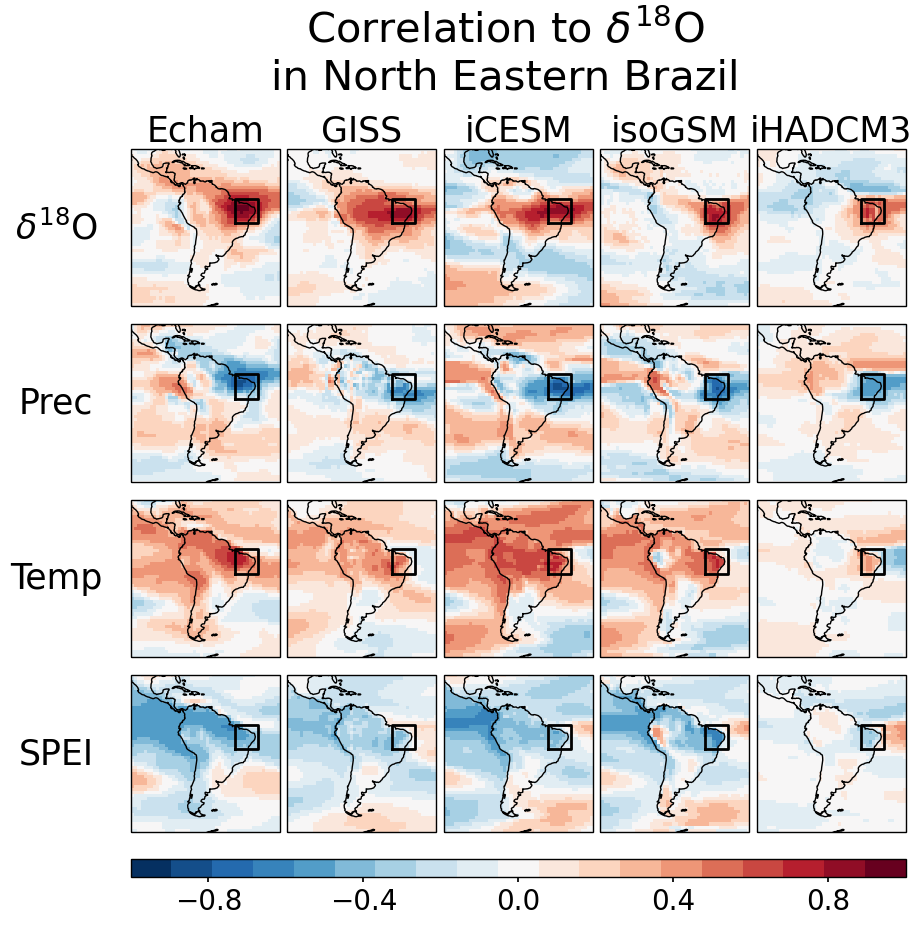

In [45]:
fig=plotter(var1='d18O',region=[[-15,0],[313,327]],avg1='12',avg2='12',figsize=(10,9),
           title='Correlation to $\delta^{18}$O\nin North Eastern Brazil',y0=1.03)

fig.savefig(savepath+'app_neb_corr.pdf', dpi='figure', format='pdf',bbox_inches='tight')

# Appendix: Proxy record anomalies before 400CE.
* To check the proxy record anomalies. I only focus on  speleothems, lake sediments and ice core proxy records, as I can easily overlay all of them into a single plot. The few tree rings during that period (from the southern cone), should not play a role
* For convenience I just run parts of the PaleoDA script to extract the resampled proxy record anomalies (It would also be possible to extract values from the reconstruction files)

In [25]:
import sys
#adjust this to the file path where utils_new and kalman_filters is stored!
sys.path.append('/home/mchoblet/paleoda')

import xarray as xr
import numpy as np
import cftime
import pandas as pd
import os
from types import SimpleNamespace
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature  

import utils_new
import kalman_filters
import warnings

import tqdm
import copy
import sys
import json

warnings.filterwarnings('ignore')
warnings.simplefilter("ignore",category=DeprecationWarning) 
warnings.simplefilter("ignore",category=FutureWarning) 

cfg={
    'basepath':'/home/mchoblet/paleoda/data/model_data/upsampled/', #for the modeldata
        'vp':{
    'd18O':'ECHAM5_d18O_850_1849.nc',
    'prec':'ECHAM5_prec_850_1849.nc',
    'tsurf': 'ECHAM5_tsurf_850_1849.nc',
    'spei':'ECHAM5_spei_pearson_12.nc',
    },
    'savepath':'/home/mchoblet/paleoda/results/experiments/paper/annual/normal/test.nc',
    'multi_model_prior':None,
    'prior_cut_time':['0852'], #due to the calculation of the spei, we loose one year and have to cut all priors according
    'avg':[12,1,2], #this is the interesting part
    'avg_proxies':4, #How to treat the annual proxies (from which month to start) 
    'seed': 42, 
    'obsdata':[
        #'/home/mchoblet/paleoda/data/proxy_dbs/paper/trees_djf.nc',
        #'/home/mchoblet/paleoda/data/proxy_dbs/paper/corals_djf.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc',
        #'/home/mchoblet/paleoda/data/proxy_dbs/paper/marine.nc',
        #'/home/mchoblet/paleoda/data/proxy_dbs/paper/sclero.nc',
        '/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc',
        ],

    'proxy_time':['0001','2015'], #only cut the proxies after resampling them (else we might loose resampling info for the last point (smaller zero?)
    'resample_mode': 'nearest',
    'mask': 3, 
    'psm':['prec_weighted','individual', 'prec_weighted'], #individual will loop over each proxy. season check t
    'timescales':['1','5','10'], #all timescales
    'db_timescales':['1','5','10'], #for each db define a timescale on that it is supposed to be used
    #'db_timescales':['1','1','5','1','5','10'], #for each db define a timescale on that it is supposed to be used
    'reuse':False, #testwise to true
    #'noise_assum':['None','None',0.5,0.5,0.5,0.5,0.5],
    'noise_assum':[0.5,0.5,0.5],
    'equal_fac':1, #option in case I use noise_assum='equal'. This way I can multiply the error with a factor
    #'noise_assum':['None',0.5,0.5,0.5,0.5,0.5],
    ###KALMAN-FILTER
    'time': ['0001','2000'], #Add zero for 3digit years (e.g. 0850)
    'anomaly_time':['1750','1850'],
    'regional_bounds':[[-65,35],[250,340]], #sorted from negative to positive!!
    'reps':50, #number of monte carlo repetition
    'seed':42, #seed for random number generator
    'nens':100, #ensemble members
    'proxy_frac':0.8,
    'proxy_frac':1,
    #'proxy_frac':None,
    'smallest_timescale':1,
}

c=SimpleNamespace(**cfg)
#load proxiy databases
proxy_db_all=utils_new.load_proxies(c)
#get the list of variables and seasons required for PSMs
variab_list,variab_season_dict=utils_new.variable_prep(proxy_db_all)
#load priors, apply psms. multi-model loop is an artefact from times where i used the multi-model ensemble directly. now i perform reconstructions separately and compute the mean afterwards
split_vector,names_vector,values_vector,names_short_vector,values_vector_list,MC_idx_list,HXfull_all_fin,coordinates=utils_new.load_priors_psm(c,variab_list,variab_season_dict,proxy_db_all)
#resample proxies (do this after loading priors as we eventually define the proxy error to be equal to the model variance)
final_list,final_list_r=utils_new.resample_wrap(c,proxy_db_all,HXfull_all_fin)

lons=np.concatenate([db['lon'] for db in proxy_db_all])
lats=np.concatenate([db['lat'] for db in proxy_db_all])
sites=np.concatenate([db['site'] for db in proxy_db_all])

var_names=np.concatenate([db['variable_name'] for db in proxy_db_all])

Load prior data
Compute seasonal means
Apply Proxy System Models
Resample proxy records


100%|██████████| 22/22 [00:01<00:00, 18.70it/s]


In [72]:
def plot_first_centuries():
    names_all=[]
    lats_all=[]
    lons_all=[]
    var_all=[]
    val_all=[]
    i_s=[]


    cmaps={'tsurf':'RdBu','d18O':'PiYG_r'}
    min_max={'tsurf':[-0.4,0.4],'d18O':[-1,1]}
    #limits=[['0000','0100'],['0100','0200'],['0200','0300'],['0300','0400'],['1750','1850']]
    limits=[['0000','0100'],['0100','0200'],['0200','0300'],['0300','0400']]
    map_extent=[250,340,-65,35]
    markersize=100
    alpha=0.9
    figsize=(15,5)
    fig,ax=plt.subplots(nrows=1,ncols=len(limits),figsize=figsize,subplot_kw={'projection': ccrs.PlateCarree()})
    for i,ts in enumerate(limits):
        for fl in final_list:
            fl=fl.sel(time=slice(ts[0],ts[1])).dropna('site',how='all').mean('time')
            fl=fl.isel(site=np.argsort(np.abs(fl)).values)
            leng=len(fl.site.values)
            for j,s in enumerate(fl.site.values):
                idx=np.argwhere(sites==s)[0][0]
                var_n=var_names[idx]
                lat=lats[idx]
                lon=lons[idx]
                if var_n=='tsurf':
                    marker='d'
                else:
                    marker='o'
   
                ax[i].scatter(lon,lat,marker=marker,c=fl.sel(site=s).values,edgecolor='k',s=markersize,cmap=
                              cmaps[var_n],vmax=min_max[var_n][1],
                             vmin=min_max[var_n][0],alpha=alpha,zorder=j)

                names_all.append(s);lats_all.append(lat);lons_all.append(lon);var_all.append(var_n);val_all.append(fl.sel(site=s).values)
        
        ax[i].set_extent(map_extent, crs=ccrs.PlateCarree())
        #add monsoon box
        ax[i].plot([285.5,312.5,312.5,285.5,285.5],[-17.5,-17.5,-5,-5,-17.5], transform=ccrs.PlateCarree(),color='black')
        ax[i].coastlines()
        string=str(i*100)+'-'+str((i+1)*100)+' CE'
        ax[i].set_title(string,fontsize=20)

    
    # Calculate the position of the colorbars
    colorbar_height = 0.04
    colorbar_y = 0.1

    # Create the colorbars
    for i, (label, cmap) in enumerate(cmaps.items()):
        cax = fig.add_axes([0.25 + i * 0.25, colorbar_y, 0.2, colorbar_height])
        norm = plt.Normalize(vmin=min_max[label][0], vmax=min_max[label][1])
        if label=='d18O':
            label='$\delta^{18}$O (circle)'
        elif label=='tsurf':
            label='tsurf (diamond)'
        cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cax, orientation='horizontal')
        cb.set_label(label,fontsize=20)
    
    fig.suptitle('Proxy record anomalies during the first four centuries \n (speleothems, lake sediments and ice cores)',fontsize=25,y=1.02)
    
    plt.subplots_adjust(wspace=0.05)
    
    return fig

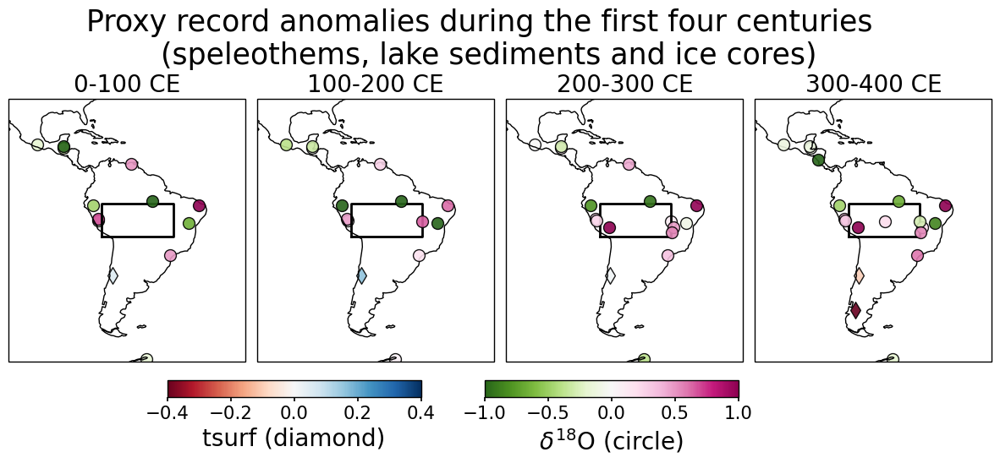

In [73]:
fig=plot_first_centuries()

fig.savefig(savepath+'app_400ce.pdf', dpi='figure', format='pdf',bbox_inches='tight')

In [52]:
#Print values in form of a dataframe.

df = pd.DataFrame({
    'Name': names_all,
    'Latitude': lats_all,
    'Longitude': lons_all,
    'Variable': var_all,
    'Value': val_all,
    'i':i_s,
})

# Reshape the DataFrame using pivot_table
df_pivot = df.pivot_table(index=['Name', 'Latitude', 'Longitude','Variable'], columns='i', values='Value', fill_value=np.nan)

# Reset the index to flatten the multi-level columns
df_pivot.reset_index(inplace=True)

# Rename the columns
df_pivot.columns = ['Name', 'Latitude', 'Longitude','Variable', 'Value_1', 'Value_2', 'Value_3','Value_4']

# Display the reshaped DataFrame
df_pivot=df_pivot.sort_values('Latitude',ascending=False)
display(df_pivot)

,Name,Latitude,Longitude,Variable,Value_1,Value_2,Value_3,Value_4
6,Juxtlahuaca cave,17.4000,260.8000,d18O,-0.190030,-0.388091,-0.003240,-0.122975
11,Macal Chasm,16.8830,270.8920,d18O,-0.992480,-0.312578,-0.282561,-0.110337
20,Yok Balum cave,16.2086,270.9265,d18O,-0.267326,-0.059084,0.119757,-0.085828
7,Lago El Grancho,11.9000,274.0833,d18O,NaN,NaN,NaN,-1.659050
0,Caripe Cave,10.1700,296.4500,d18O,0.494261,0.264609,0.434016,NaN
14,Paraiso cave,-4.0667,304.5500,d18O,-1.176891,-1.055158,-0.921955,-0.671562
19,Trapiá cave,-5.6000,322.3000,d18O,1.335760,0.621062,0.977932,1.299290
16,Shatuca cave,-5.7000,282.1000,d18O,-0.476366,-0.992293,-0.792677,-0.479431
10,Laguna Pumacocha,-10.7000,283.9400,d18O,0.685488,0.470297,0.252881,0.358212
4,Huagapo cave,-11.2700,284.2100,d18O,-0.139020,0.015863,0.232674,0.309451


/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/xarray/coding/times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/xarray/core/indexing.py:556: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(


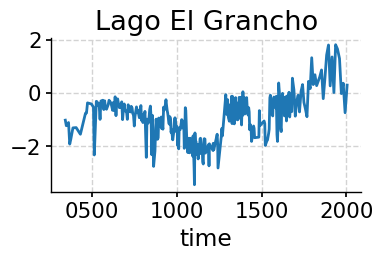

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:454: CFWarning: this date/calendar/year zero convention is not supported by CF
  return cftime.date2num(ticks, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:228: CFWarning: this date/calendar/year zero convention is not supported by CF
  dt = cftime.num2date(x, self.time_units, calendar=self.calendar)


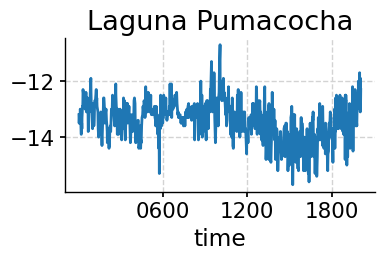

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:454: CFWarning: this date/calendar/year zero convention is not supported by CF
  return cftime.date2num(ticks, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:228: CFWarning: this date/calendar/year zero convention is not supported by CF
  dt = cftime.num2date(x, self.time_units, calendar=self.calendar)


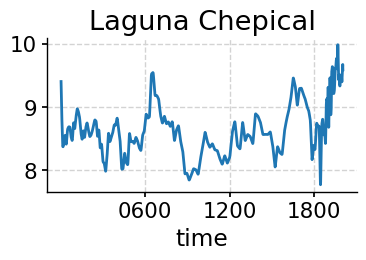

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(


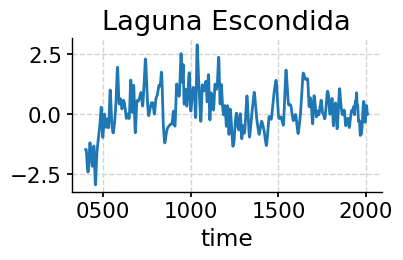

In [8]:
data=xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/paper/lakes.nc').to_array()
for s in data.site.values:
    vals=data.sel(site=s).dropna('time')
    if vals.dropna('time').time.dt.year[0]<500:  
        plt.figure(figsize=(4,2))
        vals.plot()
        plt.title(data.sel(site=s)['geo_siteName'].values.item())
        plt.show()

In [ ]:
data=xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/paper/glacier_ice.nc').to_array()
for s in data.site.values:
    vals=data.sel(site=s).dropna('time')
    if vals.dropna('time').time.dt.year[0]<500:  
        plt.figure(figsize=(4,2))
        vals.plot()
        plt.title(data.sel(site=s)['geo_siteName'].values.item())
        plt.show()

In [ ]:
data=xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc').to_array()
for s in data.site.values:
    vals=data.sel(site=s).dropna('time')
    if vals.dropna('time').time.dt.year[0]<500:  
        plt.figure(figsize=(4,2))
        vals.plot()
        plt.title(data.sel(site=s)['geo_siteName'].values.item())
        plt.show()

# Additional: Proxy record error rolling variance justification

Investigating the right proxy record error for non-calibratable proxy record errors (See Section 3.4 of paper).
The simple SNR to Error conversion would overestimate the error for proxy record time series with strong trends/shifts, as shown in the following

In [17]:
basepath3='/home/mchoblet/paleoda/data/model_data/upsampled/'

model_names={'CESM':
    {'tsurf':'CESM_tsurf_850_1850.nc',
     'prec':'CESM_prec_850_1850.nc',
     'd18O':'CESM_d18O_850_1850.nc',
     'slp':'CESM_slp_850_1850.nc',
     'spei':'CESM_spei_851_1850.nc',
     'pdsi':'CESM_pdsi_850_1850.nc',
    },
'isoGSM':
    {'tsurf':'CCSM_tsurf_851_1850.nc',
     'prec':'CCSM_prec_851_1850.nc',
     'd18O':'CCSM_d18O_851_1850.nc',
     'slp':'CCSM_slp_851_1850.nc',
     'spei':'CCSM_spei_852_1850.nc',
     'pdsi':'CCSM_pdsi_851_1850.nc',
    },
'iHadCM3':
    {'tsurf':'iHADCM3_tsurf_801_1952.nc',
     'prec':'iHADCM3_prec_801_1952.nc',
     'd18O':'iHADCM3_d18O_801_1952.nc',
     'slp':'iHADCM3_slp_801_1952.nc',
     'spei':'iHADCM3_spei_802_1952.nc',
     'pdsi':'iHADCM3_pdsi_801_1952.nc',
    },
'ECHAM5':
    {'tsurf':'ECHAM5_tsurf_850_1849.nc',
     'prec':'ECHAM5_prec_850_1849.nc',
     'd18O':'ECHAM5_d18O_850_1849.nc',
     'slp':'ECHAM5_slp_850_1849.nc',
     'spei':'ECHAM5_spei_851_1849.nc',
     'pdsi':'ECHAM5_pdsi_850_1849.nc',
    },
'GISS':
    {'tsurf':'GISS_tsurf_850_1849.nc',
     'prec':'GISS_prec_850_1849.nc',
     'd18O':'GISS_d18O_850_1849.nc',
     'slp':'GISS_slp_850_1849.nc',
     'spei':'GISS_spei_851_1849.nc',
     'pdsi':'GISS_pdsi_850_1849.nc',
    }
    }

import sys
#adjust this to the file path where utils_new and kalman_filters is stored!
sys.path.append('/home/mchoblet/paleoda')

import utils_new
from types import SimpleNamespace

proxies=xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc').to_array().squeeze('variable')

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/xarray/coding/times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/xarray/core/indexing.py:556: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()


## Decadal d18O variability in models and overlaid decadal proxy variability (1850)

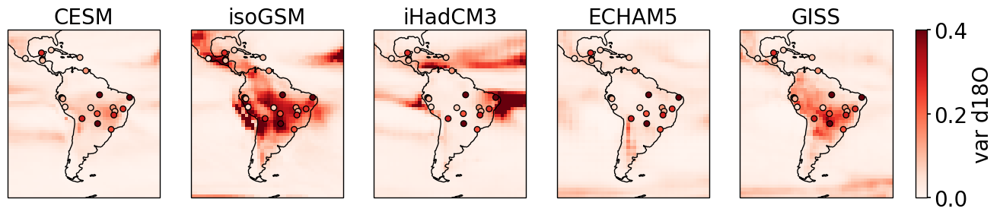

In [18]:
variab=[]
for s in proxies.site:
    prox=proxies[:,s].sel(time=slice('0852','1850')).dropna('time')
    prox=prox.resample(time='10YS').mean()
    var=prox.var('time')
    variab.append(var.values.item())
proxies['variabs']=('site',variab)

var='d18O'
ts='10YS'
fac=1
cmap='Reds'

fig,ax=plt.subplots(nrows=1,ncols=5,subplot_kw=dict(projection=ccrs.PlateCarree()),figsize=(15,5))
for i,k in enumerate(model_names.keys()):
    cfg={
    'basepath':basepath3,
    'vp':model_names[k],
    'prior_cut_time':None,
    'regional_bounds':None,
    }
    c=SimpleNamespace(**cfg)
    data=utils_new.precip_weighted(c,avg=4)
    data=data.sel(time=slice('0852','1850'))
    data=regioncut(data,[-65,35],[250,340])
    v=data.resample(time=ts).mean().var('time')
    plot=v.plot(ax=ax[i],vmin=0,vmax=0.4*fac,cmap=cmap,add_colorbar=False)
    ax[i].set_title(k,fontsize=20)
    ax[i].add_feature(cfeature.COASTLINE,zorder=1)
    
    ax[i].scatter(proxies['geo_meanLon'],proxies['geo_meanLat'],
            marker='o',
            c=proxies['variabs'],s=30,vmax=0.4*fac,vmin=0, transform=ccrs.Geodetic(),zorder=1,cmap=cmap,edgecolor='black')
    
#add the colorbar to the right    
p0=ax[-1].get_position().get_points().flatten()
ax_cbar1 = fig.add_axes([p0[2]+0.02, p0[1], 0.01, p0[3]-p0[1]])

cb=fig.colorbar(plot, cax=ax_cbar1, orientation='vertical',cmap=cmap)
cb.ax.tick_params(labelsize=20)
cb.set_label('var d18O',fontsize=20)

## Decadal d18O variability in models and overlaid decadal proxy record error (850-1850CE)

* Error calculated as:
    Proxy Var/(1+SNR**2)
* This is the variable of importance in reconstruction!
* The larger the error compared to the prior variance, the less influence proxy record will have

Text(0.5, 1.0, 'Paraiso cave')

/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:359: CFWarning: this date/calendar/year zero convention is not supported by CF
  lower = cftime.num2date(vmin, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:376: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.datetime(
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:454: CFWarning: this date/calendar/year zero convention is not supported by CF
  return cftime.date2num(ticks, self.date_unit, calendar=self.calendar)
/home/mchoblet/miniconda3/envs/paleoda/lib/python3.10/site-packages/nc_time_axis/__init__.py:228: CFWarning: this date/calendar/year zero convention is not supported by CF
  dt = cftime.num2date(x, self.time_units, calendar=self.calendar)


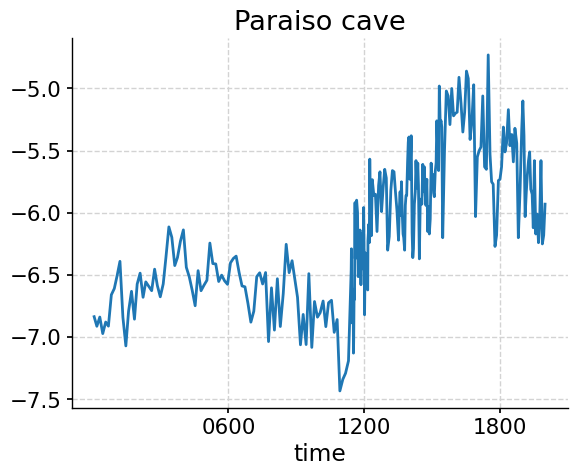

In [19]:
#paraiso cave
proxies.isel(site=7).dropna('time').plot()
plt.title(proxies.isel(site=7)['geo_siteName'].values)

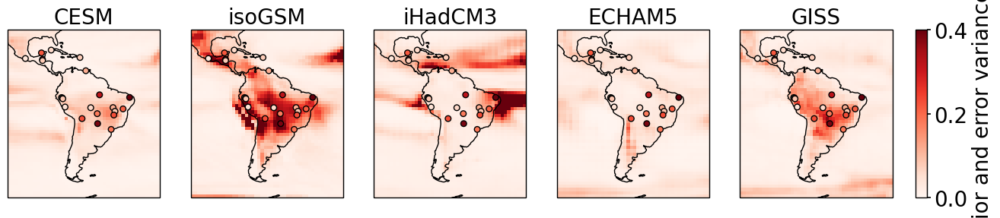

In [23]:
SNR=0.5

variab=[]
for s in proxies.site:
    prox=proxies[:,s].sel(time=slice('0852','1850')).dropna('time')
    prox=prox.resample(time='10YS').mean()
    var=prox.var('time')/(1+SNR**2)
    variab.append(var.values.item())
proxies['variabs']=('site',variab)

var='d18O'
ts='10YS'
fac=1
cmap='Reds'

fig,ax=plt.subplots(nrows=1,ncols=5,subplot_kw=dict(projection=ccrs.PlateCarree()),figsize=(15,5))
for i,k in enumerate(model_names.keys()):
    cfg={
    'basepath':basepath3,
    'vp':model_names[k],
    'prior_cut_time':None,
    'regional_bounds':None,
    }
    c=SimpleNamespace(**cfg)
    #p=basepath3+model_names[k][var]
    #data=xr.open_dataset(p)[var].sel(time=slice('0852','1850'))
    #data=regioncut(data,[-65,35],[250,340])
    #m=utils_new.annual_mean(data,4)
    data=utils_new.precip_weighted(c,avg=4)
    data=data.sel(time=slice('0852','1850'))
    data=regioncut(data,[-65,35],[250,340])
    v=data.resample(time=ts).mean().var('time')
    plot=v.plot(ax=ax[i],vmin=0,vmax=0.4*fac,cmap=cmap,add_colorbar=False)
    ax[i].set_title(k,fontsize=20)
    ax[i].add_feature(cfeature.COASTLINE,zorder=1)
    
    ax[i].scatter(proxies['geo_meanLon'],proxies['geo_meanLat'],
            marker='o',
            c=proxies['variabs'],s=30,vmax=0.4*fac,vmin=0, transform=ccrs.Geodetic(),zorder=1,cmap=cmap,edgecolor='black')
    
#add the colorbar to the right    
p0=ax[-1].get_position().get_points().flatten()
ax_cbar1 = fig.add_axes([p0[2]+0.02, p0[1], 0.01, p0[3]-p0[1]])

cb=fig.colorbar(plot, cax=ax_cbar1, orientation='vertical',cmap=cmap)
cb.ax.tick_params(labelsize=20)
cb.set_label('Prior and error variance',fontsize=20)

## Same using overlaid rolling/running bicentenial variability
* special records like paraiso cave stand out less

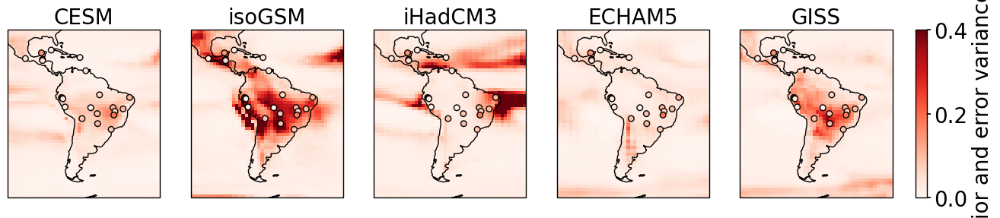

In [24]:
SNR=0.5

variab=[]
for s in proxies.site:
    prox=proxies[:,s].sel(time=slice('0852','1850')).dropna('time')
    prox=prox.resample(time='10YS').mean()
    var=prox.rolling(time=10).var().mean()
    noise=var/(1+SNR**2)
    variab.append(noise.values.item())
proxies['variabs']=('site',variab)

var='d18O'
ts='10YS'
fac=1
cmap='Reds'

fig,ax=plt.subplots(nrows=1,ncols=5,subplot_kw=dict(projection=ccrs.PlateCarree()),figsize=(15,5))

for i,k in enumerate(model_names.keys()):
    cfg={
    'basepath':basepath3,
    'vp':model_names[k],
    'prior_cut_time':None,
    'regional_bounds':None,
    }
    c=SimpleNamespace(**cfg)
    #p=basepath3+model_names[k][var]
    #data=xr.open_dataset(p)[var].sel(time=slice('0852','1850'))
    #data=regioncut(data,[-65,35],[250,340])
    #m=utils_new.annual_mean(data,4)
    data=utils_new.precip_weighted(c,avg=4)
    data=data.sel(time=slice('0852','1850'))
    data=regioncut(data,[-65,35],[250,340])
    v=data.resample(time=ts).mean().var('time')
    plot=v.plot(ax=ax[i],vmin=0,vmax=0.4*fac,cmap=cmap,add_colorbar=False)
    ax[i].set_title(k,fontsize=20)
    ax[i].add_feature(cfeature.COASTLINE,zorder=1)

    ax[i].scatter(proxies['geo_meanLon'],proxies['geo_meanLat'],
            marker='o',
            c=proxies['variabs'],s=30,vmax=0.4*fac,vmin=0, transform=ccrs.Geodetic(),zorder=1,cmap=cmap,edgecolor='black')
    
#add the colorbar to the right    
p0=ax[-1].get_position().get_points().flatten()
ax_cbar1 = fig.add_axes([p0[2]+0.02, p0[1], 0.01, p0[3]-p0[1]])

cb=fig.colorbar(plot, cax=ax_cbar1, orientation='vertical',cmap=cmap)
cb.ax.tick_params(labelsize=20)
cb.set_label('Prior and error variance',fontsize=20)

# Histograms comparing the ratio of variability to the nearest model location

* The goal is nto not have ratios about one. Too big ratios imply that the proxy records finally only have little influence
* 200 year rolling variance seems reasonable and physically sound.

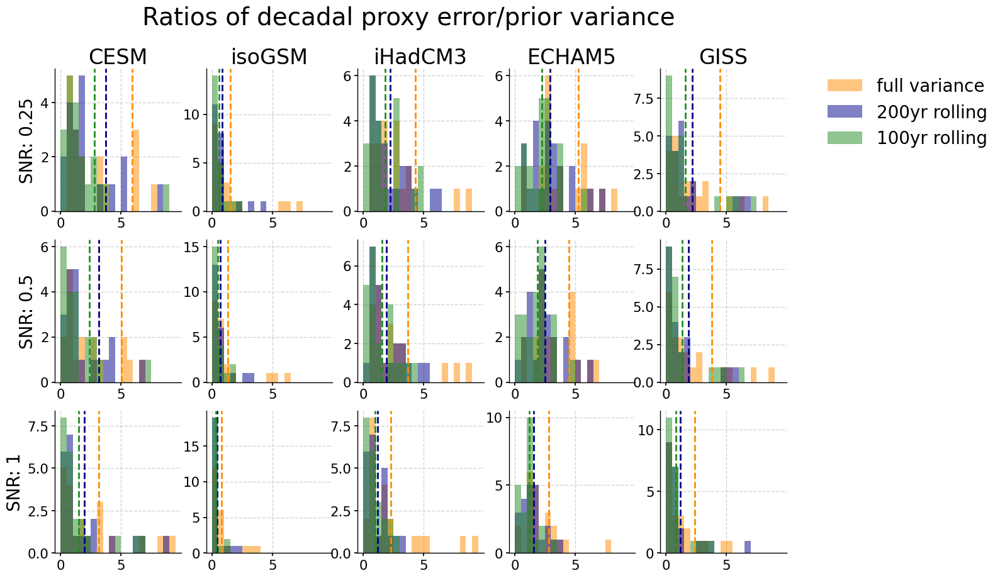

In [22]:
#rows for different models
fig,ax=plt.subplots(nrows=3,ncols=5,figsize=(15,10))
fig.suptitle('Ratios of decadal proxy error/prior variance',fontsize=28)
bins=np.arange(0,10,0.5)
var='d18O'
lw=2
alpha=0.5

for ii,snr in enumerate([0.25,0.5,1]):
    #compute three different errors
    variab1=[] #no rolling
    for s in proxies.site:
        prox=proxies[:,s].sel(time=slice('0852','1850')).dropna('time'); prox=prox.resample(time='10YS').mean(); var=prox.var('time')
        noise=var/(1+snr**2); variab1.append(noise.values.item())
    variab2=[]
    for s in proxies.site:
        prox=proxies[:,s].sel(time=slice('0852','1850')).dropna('time'); prox=prox.resample(time='10YS').mean(); var=prox.rolling(time=10).var().mean()
        noise=var/(1+snr**2); variab2.append(noise.values.item())
    variab3=[]
    for s in proxies.site:
        prox=proxies[:,s].sel(time=slice('0852','1850')).dropna('time'); prox=prox.resample(time='10YS').mean(); var=prox.rolling(time=20).var().mean()
        noise=var/(1+snr**2); variab3.append(noise.values.item())
        
    #loop over models
    for i,k in enumerate(model_names.keys()):
        cfg={
        'basepath':basepath3,
        'vp':model_names[k],
        'prior_cut_time':None,
        'regional_bounds':None,
        }
        c=SimpleNamespace(**cfg)
        #p=basepath3+model_names[k][var]
        #data=xr.open_dataset(p)[var].sel(time=slice('0852','1850'))
        #data=regioncut(data,[-65,35],[250,340])
        #m=utils_new.annual_mean(data,4)
        data=utils_new.precip_weighted(c,avg=4)
        data=data.sel(time=slice('0852','1850'))
        data=regioncut(data,[-65,35],[250,340])
        v=data.resample(time=ts).mean().var('time')
        #select values from nearest grid box
        estimates=v.sel(lat=proxies['geo_meanLat'],lon=proxies['geo_meanLon'],method='Nearest')

        ax[ii,i].hist(variab1/estimates,label='full variance',color='darkorange',bins=bins,alpha=alpha)
        ax[ii,i].axvline(x = np.mean(variab1/estimates),color='darkorange',lw=lw,ls='--')
        ax[ii,i].hist(variab3/estimates,label='200yr rolling',color='darkblue',bins=bins,alpha=alpha)
        ax[ii,i].axvline(x = np.mean(variab3/estimates),color='darkblue',lw=lw,ls='--')
        ax[ii,i].hist(variab2/estimates,label='100yr rolling',color='forestgreen',bins=bins,alpha=alpha)
        ax[ii,i].axvline(x = np.mean(variab2/estimates),color='forestgreen',lw=lw,ls='--')
        
        ax[ii,i].locator_params(nbins=4)
        
        if i==0:
            ax[ii,0].set_ylabel(('SNR: '+str(snr)),fontsize=20)
    
        if ii==0:
            ax[0,i].set_title(k,fontsize=24)
        
        ax[0,4].legend(fontsize=20,bbox_to_anchor=(1.2, 1.05))